In [1]:
# Suppressing Warnings
import warnings
warnings.filterwarnings('ignore')

# Import numpy
import numpy as np

# Import pandas
import pandas as pd

# Import matplot lib
import matplotlib.pyplot as plt
# Defining matplotlib to print inline
%matplotlib inline

# Import seaborn
import seaborn as sns

# Importing model selection module to train and test data
from sklearn.model_selection import train_test_split

# Import minmax scaler
from sklearn.preprocessing import MinMaxScaler

# Import GridsearchCV
from sklearn.model_selection import GridSearchCV

# Importing RFE
from sklearn.feature_selection import RFE

# Import Logistic Regression
from sklearn.linear_model import LogisticRegression

# Import Metrics
from sklearn import metrics

# Import classification_report
from sklearn.metrics import classification_report

# Import accuracy_score
from sklearn.metrics import accuracy_score

# Import VIF
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Import Statsmodels
import statsmodels.api as sm

# Import RandomForestClassifier
from sklearn.ensemble import RandomForestClassifier

# Import KFold
from sklearn.model_selection import KFold

# Import GridSearchCV
from sklearn.model_selection import GridSearchCV

# Import Confusion Matrix
from sklearn.metrics import confusion_matrix

# Import PCA
from sklearn.decomposition import PCA

# Import SMOTE
from imblearn.over_sampling import SMOTE

#setting below options to view more columns and rows
pd.options.display.max_rows = 1000
pd.options.display.max_columns = 1000

# Step 1: Load Data and Understand data

## Data Understanding

In [2]:
#Reading the csv file and loading into data frame
telecom_data = pd.read_csv("telecom_churn_data.csv", encoding = "ISO-8859-1", low_memory=False)

#### Get some insights about the data

In [3]:
#checking the size of the data
print("Current dataset we have {} rows and {} columns".format(telecom_data.shape[0],telecom_data.shape[1]))

Current dataset we have 99999 rows and 226 columns


In [4]:
telecom_data.head(10)

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,

In [5]:
#Lets check the datatypes
telecom_data.info(verbose=1)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Data columns (total 226 columns):
 #   Column                    Dtype  
---  ------                    -----  
 0   mobile_number             int64  
 1   circle_id                 int64  
 2   loc_og_t2o_mou            float64
 3   std_og_t2o_mou            float64
 4   loc_ic_t2o_mou            float64
 5   last_date_of_month_6      object 
 6   last_date_of_month_7      object 
 7   last_date_of_month_8      object 
 8   last_date_of_month_9      object 
 9   arpu_6                    float64
 10  arpu_7                    float64
 11  arpu_8                    float64
 12  arpu_9                    float64
 13  onnet_mou_6               float64
 14  onnet_mou_7               float64
 15  onnet_mou_8               float64
 16  onnet_mou_9               float64
 17  offnet_mou_6              float64
 18  offnet_mou_7              float64
 19  offnet_mou_8              float64
 20  offnet_mou_9              f

In [6]:
# Get statistics on the housing dataframe
telecom_data.describe()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
count,9.999900e+04,99999.0,98981.0,98981.0,98981.0,99999.000000,99999.000000,99999.000000,99999.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.0,96140.0,94621.0,92254.0,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621

# Step 2: Data Cleanup

#### Lets look for percentage of NaN's

In [7]:
count_na = telecom_data.isnull().sum()

In [8]:
# calculating missing values / na's 
count_na = count_na[count_na.values > (0.0000001 * len(telecom_data))]
(count_na/len(telecom_data) * 100)

loc_og_t2o_mou               1.018010
std_og_t2o_mou               1.018010
loc_ic_t2o_mou               1.018010
last_date_of_month_7         0.601006
last_date_of_month_8         1.100011
last_date_of_month_9         1.659017
onnet_mou_6                  3.937039
onnet_mou_7                  3.859039
onnet_mou_8                  5.378054
onnet_mou_9                  7.745077
offnet_mou_6                 3.937039
offnet_mou_7                 3.859039
offnet_mou_8                 5.378054
offnet_mou_9                 7.745077
roam_ic_mou_6                3.937039
roam_ic_mou_7                3.859039
roam_ic_mou_8                5.378054
roam_ic_mou_9                7.745077
roam_og_mou_6                3.937039
roam_og_mou_7                3.859039
roam_og_mou_8                5.378054
roam_og_mou_9                7.745077
loc_og_t2t_mou_6             3.937039
loc_og_t2t_mou_7             3.859039
loc_og_t2t_mou_8             5.378054
loc_og_t2t_mou_9             7.745077
loc_og_t2m_m

In [9]:
# Replacing blank values in the following columns with zero

telecom_data['total_rech_data_6'] = telecom_data['total_rech_data_6'].fillna(0)
telecom_data['total_rech_data_7'] = telecom_data['total_rech_data_7'].fillna(0)
telecom_data['total_rech_data_8'] = telecom_data['total_rech_data_8'].fillna(0)
telecom_data['total_rech_data_9'] = telecom_data['total_rech_data_9'].fillna(0)

telecom_data['av_rech_amt_data_6'] = telecom_data['av_rech_amt_data_6'].fillna(0)
telecom_data['av_rech_amt_data_7'] = telecom_data['av_rech_amt_data_7'].fillna(0)
telecom_data['av_rech_amt_data_8'] = telecom_data['av_rech_amt_data_8'].fillna(0)
telecom_data['av_rech_amt_data_9'] = telecom_data['av_rech_amt_data_9'].fillna(0)

telecom_data['fb_user_6'] = telecom_data['fb_user_6'].fillna(0)
telecom_data['fb_user_7'] = telecom_data['fb_user_7'].fillna(0)
telecom_data['fb_user_8'] = telecom_data['fb_user_8'].fillna(0)
telecom_data['fb_user_9'] = telecom_data['fb_user_9'].fillna(0)

telecom_data['night_pck_user_6'] = telecom_data['night_pck_user_6'].fillna(0)
telecom_data['night_pck_user_7'] = telecom_data['night_pck_user_7'].fillna(0)
telecom_data['night_pck_user_8'] = telecom_data['night_pck_user_8'].fillna(0)
telecom_data['night_pck_user_9'] = telecom_data['night_pck_user_9'].fillna(0)

telecom_data['arpu_2g_6'] = telecom_data['arpu_2g_6'].fillna(0)
telecom_data['arpu_2g_7'] = telecom_data['arpu_2g_7'].fillna(0)
telecom_data['arpu_2g_8'] = telecom_data['arpu_2g_8'].fillna(0)
telecom_data['arpu_2g_9'] = telecom_data['arpu_2g_9'].fillna(0)

telecom_data['arpu_3g_6'] = telecom_data['arpu_3g_6'].fillna(0)
telecom_data['arpu_3g_7'] = telecom_data['arpu_3g_7'].fillna(0)
telecom_data['arpu_3g_8'] = telecom_data['arpu_3g_8'].fillna(0)
telecom_data['arpu_3g_9'] = telecom_data['arpu_3g_9'].fillna(0)

telecom_data['count_rech_2g_6'] = telecom_data['count_rech_2g_6'].fillna(0)
telecom_data['count_rech_2g_7'] = telecom_data['count_rech_2g_7'].fillna(0)
telecom_data['count_rech_2g_8'] = telecom_data['count_rech_2g_8'].fillna(0)
telecom_data['count_rech_2g_9'] = telecom_data['count_rech_2g_9'].fillna(0)

telecom_data['count_rech_3g_6'] = telecom_data['count_rech_3g_6'].fillna(0)
telecom_data['count_rech_3g_7'] = telecom_data['count_rech_3g_7'].fillna(0)
telecom_data['count_rech_3g_8'] = telecom_data['count_rech_3g_8'].fillna(0)
telecom_data['count_rech_3g_9'] = telecom_data['count_rech_3g_9'].fillna(0)

telecom_data['total_rech_data_6'] = telecom_data['total_rech_data_6'].fillna(0)
telecom_data['total_rech_data_7'] = telecom_data['total_rech_data_7'].fillna(0)
telecom_data['total_rech_data_8'] = telecom_data['total_rech_data_8'].fillna(0)
telecom_data['total_rech_data_9'] = telecom_data['total_rech_data_9'].fillna(0)

telecom_data['onnet_mou_6'] = telecom_data['onnet_mou_6'].fillna(0)
telecom_data['onnet_mou_7'] = telecom_data['onnet_mou_7'].fillna(0)
telecom_data['onnet_mou_8'] = telecom_data['onnet_mou_8'].fillna(0)
telecom_data['onnet_mou_9'] = telecom_data['onnet_mou_9'].fillna(0)

telecom_data['offnet_mou_6'] = telecom_data['offnet_mou_6'].fillna(0)
telecom_data['offnet_mou_7'] = telecom_data['offnet_mou_7'].fillna(0)
telecom_data['offnet_mou_8'] = telecom_data['offnet_mou_8'].fillna(0)
telecom_data['offnet_mou_9'] = telecom_data['offnet_mou_9'].fillna(0)

telecom_data['roam_ic_mou_6'] = telecom_data['roam_ic_mou_6'].fillna(0)
telecom_data['roam_ic_mou_7'] = telecom_data['roam_ic_mou_7'].fillna(0)
telecom_data['roam_ic_mou_8'] = telecom_data['roam_ic_mou_8'].fillna(0)
telecom_data['roam_ic_mou_9'] = telecom_data['roam_ic_mou_9'].fillna(0)

telecom_data['roam_og_mou_6'] = telecom_data['roam_og_mou_6'].fillna(0)
telecom_data['roam_og_mou_7'] = telecom_data['roam_og_mou_7'].fillna(0)
telecom_data['roam_og_mou_8'] = telecom_data['roam_og_mou_8'].fillna(0)
telecom_data['roam_og_mou_9'] = telecom_data['roam_og_mou_9'].fillna(0)

telecom_data['loc_og_t2t_mou_6'] = telecom_data['loc_og_t2t_mou_6'].fillna(0)
telecom_data['loc_og_t2t_mou_7'] = telecom_data['loc_og_t2t_mou_7'].fillna(0)
telecom_data['loc_og_t2t_mou_8'] = telecom_data['loc_og_t2t_mou_8'].fillna(0)
telecom_data['loc_og_t2t_mou_9'] = telecom_data['loc_og_t2t_mou_9'].fillna(0)

telecom_data['loc_og_t2m_mou_6'] = telecom_data['loc_og_t2m_mou_6'].fillna(0)
telecom_data['loc_og_t2m_mou_7'] = telecom_data['loc_og_t2m_mou_7'].fillna(0)
telecom_data['loc_og_t2m_mou_8'] = telecom_data['loc_og_t2m_mou_8'].fillna(0)
telecom_data['loc_og_t2m_mou_9'] = telecom_data['loc_og_t2m_mou_9'].fillna(0)

telecom_data['loc_og_t2f_mou_6'] = telecom_data['loc_og_t2f_mou_6'].fillna(0)
telecom_data['loc_og_t2f_mou_7'] = telecom_data['loc_og_t2f_mou_7'].fillna(0)
telecom_data['loc_og_t2f_mou_8'] = telecom_data['loc_og_t2f_mou_8'].fillna(0)
telecom_data['loc_og_t2f_mou_9'] = telecom_data['loc_og_t2f_mou_9'].fillna(0)

telecom_data['loc_og_t2c_mou_6'] = telecom_data['loc_og_t2c_mou_6'].fillna(0)
telecom_data['loc_og_t2c_mou_7'] = telecom_data['loc_og_t2c_mou_7'].fillna(0)
telecom_data['loc_og_t2c_mou_8'] = telecom_data['loc_og_t2c_mou_8'].fillna(0)
telecom_data['loc_og_t2c_mou_9'] = telecom_data['loc_og_t2c_mou_9'].fillna(0)

telecom_data['loc_og_mou_6'] = telecom_data['loc_og_mou_6'].fillna(0)
telecom_data['loc_og_mou_7'] = telecom_data['loc_og_mou_7'].fillna(0)
telecom_data['loc_og_mou_8'] = telecom_data['loc_og_mou_8'].fillna(0)
telecom_data['loc_og_mou_9'] = telecom_data['loc_og_mou_9'].fillna(0)

telecom_data['std_og_t2t_mou_6'] = telecom_data['std_og_t2t_mou_6'].fillna(0)
telecom_data['std_og_t2t_mou_7'] = telecom_data['std_og_t2t_mou_7'].fillna(0)
telecom_data['std_og_t2t_mou_8'] = telecom_data['std_og_t2t_mou_8'].fillna(0)
telecom_data['std_og_t2t_mou_9'] = telecom_data['std_og_t2t_mou_9'].fillna(0)

telecom_data['std_og_t2m_mou_6'] = telecom_data['std_og_t2m_mou_6'].fillna(0)
telecom_data['std_og_t2m_mou_7'] = telecom_data['std_og_t2m_mou_7'].fillna(0)
telecom_data['std_og_t2m_mou_8'] = telecom_data['std_og_t2m_mou_8'].fillna(0)
telecom_data['std_og_t2m_mou_9'] = telecom_data['std_og_t2m_mou_9'].fillna(0)

telecom_data['std_og_t2f_mou_6'] = telecom_data['std_og_t2f_mou_6'].fillna(0)
telecom_data['std_og_t2f_mou_7'] = telecom_data['std_og_t2f_mou_7'].fillna(0)
telecom_data['std_og_t2f_mou_8'] = telecom_data['std_og_t2f_mou_8'].fillna(0)
telecom_data['std_og_t2f_mou_9'] = telecom_data['std_og_t2f_mou_9'].fillna(0)

telecom_data['std_og_t2c_mou_6'] = telecom_data['std_og_t2c_mou_6'].fillna(0)
telecom_data['std_og_t2c_mou_7'] = telecom_data['std_og_t2c_mou_7'].fillna(0)
telecom_data['std_og_t2c_mou_8'] = telecom_data['std_og_t2c_mou_8'].fillna(0)
telecom_data['std_og_t2c_mou_9'] = telecom_data['std_og_t2c_mou_9'].fillna(0)

telecom_data['std_og_mou_6'] = telecom_data['std_og_mou_6'].fillna(0)
telecom_data['std_og_mou_7'] = telecom_data['std_og_mou_7'].fillna(0)
telecom_data['std_og_mou_8'] = telecom_data['std_og_mou_8'].fillna(0)
telecom_data['std_og_mou_9'] = telecom_data['std_og_mou_9'].fillna(0)

telecom_data['isd_og_mou_6'] = telecom_data['isd_og_mou_6'].fillna(0)
telecom_data['isd_og_mou_7'] = telecom_data['isd_og_mou_7'].fillna(0)
telecom_data['isd_og_mou_8'] = telecom_data['isd_og_mou_8'].fillna(0)
telecom_data['isd_og_mou_9'] = telecom_data['isd_og_mou_9'].fillna(0)

telecom_data['spl_og_mou_6'] = telecom_data['spl_og_mou_6'].fillna(0)
telecom_data['spl_og_mou_7'] = telecom_data['spl_og_mou_7'].fillna(0)
telecom_data['spl_og_mou_8'] = telecom_data['spl_og_mou_8'].fillna(0)
telecom_data['spl_og_mou_9'] = telecom_data['spl_og_mou_9'].fillna(0)

telecom_data['og_others_6'] = telecom_data['og_others_6'].fillna(0)
telecom_data['og_others_7'] = telecom_data['og_others_7'].fillna(0)
telecom_data['og_others_8'] = telecom_data['og_others_8'].fillna(0)
telecom_data['og_others_9'] = telecom_data['og_others_9'].fillna(0)

telecom_data['loc_ic_t2t_mou_6'] = telecom_data['loc_ic_t2t_mou_6'].fillna(0)
telecom_data['loc_ic_t2t_mou_7'] = telecom_data['loc_ic_t2t_mou_7'].fillna(0)
telecom_data['loc_ic_t2t_mou_8'] = telecom_data['loc_ic_t2t_mou_8'].fillna(0)
telecom_data['loc_ic_t2t_mou_9'] = telecom_data['loc_ic_t2t_mou_9'].fillna(0)

telecom_data['loc_ic_t2m_mou_6'] = telecom_data['loc_ic_t2m_mou_6'].fillna(0)
telecom_data['loc_ic_t2m_mou_7'] = telecom_data['loc_ic_t2m_mou_7'].fillna(0)
telecom_data['loc_ic_t2m_mou_8'] = telecom_data['loc_ic_t2m_mou_8'].fillna(0)
telecom_data['loc_ic_t2m_mou_9'] = telecom_data['loc_ic_t2m_mou_9'].fillna(0)

telecom_data['loc_ic_t2f_mou_6'] = telecom_data['loc_ic_t2f_mou_6'].fillna(0)
telecom_data['loc_ic_t2f_mou_7'] = telecom_data['loc_ic_t2f_mou_7'].fillna(0)
telecom_data['loc_ic_t2f_mou_8'] = telecom_data['loc_ic_t2f_mou_8'].fillna(0)
telecom_data['loc_ic_t2f_mou_9'] = telecom_data['loc_ic_t2f_mou_9'].fillna(0)

telecom_data['loc_ic_mou_6'] = telecom_data['loc_ic_mou_6'].fillna(0)
telecom_data['loc_ic_mou_7'] = telecom_data['loc_ic_mou_7'].fillna(0)
telecom_data['loc_ic_mou_8'] = telecom_data['loc_ic_mou_8'].fillna(0)
telecom_data['loc_ic_mou_9'] = telecom_data['loc_ic_mou_9'].fillna(0)

telecom_data['std_ic_t2t_mou_6'] = telecom_data['std_ic_t2t_mou_6'].fillna(0)
telecom_data['std_ic_t2t_mou_7'] = telecom_data['std_ic_t2t_mou_7'].fillna(0)
telecom_data['std_ic_t2t_mou_8'] = telecom_data['std_ic_t2t_mou_8'].fillna(0)
telecom_data['std_ic_t2t_mou_9'] = telecom_data['std_ic_t2t_mou_9'].fillna(0)

telecom_data['std_ic_t2m_mou_6'] = telecom_data['std_ic_t2m_mou_6'].fillna(0)
telecom_data['std_ic_t2m_mou_7'] = telecom_data['std_ic_t2m_mou_7'].fillna(0)
telecom_data['std_ic_t2m_mou_8'] = telecom_data['std_ic_t2m_mou_8'].fillna(0)
telecom_data['std_ic_t2m_mou_9'] = telecom_data['std_ic_t2m_mou_9'].fillna(0)

telecom_data['std_ic_t2f_mou_6'] = telecom_data['std_ic_t2f_mou_6'].fillna(0)
telecom_data['std_ic_t2f_mou_7'] = telecom_data['std_ic_t2f_mou_7'].fillna(0)
telecom_data['std_ic_t2f_mou_8'] = telecom_data['std_ic_t2f_mou_8'].fillna(0)
telecom_data['std_ic_t2f_mou_9'] = telecom_data['std_ic_t2f_mou_9'].fillna(0)

telecom_data['std_ic_t2o_mou_6'] = telecom_data['std_ic_t2o_mou_6'].fillna(0)
telecom_data['std_ic_t2o_mou_7'] = telecom_data['std_ic_t2o_mou_7'].fillna(0)
telecom_data['std_ic_t2o_mou_8'] = telecom_data['std_ic_t2o_mou_8'].fillna(0)
telecom_data['std_ic_t2o_mou_9'] = telecom_data['std_ic_t2o_mou_9'].fillna(0)

telecom_data['std_ic_mou_6'] = telecom_data['std_ic_mou_6'].fillna(0)
telecom_data['std_ic_mou_7'] = telecom_data['std_ic_mou_7'].fillna(0)
telecom_data['std_ic_mou_8'] = telecom_data['std_ic_mou_8'].fillna(0)
telecom_data['std_ic_mou_9'] = telecom_data['std_ic_mou_9'].fillna(0)

telecom_data['spl_ic_mou_6'] = telecom_data['spl_ic_mou_6'].fillna(0)
telecom_data['spl_ic_mou_7'] = telecom_data['spl_ic_mou_7'].fillna(0)
telecom_data['spl_ic_mou_8'] = telecom_data['spl_ic_mou_8'].fillna(0)
telecom_data['spl_ic_mou_9'] = telecom_data['spl_ic_mou_9'].fillna(0)

telecom_data['isd_ic_mou_6'] = telecom_data['isd_ic_mou_6'].fillna(0)
telecom_data['isd_ic_mou_7'] = telecom_data['isd_ic_mou_7'].fillna(0)
telecom_data['isd_ic_mou_8'] = telecom_data['isd_ic_mou_8'].fillna(0)
telecom_data['isd_ic_mou_9'] = telecom_data['isd_ic_mou_9'].fillna(0)

telecom_data['ic_others_6'] = telecom_data['ic_others_6'].fillna(0)
telecom_data['ic_others_7'] = telecom_data['ic_others_7'].fillna(0)
telecom_data['ic_others_8'] = telecom_data['ic_others_8'].fillna(0)
telecom_data['ic_others_9'] = telecom_data['ic_others_9'].fillna(0)

telecom_data['loc_og_t2o_mou'] = telecom_data['loc_og_t2o_mou'].fillna(0)
telecom_data['std_og_t2o_mou'] = telecom_data['std_og_t2o_mou'].fillna(0)
telecom_data['loc_ic_t2o_mou'] = telecom_data['loc_ic_t2o_mou'].fillna(0)

# Replacing the following columns with last date of month
telecom_data['last_date_of_month_7'] = telecom_data['last_date_of_month_7'].fillna('7/31/2014')
telecom_data['last_date_of_month_8'] = telecom_data['last_date_of_month_8'].fillna('8/31/2014')
telecom_data['last_date_of_month_9'] = telecom_data['last_date_of_month_9'].fillna('9/30/2014')

## Filter the high-value customers

In [10]:
# Calculating total recharge amount
total_rech_6 = ((telecom_data['total_rech_num_6'] * telecom_data['total_rech_amt_6']) +  (telecom_data['total_rech_data_6'] * telecom_data['total_rech_data_6']))
total_rech_7 = ((telecom_data['total_rech_num_7'] * telecom_data['total_rech_amt_7']) +  (telecom_data['total_rech_data_7'] * telecom_data['total_rech_data_7']))

telecom_data['total_avg_rech_amt_6_and_7'] = ((total_rech_6 + total_rech_7) / 2)

# Calculating 70th percentile amount
percentile_70th = np.percentile(telecom_data['total_avg_rech_amt_6_and_7'],70)
percentile_70th

3148.0

In [11]:
# Creating new dataframe telecom_data_highvalue_customers
telecom_data_highvalue_customers = telecom_data[telecom_data.total_avg_rech_amt_6_and_7 >= percentile_70th]

In [12]:
# Shape of dataframe of high-value customers
shape_telecom_data_highvalue_customers = telecom_data_highvalue_customers.shape
shape_telecom_data_highvalue_customers

(30001, 227)

# Column Churn

In [13]:
# Reset index
telecom_data_highvalue_customers.reset_index(inplace=True)
telecom_data_highvalue_customers.drop(['index'],axis=1,inplace=True)

In [14]:
# Assigning the value of churn column as 1 if vol_2g_mb_9, vol_3g_mb_9,total_ic_mou_9, total_og_mou_9 is zero
# Value of churn column is assigned as zero if any of vol_2g_mb_9, vol_3g_mb_9,total_ic_mou_9, total_og_mou_9 is not zero
telecom_data_highvalue_customers['churn'] = 0
count = 0
for i in range(0,shape_telecom_data_highvalue_customers[0]):
    if telecom_data_highvalue_customers.vol_2g_mb_9[i] == 0:
        if telecom_data_highvalue_customers.vol_3g_mb_9[i] ==0:
            if telecom_data_highvalue_customers.total_ic_mou_9[i] == 0:
                if telecom_data_highvalue_customers.total_og_mou_9[i] == 0:
                    telecom_data_highvalue_customers.churn[i] = 1   
                    count = 1

In [15]:
# Percentage of churn (with value 1) and non-customers (with value 0)
telecom_data_highvalue_customers['churn'].value_counts()/shape_telecom_data_highvalue_customers[0]*100

0    90.173661
1     9.826339
Name: churn, dtype: float64

# Deleting 9th month columns i.e. column names which has _9 in the names

## Columns to be deleted are:
#### last_date_of_month_9
#### arpu_9
#### onnet_mou_9
#### offnet_mou_9
#### roam_ic_mou_9
#### roam_og_mou_9
#### loc_og_t2t_mou_9
#### loc_og_t2m_mou_9
#### loc_og_t2f_mou_9
#### loc_og_t2c_mou_9
#### loc_og_mou_9
#### std_og_t2t_mou_9
#### std_og_t2m_mou_9
#### std_og_t2f_mou_9
#### std_og_t2c_mou_9
#### std_og_mou_9
#### isd_og_mou_9
#### spl_og_mou_9
#### og_others_9
#### total_og_mou_9
#### loc_ic_t2t_mou_9
#### loc_ic_t2m_mou_9
#### loc_ic_t2f_mou_9
#### loc_ic_mou_9
#### std_ic_t2t_mou_9
#### std_ic_t2m_mou_9
#### std_ic_t2f_mou_9
#### std_ic_t2o_mou_9
#### std_ic_mou_9
#### total_ic_mou_9
#### spl_ic_mou_9
#### isd_ic_mou_9
#### ic_others_9
#### total_rech_num_9
#### total_rech_amt_9
#### max_rech_amt_9
#### date_of_last_rech_9
#### last_day_rch_amt_9
#### date_of_last_rech_data_9
#### total_rech_data_9
#### max_rech_data_9
#### count_rech_2g_9
#### count_rech_3g_9
#### av_rech_amt_data_9
#### vol_2g_mb_9
#### vol_3g_mb_9
#### arpu_3g_9
#### arpu_2g_9
#### night_pck_user_9
#### monthly_2g_9
#### sachet_2g_9
#### monthly_3g_9
#### sachet_3g_9
#### fb_user_9

In [16]:
# Drop the columns with _9 in the names of the columns
telecom_data_highvalue_customers.drop(['last_date_of_month_9'],axis=1,inplace=True)
telecom_data_highvalue_customers.drop(['arpu_9'],axis=1,inplace=True)
telecom_data_highvalue_customers.drop(['onnet_mou_9'],axis=1,inplace=True)
telecom_data_highvalue_customers.drop(['offnet_mou_9'],axis=1,inplace=True)
telecom_data_highvalue_customers.drop(['roam_ic_mou_9'],axis=1,inplace=True)
telecom_data_highvalue_customers.drop(['roam_og_mou_9'],axis=1,inplace=True)
telecom_data_highvalue_customers.drop(['loc_og_t2t_mou_9'],axis=1,inplace=True)
telecom_data_highvalue_customers.drop(['loc_og_t2m_mou_9'],axis=1,inplace=True)
telecom_data_highvalue_customers.drop(['loc_og_t2f_mou_9'],axis=1,inplace=True)
telecom_data_highvalue_customers.drop(['loc_og_t2c_mou_9'],axis=1,inplace=True)
telecom_data_highvalue_customers.drop(['loc_og_mou_9'],axis=1,inplace=True)
telecom_data_highvalue_customers.drop(['std_og_t2t_mou_9'],axis=1,inplace=True)
telecom_data_highvalue_customers.drop(['std_og_t2m_mou_9'],axis=1,inplace=True)
telecom_data_highvalue_customers.drop(['std_og_t2f_mou_9'],axis=1,inplace=True)
telecom_data_highvalue_customers.drop(['std_og_t2c_mou_9'],axis=1,inplace=True)
telecom_data_highvalue_customers.drop(['std_og_mou_9'],axis=1,inplace=True)
telecom_data_highvalue_customers.drop(['isd_og_mou_9'],axis=1,inplace=True)
telecom_data_highvalue_customers.drop(['spl_og_mou_9'],axis=1,inplace=True)
telecom_data_highvalue_customers.drop(['og_others_9'],axis=1,inplace=True)
telecom_data_highvalue_customers.drop(['total_og_mou_9'],axis=1,inplace=True)
telecom_data_highvalue_customers.drop(['loc_ic_t2t_mou_9'],axis=1,inplace=True)
telecom_data_highvalue_customers.drop(['loc_ic_t2m_mou_9'],axis=1,inplace=True)
telecom_data_highvalue_customers.drop(['loc_ic_t2f_mou_9'],axis=1,inplace=True)
telecom_data_highvalue_customers.drop(['loc_ic_mou_9'],axis=1,inplace=True)
telecom_data_highvalue_customers.drop(['std_ic_t2t_mou_9'],axis=1,inplace=True)
telecom_data_highvalue_customers.drop(['std_ic_t2m_mou_9'],axis=1,inplace=True)
telecom_data_highvalue_customers.drop(['std_ic_t2f_mou_9'],axis=1,inplace=True)
telecom_data_highvalue_customers.drop(['std_ic_t2o_mou_9'],axis=1,inplace=True)
telecom_data_highvalue_customers.drop(['std_ic_mou_9'],axis=1,inplace=True)
telecom_data_highvalue_customers.drop(['total_ic_mou_9'],axis=1,inplace=True)
telecom_data_highvalue_customers.drop(['spl_ic_mou_9'],axis=1,inplace=True)
telecom_data_highvalue_customers.drop(['isd_ic_mou_9'],axis=1,inplace=True)
telecom_data_highvalue_customers.drop(['ic_others_9'],axis=1,inplace=True)
telecom_data_highvalue_customers.drop(['total_rech_num_9'],axis=1,inplace=True)
telecom_data_highvalue_customers.drop(['total_rech_amt_9'],axis=1,inplace=True)
telecom_data_highvalue_customers.drop(['max_rech_amt_9'],axis=1,inplace=True)
telecom_data_highvalue_customers.drop(['date_of_last_rech_9'],axis=1,inplace=True)
telecom_data_highvalue_customers.drop(['last_day_rch_amt_9'],axis=1,inplace=True)
telecom_data_highvalue_customers.drop(['date_of_last_rech_data_9'],axis=1,inplace=True)
telecom_data_highvalue_customers.drop(['total_rech_data_9'],axis=1,inplace=True)
telecom_data_highvalue_customers.drop(['max_rech_data_9'],axis=1,inplace=True)
telecom_data_highvalue_customers.drop(['count_rech_2g_9'],axis=1,inplace=True)
telecom_data_highvalue_customers.drop(['count_rech_3g_9'],axis=1,inplace=True)
telecom_data_highvalue_customers.drop(['av_rech_amt_data_9'],axis=1,inplace=True)
telecom_data_highvalue_customers.drop(['vol_2g_mb_9'],axis=1,inplace=True)
telecom_data_highvalue_customers.drop(['vol_3g_mb_9'],axis=1,inplace=True)
telecom_data_highvalue_customers.drop(['arpu_3g_9'],axis=1,inplace=True)
telecom_data_highvalue_customers.drop(['arpu_2g_9'],axis=1,inplace=True)
telecom_data_highvalue_customers.drop(['night_pck_user_9'],axis=1,inplace=True)
telecom_data_highvalue_customers.drop(['monthly_2g_9'],axis=1,inplace=True)
telecom_data_highvalue_customers.drop(['sachet_2g_9'],axis=1,inplace=True)
telecom_data_highvalue_customers.drop(['monthly_3g_9'],axis=1,inplace=True)
telecom_data_highvalue_customers.drop(['sachet_3g_9'],axis=1,inplace=True)
telecom_data_highvalue_customers.drop(['fb_user_9'],axis=1,inplace=True)

In [17]:
# Convert the date columns
telecom_data_highvalue_customers["last_date_of_month_6"] = pd.to_datetime(telecom_data_highvalue_customers["last_date_of_month_6"])
telecom_data_highvalue_customers["last_date_of_month_7"] = pd.to_datetime(telecom_data_highvalue_customers["last_date_of_month_7"])
telecom_data_highvalue_customers["last_date_of_month_8"] = pd.to_datetime(telecom_data_highvalue_customers["last_date_of_month_8"])
telecom_data_highvalue_customers["date_of_last_rech_6"] = pd.to_datetime(telecom_data_highvalue_customers["date_of_last_rech_6"])
telecom_data_highvalue_customers["date_of_last_rech_7"] = pd.to_datetime(telecom_data_highvalue_customers["date_of_last_rech_7"])
telecom_data_highvalue_customers["date_of_last_rech_8"] = pd.to_datetime(telecom_data_highvalue_customers["date_of_last_rech_8"])
telecom_data_highvalue_customers["date_of_last_rech_data_6"] = pd.to_datetime(telecom_data_highvalue_customers["date_of_last_rech_data_6"])
telecom_data_highvalue_customers["date_of_last_rech_data_7"] = pd.to_datetime(telecom_data_highvalue_customers["date_of_last_rech_data_7"])
telecom_data_highvalue_customers["date_of_last_rech_data_8"] = pd.to_datetime(telecom_data_highvalue_customers["date_of_last_rech_data_8"])

In [18]:
# Find the total days since last recharge
telecom_data_highvalue_customers["total_days_since_last_recharge_6"] = (telecom_data_highvalue_customers["last_date_of_month_6"] - telecom_data_highvalue_customers["date_of_last_rech_6"]).dt.days
telecom_data_highvalue_customers["total_days_since_last_recharge_7"] = (telecom_data_highvalue_customers["last_date_of_month_7"] - telecom_data_highvalue_customers["date_of_last_rech_7"]).dt.days
telecom_data_highvalue_customers["total_days_since_last_recharge_8"] = (telecom_data_highvalue_customers["last_date_of_month_8"] - telecom_data_highvalue_customers["date_of_last_rech_8"]).dt.days
telecom_data_highvalue_customers["total_days_since_last_data_recharge_6"] = (telecom_data_highvalue_customers["last_date_of_month_6"] - telecom_data_highvalue_customers["date_of_last_rech_data_6"]).dt.days
telecom_data_highvalue_customers["total_days_since_last_data_recharge_7"] = (telecom_data_highvalue_customers["last_date_of_month_7"] - telecom_data_highvalue_customers["date_of_last_rech_data_7"]).dt.days
telecom_data_highvalue_customers["total_days_since_last_data_recharge_8"] = (telecom_data_highvalue_customers["last_date_of_month_8"] - telecom_data_highvalue_customers["date_of_last_rech_data_8"]).dt.days

In [19]:
# Drop the following columns
telecom_data_highvalue_customers.drop(['last_date_of_month_6'],axis=1,inplace=True)
telecom_data_highvalue_customers.drop(['last_date_of_month_7'],axis=1,inplace=True)
telecom_data_highvalue_customers.drop(['last_date_of_month_8'],axis=1,inplace=True)
telecom_data_highvalue_customers.drop(['date_of_last_rech_6'],axis=1,inplace=True)
telecom_data_highvalue_customers.drop(['date_of_last_rech_7'],axis=1,inplace=True)
telecom_data_highvalue_customers.drop(['date_of_last_rech_8'],axis=1,inplace=True)
telecom_data_highvalue_customers.drop(['date_of_last_rech_data_6'],axis=1,inplace=True)
telecom_data_highvalue_customers.drop(['date_of_last_rech_data_7'],axis=1,inplace=True)
telecom_data_highvalue_customers.drop(['date_of_last_rech_data_8'],axis=1,inplace=True)

In [20]:
#Lets check the datatypes
telecom_data_highvalue_customers.info(verbose=1)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30001 entries, 0 to 30000
Data columns (total 171 columns):
 #   Column                                 Dtype  
---  ------                                 -----  
 0   mobile_number                          int64  
 1   circle_id                              int64  
 2   loc_og_t2o_mou                         float64
 3   std_og_t2o_mou                         float64
 4   loc_ic_t2o_mou                         float64
 5   arpu_6                                 float64
 6   arpu_7                                 float64
 7   arpu_8                                 float64
 8   onnet_mou_6                            float64
 9   onnet_mou_7                            float64
 10  onnet_mou_8                            float64
 11  offnet_mou_6                           float64
 12  offnet_mou_7                           float64
 13  offnet_mou_8                           float64
 14  roam_ic_mou_6                          float64
 15  r

#### The data types shown above for the columns is ok

# Negative values for columns arpu_6, arpu_7, arpu_8, arpu_2g_6, arpu_ag_7, arpu_2g_8, arpu_3g_6, arpu_3g_7, arpu_3g_8

# Selecting rows with zero or greater than zero revenue. Assumption is that the revenue cannot be negative, thus not selecting the negative revenue rows.


In [21]:
# Min value
telecom_data_highvalue_customers.arpu_6.min()

-2041.2279999999998

In [22]:
# Min value
telecom_data_highvalue_customers.arpu_7.min()

-2014.045

In [23]:
# Min value
telecom_data_highvalue_customers.arpu_8.min()

-945.808

In [24]:
# Min value
telecom_data_highvalue_customers.arpu_2g_6.min()

-15.32

In [25]:
# Min value
telecom_data_highvalue_customers.arpu_2g_7.min()

-15.48

In [26]:
# Min value
telecom_data_highvalue_customers.arpu_2g_8.min()

-12.44

In [27]:
# Min value
telecom_data_highvalue_customers.arpu_3g_6.min()

-17.84

In [28]:
# Min value
telecom_data_highvalue_customers.arpu_3g_7.min()

-26.04

In [29]:
# Min value
telecom_data_highvalue_customers.arpu_3g_8.min()

-20.04

In [30]:
# Selecting rows with zero or greater than zero revenue. Assumption is that the revenue cannot be negative, thus not selecting the negative revenue rows.
telecom_data_highvalue_customers = telecom_data_highvalue_customers[telecom_data_highvalue_customers['arpu_6'] >= 0]

In [31]:
# Selecting rows with zero or greater than zero revenue. Assumption is that the revenue cannot be negative, thus not selecting the negative revenue rows.
telecom_data_highvalue_customers = telecom_data_highvalue_customers[telecom_data_highvalue_customers['arpu_7'] >= 0]

In [32]:
# Selecting rows with zero or greater than zero revenue. Assumption is that the revenue cannot be negative, thus not selecting the negative revenue rows.
telecom_data_highvalue_customers = telecom_data_highvalue_customers[telecom_data_highvalue_customers['arpu_8'] >= 0]

In [33]:
# Selecting rows with zero or greater than zero revenue. Assumption is that the revenue cannot be negative, thus not selecting the negative revenue rows.
telecom_data_highvalue_customers = telecom_data_highvalue_customers[telecom_data_highvalue_customers['arpu_2g_6'] >= 0]

In [34]:
# Selecting rows with zero or greater than zero revenue. Assumption is that the revenue cannot be negative, thus not selecting the negative revenue rows.
telecom_data_highvalue_customers = telecom_data_highvalue_customers[telecom_data_highvalue_customers['arpu_2g_7'] >= 0]

In [35]:
# Selecting rows with zero or greater than zero revenue. Assumption is that the revenue cannot be negative, thus not selecting the negative revenue rows.
telecom_data_highvalue_customers = telecom_data_highvalue_customers[telecom_data_highvalue_customers['arpu_2g_8'] >= 0]

In [36]:
# Selecting rows with zero or greater than zero revenue. Assumption is that the revenue cannot be negative, thus not selecting the negative revenue rows.
telecom_data_highvalue_customers = telecom_data_highvalue_customers[telecom_data_highvalue_customers['arpu_3g_6'] >= 0]

In [37]:
# Selecting rows with zero or greater than zero revenue. Assumption is that the revenue cannot be negative, thus not selecting the negative revenue rows.
telecom_data_highvalue_customers = telecom_data_highvalue_customers[telecom_data_highvalue_customers['arpu_3g_6'] >= 0]

In [38]:
# Selecting rows with zero or greater than zero revenue. Assumption is that the revenue cannot be negative, thus not selecting the negative revenue rows.
telecom_data_highvalue_customers = telecom_data_highvalue_customers[telecom_data_highvalue_customers['arpu_3g_6'] >= 0]

# Column Mobile Number

In [39]:
# Unique values
telecom_data_highvalue_customers.mobile_number.nunique()

29344

In [40]:
# Dropping the column mobile number as all the data is unique to each row
telecom_data_highvalue_customers.drop(['mobile_number'],axis=1,inplace=True)

# Column Circle ID

In [41]:
# Unique values
telecom_data_highvalue_customers.circle_id.nunique()

1

In [42]:
# Dropping the column Circle ID as number of unique data is 1, i.e. same value of Circle ID is repeated in all the rows
telecom_data_highvalue_customers.drop(['circle_id'],axis=1,inplace=True)

# Column loc_og_t2o_mou

In [43]:
# Unique values
telecom_data_highvalue_customers.loc_og_t2o_mou.nunique()

1

In [44]:
# Dropping the column loc_og_t2o_mou as number of unique data is 1, i.e. same value of loc_og_t2o_mou is repeated in all the rows
telecom_data_highvalue_customers.drop(['loc_og_t2o_mou'],axis=1,inplace=True)

# Column std_og_t2o_mou

In [45]:
telecom_data_highvalue_customers.std_og_t2o_mou.nunique()

1

In [46]:
# Dropping the column std_og_t2o_mou as number of unique data is 1, i.e. same value of std_og_t2o_mou is repeated in all the rows
telecom_data_highvalue_customers.drop(['std_og_t2o_mou'],axis=1,inplace=True)

# Column loc_ic_t2o_mou

In [47]:
telecom_data_highvalue_customers.loc_ic_t2o_mou.nunique()

1

In [48]:
# Dropping the column loc_ic_t2o_mou as number of unique data is 1, i.e. same value of loc_ic_t2o_mou is repeated in all the rows
telecom_data_highvalue_customers.drop(['loc_ic_t2o_mou'],axis=1,inplace=True)

# Column arpu_6, arpu_7, arpu_8

In [49]:
telecom_data_highvalue_customers.arpu_6.describe()

count    29344.000000
mean       562.497260
std        456.477234
min          0.000000
25%        323.881500
50%        477.751000
75%        695.884500
max      27731.088000
Name: arpu_6, dtype: float64

In [50]:
telecom_data_highvalue_customers.arpu_7.describe()

count    29344.000000
mean       566.741645
std        474.922065
min          0.000000
25%        326.198250
50%        476.596500
75%        693.737750
max      35145.834000
Name: arpu_7, dtype: float64

In [51]:
telecom_data_highvalue_customers.arpu_8.describe()

count    29344.000000
mean       511.046418
std        500.702386
min          0.000000
25%        248.387250
50%        428.592000
75%        660.414500
max      33543.624000
Name: arpu_8, dtype: float64

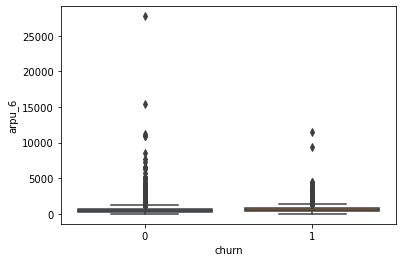

In [52]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.arpu_6, data = telecom_data_highvalue_customers)
plt.show()

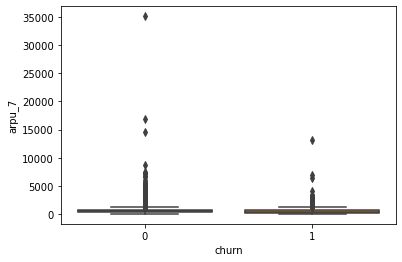

In [53]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.arpu_7, data = telecom_data_highvalue_customers)
plt.show()

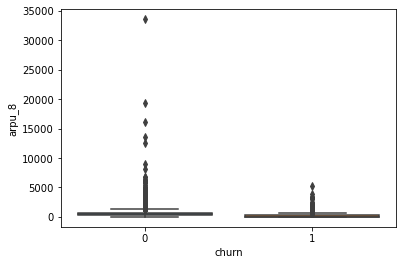

In [54]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.arpu_8, data = telecom_data_highvalue_customers)
plt.show()

# Column onnet_mou_6, onnet_mou_7, onnet_mou_8

In [55]:
telecom_data_highvalue_customers.onnet_mou_6.describe()

count    29344.000000
mean       291.004031
std        462.924957
min          0.000000
25%         34.530000
50%        118.710000
75%        348.015000
max       7376.710000
Name: onnet_mou_6, dtype: float64

In [56]:
telecom_data_highvalue_customers.onnet_mou_7.describe()

count    29344.000000
mean       300.670479
std        484.425217
min          0.000000
25%         34.510000
50%        120.180000
75%        355.840000
max       8157.780000
Name: onnet_mou_7, dtype: float64

In [57]:
telecom_data_highvalue_customers.onnet_mou_8.describe()

count    29344.000000
mean       264.546377
std        470.094656
min          0.000000
25%         21.480000
50%         91.740000
75%        295.140000
max      10752.560000
Name: onnet_mou_8, dtype: float64

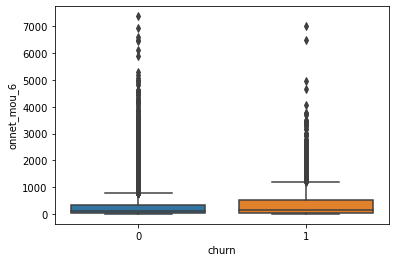

In [58]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.onnet_mou_6, data = telecom_data_highvalue_customers)
plt.show()

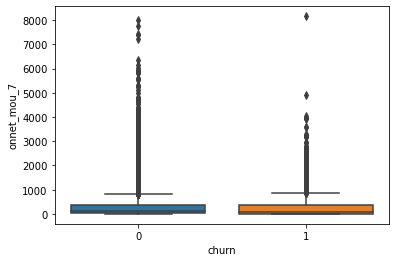

In [59]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.onnet_mou_7, data = telecom_data_highvalue_customers)
plt.show()

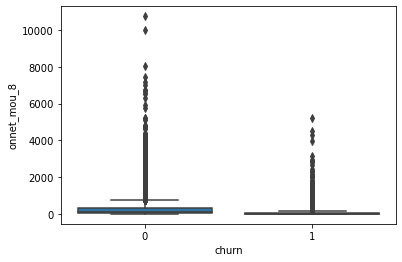

In [60]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.onnet_mou_8, data = telecom_data_highvalue_customers)
plt.show()

# Column offnet_mou_6, offnet_mou_7, offnet_mou_8

In [61]:
telecom_data_highvalue_customers.offnet_mou_6.describe()

count    29344.000000
mean       399.836552
std        473.719876
min          0.000000
25%        112.380000
50%        257.385000
75%        507.890000
max       8362.360000
Name: offnet_mou_6, dtype: float64

In [62]:
telecom_data_highvalue_customers.offnet_mou_7.describe()

count    29344.000000
mean       408.826068
std        490.616670
min          0.000000
25%        113.290000
50%        258.465000
75%        521.250000
max       9667.130000
Name: offnet_mou_7, dtype: float64

In [63]:
telecom_data_highvalue_customers.offnet_mou_8.describe()

count    29344.000000
mean       360.981424
std        481.727476
min          0.000000
25%         74.625000
50%        216.210000
75%        471.132500
max      14007.340000
Name: offnet_mou_8, dtype: float64

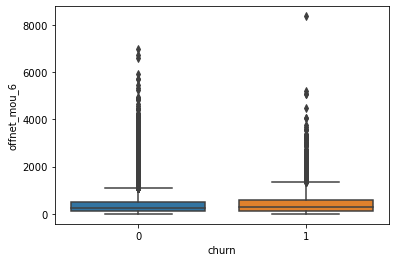

In [64]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.offnet_mou_6, data = telecom_data_highvalue_customers)
plt.show()

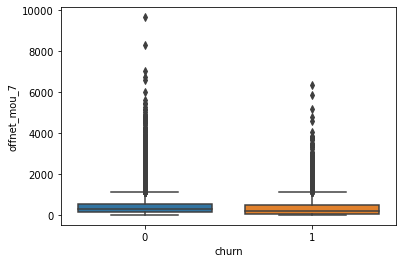

In [65]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.offnet_mou_7, data = telecom_data_highvalue_customers)
plt.show()

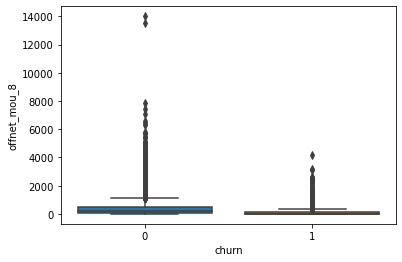

In [66]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.offnet_mou_8, data = telecom_data_highvalue_customers)
plt.show()

# Column roam_ic_mou_6, roam_ic_mou_7, roam_ic_mou_8

In [67]:
telecom_data_highvalue_customers.roam_ic_mou_6.describe()

count    29344.000000
mean        16.361877
std         78.199014
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max       2613.310000
Name: roam_ic_mou_6, dtype: float64

In [68]:
telecom_data_highvalue_customers.roam_ic_mou_7.describe()

count    29344.000000
mean        12.524443
std         78.195360
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max       4155.830000
Name: roam_ic_mou_7, dtype: float64

In [69]:
telecom_data_highvalue_customers.roam_ic_mou_8.describe()

count    29344.000000
mean        12.330669
std         73.540800
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max       4169.810000
Name: roam_ic_mou_8, dtype: float64

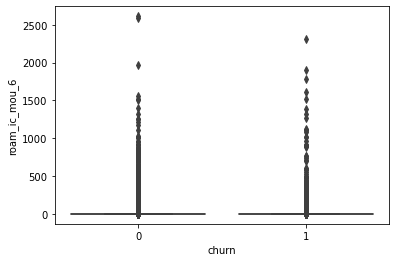

In [70]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.roam_ic_mou_6, data = telecom_data_highvalue_customers)
plt.show()

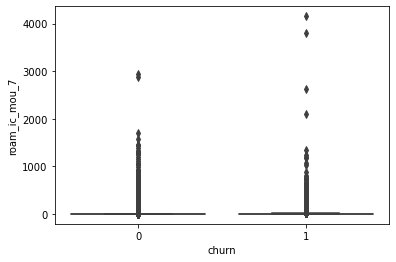

In [71]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.roam_ic_mou_7, data = telecom_data_highvalue_customers)
plt.show()

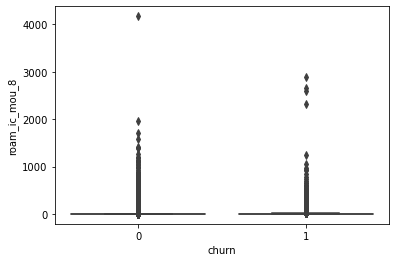

In [72]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.roam_ic_mou_8, data = telecom_data_highvalue_customers)
plt.show()

# Column loc_og_t2t_mou_6, loc_og_t2t_mou_7, loc_og_t2t_mou_8

In [73]:
telecom_data_highvalue_customers.loc_og_t2t_mou_6.describe()

count    29344.00000
mean        85.68000
std        232.37266
min          0.00000
25%          5.79000
50%         25.68000
75%         78.56750
max       6431.33000
Name: loc_og_t2t_mou_6, dtype: float64

In [74]:
telecom_data_highvalue_customers.loc_og_t2t_mou_7.describe()

count    29344.000000
mean        86.589448
std        244.420691
min          0.000000
25%          6.510000
50%         26.140000
75%         78.787500
max       7400.660000
Name: loc_og_t2t_mou_7, dtype: float64

In [75]:
telecom_data_highvalue_customers.loc_og_t2t_mou_8.describe()

count    29344.000000
mean        78.078911
std        229.401086
min          0.000000
25%          3.730000
50%         21.560000
75%         71.145000
max      10752.560000
Name: loc_og_t2t_mou_8, dtype: float64

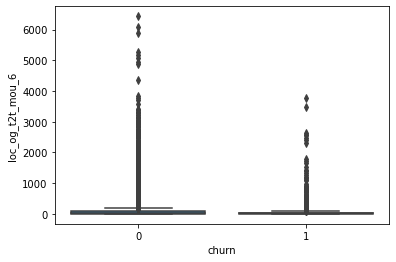

In [76]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.loc_og_t2t_mou_6, data = telecom_data_highvalue_customers)
plt.show()

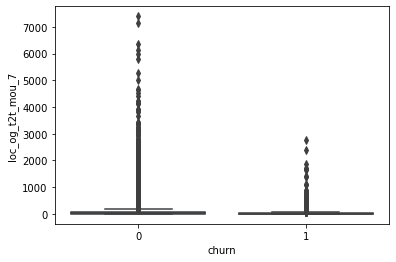

In [77]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.loc_og_t2t_mou_7, data = telecom_data_highvalue_customers)
plt.show()

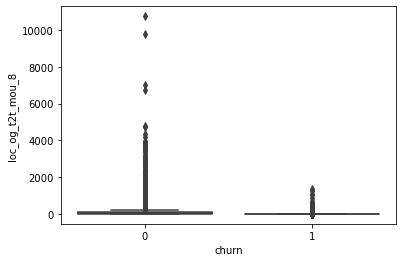

In [78]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.loc_og_t2t_mou_8, data = telecom_data_highvalue_customers)
plt.show()

# Column loc_og_t2m_mou_6, loc_og_t2m_mou_7, loc_og_t2m_mou_8

In [79]:
telecom_data_highvalue_customers.loc_og_t2m_mou_6.describe()

count    29344.000000
mean       163.776876
std        246.613272
min          0.000000
25%         22.107500
50%         80.035000
75%        209.845000
max       4729.740000
Name: loc_og_t2m_mou_6, dtype: float64

In [80]:
telecom_data_highvalue_customers.loc_og_t2m_mou_7.describe()

count    29344.000000
mean       164.110554
std        237.392414
min          0.000000
25%         25.230000
50%         83.210000
75%        209.510000
max       4557.140000
Name: loc_og_t2m_mou_7, dtype: float64

In [81]:
telecom_data_highvalue_customers.loc_og_t2m_mou_8.describe()

count    29344.000000
mean       150.587002
std        228.885505
min          0.000000
25%         16.060000
50%         69.120000
75%        193.667500
max       4961.330000
Name: loc_og_t2m_mou_8, dtype: float64

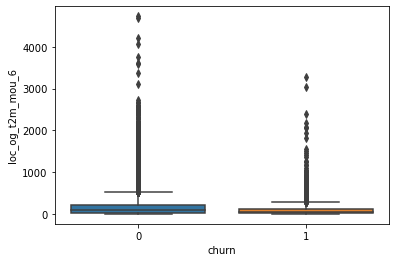

In [82]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.loc_og_t2m_mou_6, data = telecom_data_highvalue_customers)
plt.show()

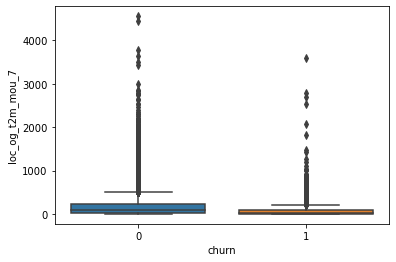

In [83]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.loc_og_t2m_mou_7, data = telecom_data_highvalue_customers)
plt.show()

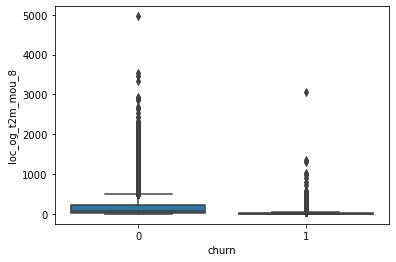

In [84]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.loc_og_t2m_mou_8, data = telecom_data_highvalue_customers)
plt.show()

# Columns loc_og_t2f_mou_6, loc_og_t2f_mou_7, loc_og_t2f_mou_8

In [85]:
telecom_data_highvalue_customers.loc_og_t2f_mou_6.describe()

count    29344.000000
mean         5.390609
std         20.822230
min          0.000000
25%          0.000000
50%          0.000000
75%          3.050000
max       1466.030000
Name: loc_og_t2f_mou_6, dtype: float64

In [86]:
telecom_data_highvalue_customers.loc_og_t2f_mou_7.describe()

count    29344.000000
mean         5.470357
std         20.634062
min          0.000000
25%          0.000000
50%          0.000000
75%          3.190000
max       1196.430000
Name: loc_og_t2f_mou_7, dtype: float64

In [87]:
telecom_data_highvalue_customers.loc_og_t2f_mou_8.describe()

count    29344.000000
mean         4.928484
std         17.843872
min          0.000000
25%          0.000000
50%          0.000000
75%          2.740000
max        928.490000
Name: loc_og_t2f_mou_8, dtype: float64

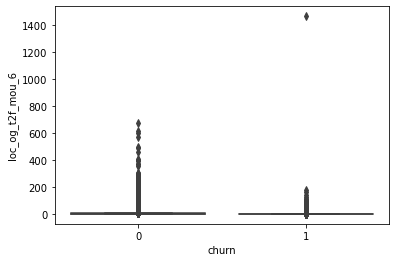

In [88]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.loc_og_t2f_mou_6, data = telecom_data_highvalue_customers)
plt.show()

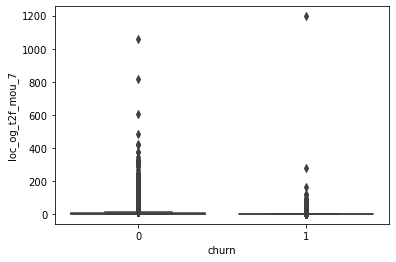

In [89]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.loc_og_t2f_mou_7, data = telecom_data_highvalue_customers)
plt.show()

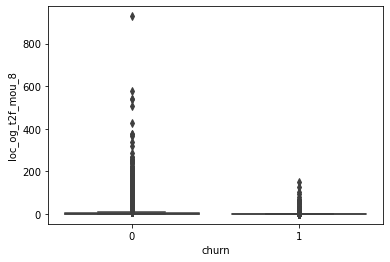

In [90]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.loc_og_t2f_mou_8, data = telecom_data_highvalue_customers)
plt.show()

# Columns loc_og_t2c_mou_6, loc_og_t2c_mou_7, loc_og_t2c_mou_8

In [91]:
telecom_data_highvalue_customers.loc_og_t2c_mou_6.describe()

count    29344.000000
mean         1.706520
std          7.217002
min          0.000000
25%          0.000000
50%          0.000000
75%          0.160000
max        342.860000
Name: loc_og_t2c_mou_6, dtype: float64

In [92]:
telecom_data_highvalue_customers.loc_og_t2c_mou_7.describe()

count    29344.000000
mean         2.103134
std          9.897879
min          0.000000
25%          0.000000
50%          0.000000
75%          0.365000
max        569.710000
Name: loc_og_t2c_mou_7, dtype: float64

In [93]:
telecom_data_highvalue_customers.loc_og_t2c_mou_8.describe()

count    29344.000000
mean         1.878820
std          7.865578
min          0.000000
25%          0.000000
50%          0.000000
75%          0.210000
max        351.830000
Name: loc_og_t2c_mou_8, dtype: float64

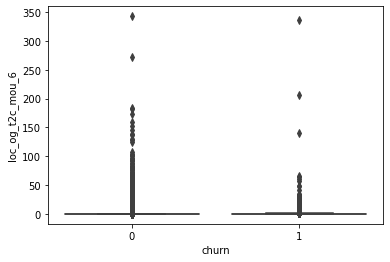

In [94]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.loc_og_t2c_mou_6, data = telecom_data_highvalue_customers)
plt.show()

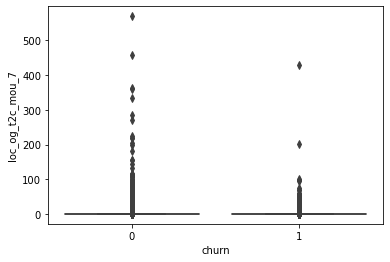

In [95]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.loc_og_t2c_mou_7, data = telecom_data_highvalue_customers)
plt.show()

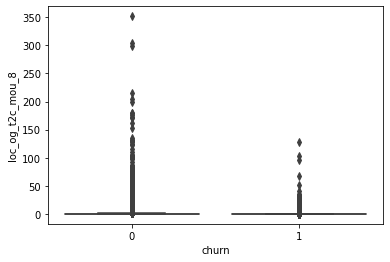

In [96]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.loc_og_t2c_mou_8, data = telecom_data_highvalue_customers)
plt.show()

# Columns loc_og_mou_6, loc_og_mou_7, loc_og_mou_8

In [97]:
telecom_data_highvalue_customers.loc_og_mou_6.describe()

count    29344.000000
mean       254.855728
std        375.856466
min          0.000000
25%         36.780000
50%        129.320000
75%        328.665000
max      10643.380000
Name: loc_og_mou_6, dtype: float64

In [98]:
telecom_data_highvalue_customers.loc_og_mou_7.describe()

count    29344.000000
mean       256.178823
std        372.469238
min          0.000000
25%         41.237500
50%        133.310000
75%        328.495000
max       7674.780000
Name: loc_og_mou_7, dtype: float64

In [99]:
telecom_data_highvalue_customers.loc_og_mou_8.describe()

count    29344.000000
mean       233.602229
std        359.495491
min          0.000000
25%         26.980000
50%        111.470000
75%        303.077500
max      11039.910000
Name: loc_og_mou_8, dtype: float64

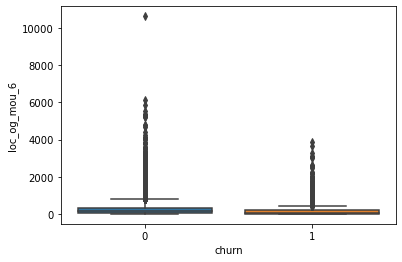

In [100]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.loc_og_mou_6, data = telecom_data_highvalue_customers)
plt.show()

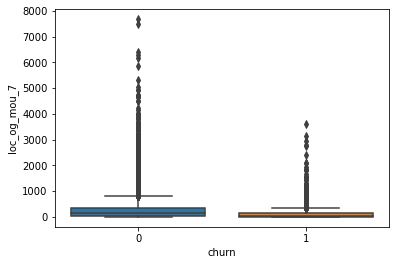

In [101]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.loc_og_mou_7, data = telecom_data_highvalue_customers)
plt.show()

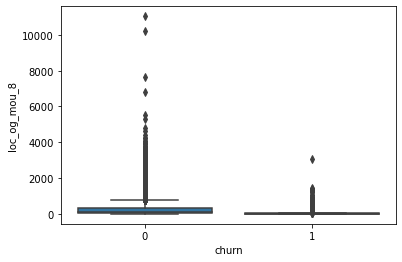

In [102]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.loc_og_mou_8, data = telecom_data_highvalue_customers)
plt.show()

# Columns std_og_t2t_mou_6, std_og_t2t_mou_7, std_og_t2t_mou_8

In [103]:
telecom_data_highvalue_customers.std_og_t2t_mou_6.describe()

count    29344.000000
mean       194.102144
std        411.712105
min          0.000000
25%          0.000000
50%         15.960000
75%        189.330000
max       7366.580000
Name: std_og_t2t_mou_6, dtype: float64

In [104]:
telecom_data_highvalue_customers.std_og_t2t_mou_7.describe()

count    29344.000000
mean       205.708318
std        430.386444
min          0.000000
25%          0.000000
50%         17.560000
75%        207.917500
max       8133.660000
Name: std_og_t2t_mou_7, dtype: float64

In [105]:
telecom_data_highvalue_customers.std_og_t2t_mou_8.describe()

count    29344.000000
mean       178.513846
std        414.751342
min          0.000000
25%          0.000000
50%          7.425000
75%        149.042500
max       8014.430000
Name: std_og_t2t_mou_8, dtype: float64

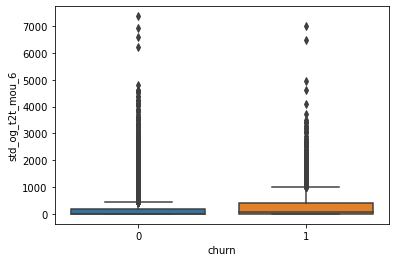

In [106]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.std_og_t2t_mou_6, data = telecom_data_highvalue_customers)
plt.show()

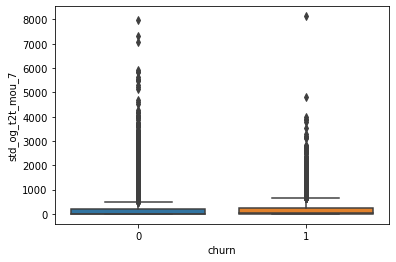

In [107]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.std_og_t2t_mou_7, data = telecom_data_highvalue_customers)
plt.show()

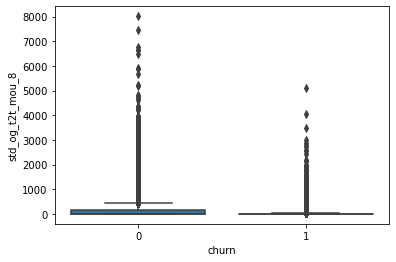

In [108]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.std_og_t2t_mou_8, data = telecom_data_highvalue_customers)
plt.show()

# Columns std_og_t2m_mou_6, std_og_t2t_mou_7, std_og_t2t_mou_8

In [109]:
telecom_data_highvalue_customers.std_og_t2m_mou_6.describe()

count    29344.000000
mean       205.150551
std        412.743758
min          0.000000
25%          1.475000
50%         40.385000
75%        218.732500
max       8314.760000
Name: std_og_t2m_mou_6, dtype: float64

In [110]:
telecom_data_highvalue_customers.std_og_t2m_mou_7.describe()

count    29344.000000
mean       217.843204
std        438.906962
min          0.000000
25%          1.330000
50%         41.960000
75%        236.295000
max       9284.740000
Name: std_og_t2m_mou_7, dtype: float64

In [111]:
telecom_data_highvalue_customers.std_og_t2m_mou_8.describe()

count    29344.000000
mean       184.999693
std        421.444537
min          0.000000
25%          0.000000
50%         25.160000
75%        177.452500
max      13950.040000
Name: std_og_t2m_mou_8, dtype: float64

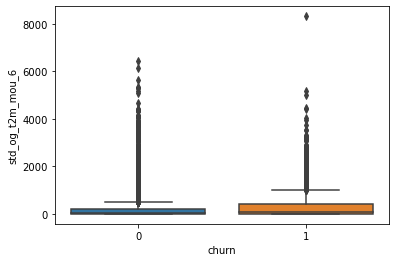

In [112]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.std_og_t2m_mou_6, data = telecom_data_highvalue_customers)
plt.show()

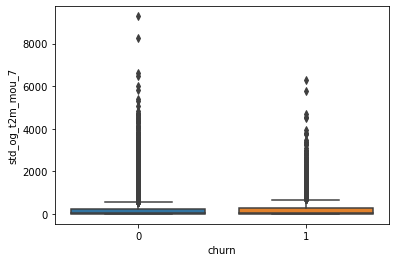

In [113]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.std_og_t2m_mou_7, data = telecom_data_highvalue_customers)
plt.show()

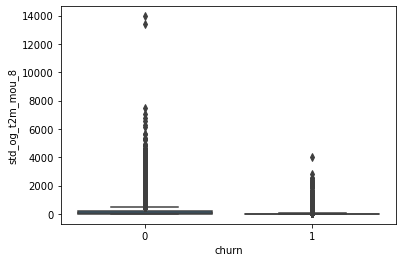

In [114]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.std_og_t2m_mou_8, data = telecom_data_highvalue_customers)
plt.show()

# Columns std_og_t2f_mou_6, std_og_t2t_mou_7, std_og_t2t_mou_8

In [115]:
telecom_data_highvalue_customers.std_og_t2f_mou_6.describe()

count    29344.000000
mean         1.481553
std         11.008089
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max        628.560000
Name: std_og_t2f_mou_6, dtype: float64

In [116]:
telecom_data_highvalue_customers.std_og_t2f_mou_7.describe()

count    29344.000000
mean         1.518279
std         11.968885
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max        544.630000
Name: std_og_t2f_mou_7, dtype: float64

In [117]:
telecom_data_highvalue_customers.std_og_t2f_mou_8.describe()

count    29344.000000
mean         1.290883
std         10.206601
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max        516.910000
Name: std_og_t2f_mou_8, dtype: float64

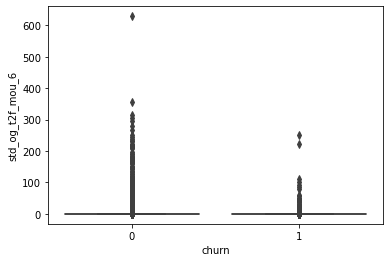

In [118]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.std_og_t2f_mou_6, data = telecom_data_highvalue_customers)
plt.show()

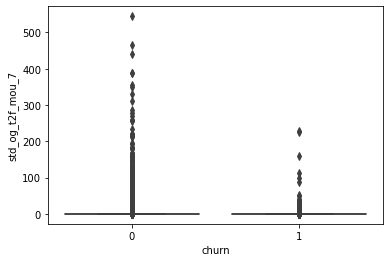

In [119]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.std_og_t2f_mou_7, data = telecom_data_highvalue_customers)
plt.show()

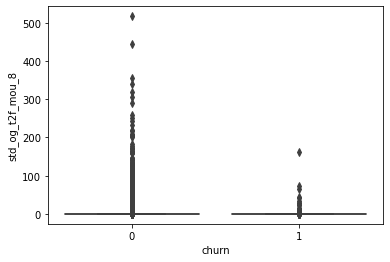

In [120]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.std_og_t2f_mou_8, data = telecom_data_highvalue_customers)
plt.show()

# Columns std_og_t2c_mou_6, std_og_t2t_mou_7, std_og_t2t_mou_8

In [121]:
telecom_data_highvalue_customers.std_og_t2c_mou_6.nunique()

1

In [122]:
telecom_data_highvalue_customers.std_og_t2c_mou_7.nunique()

1

In [123]:
telecom_data_highvalue_customers.std_og_t2c_mou_8.nunique()

1

In [124]:
# Dropping the column as number of unique data is 1, i.e. same value is repeated in all the rows
telecom_data_highvalue_customers.drop(['std_og_t2c_mou_6'],axis=1,inplace=True)
telecom_data_highvalue_customers.drop(['std_og_t2c_mou_7'],axis=1,inplace=True)
telecom_data_highvalue_customers.drop(['std_og_t2c_mou_8'],axis=1,inplace=True)

# Columns std_og_mou_6, std_og_t2t_mou_7, std_og_t2t_mou_8

In [125]:
telecom_data_highvalue_customers.std_og_mou_6.describe()

count    29344.000000
mean       400.738502
std        605.582667
min          0.000000
25%          5.790000
50%        145.130000
75%        574.950000
max       8432.990000
Name: std_og_mou_6, dtype: float64

In [126]:
telecom_data_highvalue_customers.std_og_mou_7.describe()

count    29344.000000
mean       425.074095
std        636.959970
min          0.000000
25%          5.780000
50%        161.945000
75%        617.140000
max      10936.730000
Name: std_og_mou_7, dtype: float64

In [127]:
telecom_data_highvalue_customers.std_og_mou_8.describe()

count    29344.000000
mean       364.808250
std        620.019751
min          0.000000
25%          1.280000
50%         85.135000
75%        502.832500
max      13980.060000
Name: std_og_mou_8, dtype: float64

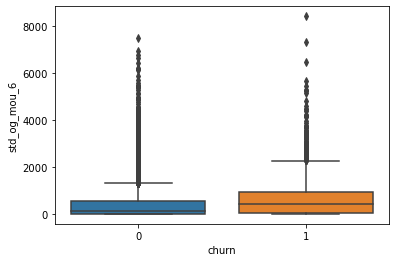

In [128]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.std_og_mou_6, data = telecom_data_highvalue_customers)
plt.show()

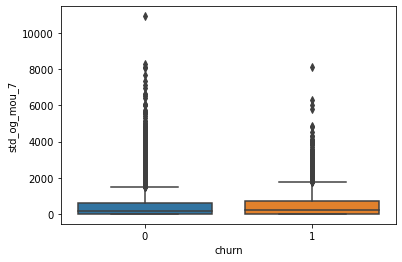

In [129]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.std_og_mou_7, data = telecom_data_highvalue_customers)
plt.show()

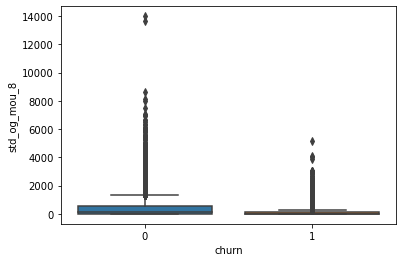

In [130]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.std_og_mou_8, data = telecom_data_highvalue_customers)
plt.show()

# Columns isd_og_mou_6, std_og_t2t_mou_7, std_og_t2t_mou_8

In [131]:
telecom_data_highvalue_customers.isd_og_mou_6.describe()

count    29344.000000
mean         2.113354
std         46.086528
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max       5900.660000
Name: isd_og_mou_6, dtype: float64

In [132]:
telecom_data_highvalue_customers.isd_og_mou_7.describe()

count    29344.000000
mean         2.108448
std         45.936290
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max       5490.280000
Name: isd_og_mou_7, dtype: float64

In [133]:
telecom_data_highvalue_customers.isd_og_mou_8.describe()

count    29344.000000
mean         1.956094
std         45.138222
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max       5681.540000
Name: isd_og_mou_8, dtype: float64

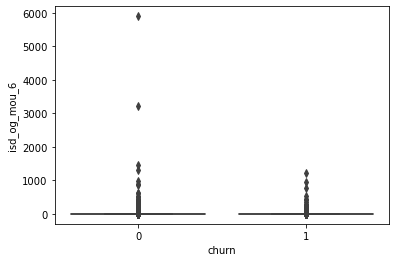

In [134]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.isd_og_mou_6, data = telecom_data_highvalue_customers)
plt.show()

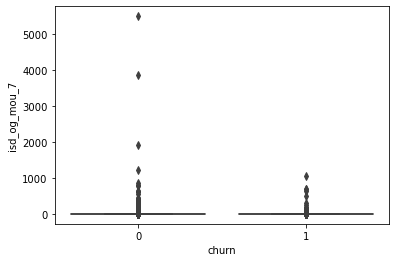

In [135]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.isd_og_mou_7, data = telecom_data_highvalue_customers)
plt.show()

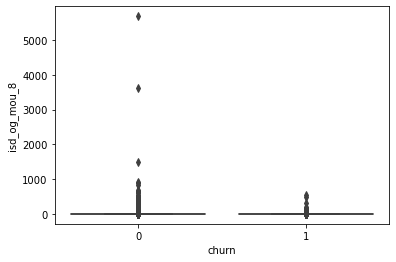

In [136]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.isd_og_mou_8, data = telecom_data_highvalue_customers)
plt.show()

# Columns spl_og_mou_6, std_og_t2t_mou_7, std_og_t2t_mou_8

In [137]:
telecom_data_highvalue_customers.spl_og_mou_6.describe()

count    29344.000000
mean         6.542138
std         21.262744
min          0.000000
25%          0.000000
50%          0.630000
75%          6.010000
max       1023.210000
Name: spl_og_mou_6, dtype: float64

In [138]:
telecom_data_highvalue_customers.spl_og_mou_7.describe()

count    29344.000000
mean         8.517506
std         26.107715
min          0.000000
25%          0.000000
50%          1.350000
75%          8.380000
max       1265.790000
Name: spl_og_mou_7, dtype: float64

In [139]:
telecom_data_highvalue_customers.spl_og_mou_8.describe()

count    29344.000000
mean         7.706614
std         24.635267
min          0.000000
25%          0.000000
50%          0.960000
75%          7.460000
max       1390.880000
Name: spl_og_mou_8, dtype: float64

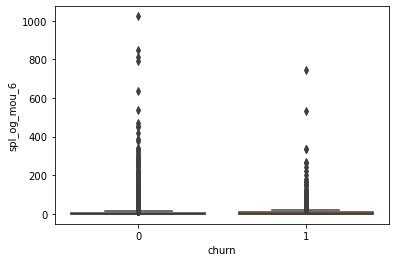

In [140]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.spl_og_mou_6, data = telecom_data_highvalue_customers)
plt.show()

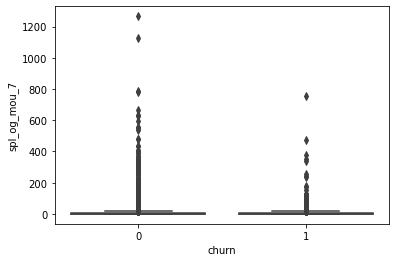

In [141]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.spl_og_mou_7, data = telecom_data_highvalue_customers)
plt.show()

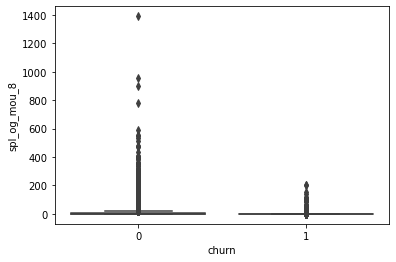

In [142]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.spl_og_mou_8, data = telecom_data_highvalue_customers)
plt.show()

# Columns og_others_6, std_og_t2t_mou_7, std_og_t2t_mou_8

In [143]:
telecom_data_highvalue_customers.og_others_6.describe()

count    29344.000000
mean         0.855709
std          4.289324
min          0.000000
25%          0.000000
50%          0.000000
75%          0.430000
max        609.810000
Name: og_others_6, dtype: float64

In [144]:
telecom_data_highvalue_customers.og_others_7.describe()

count    29344.000000
mean         0.044182
std          2.710323
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max        370.130000
Name: og_others_7, dtype: float64

In [145]:
telecom_data_highvalue_customers.og_others_8.describe()

count    29344.000000
mean         0.056774
std          3.322665
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max        394.930000
Name: og_others_8, dtype: float64

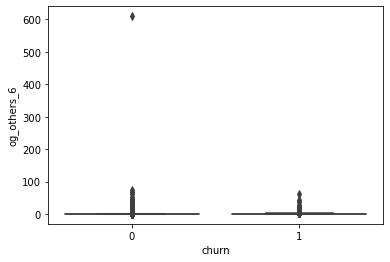

In [146]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.og_others_6, data = telecom_data_highvalue_customers)
plt.show()

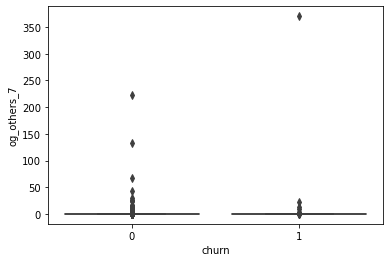

In [147]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.og_others_7, data = telecom_data_highvalue_customers)
plt.show()

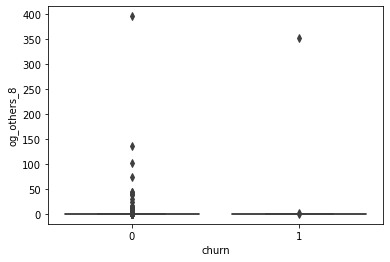

In [148]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.og_others_8, data = telecom_data_highvalue_customers)
plt.show()

# Columns total_og_mou_6, total_og_mou_7, total_og_mou_8

In [149]:
telecom_data_highvalue_customers.total_og_mou_6.describe()

count    29344.000000
mean       665.115648
std        667.426333
min          0.000000
25%        228.802500
50%        481.685000
75%        887.690000
max      10674.030000
Name: total_og_mou_6, dtype: float64

In [150]:
telecom_data_highvalue_customers.total_og_mou_7.describe()

count    29344.000000
mean       691.932065
std        691.730988
min          0.000000
25%        239.537500
50%        504.905000
75%        924.572500
max      11365.310000
Name: total_og_mou_7, dtype: float64

In [151]:
telecom_data_highvalue_customers.total_og_mou_8.describe()

count    29344.000000
mean       608.138443
std        691.703598
min          0.000000
25%        152.192500
50%        412.770000
75%        829.890000
max      14043.060000
Name: total_og_mou_8, dtype: float64

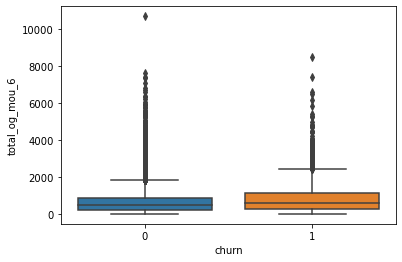

In [152]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.total_og_mou_6, data = telecom_data_highvalue_customers)
plt.show()

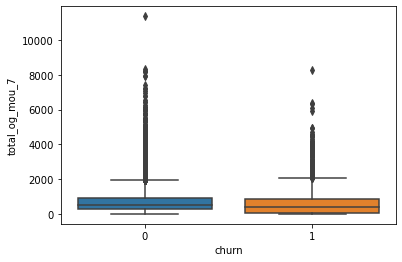

In [153]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.total_og_mou_7, data = telecom_data_highvalue_customers)
plt.show()

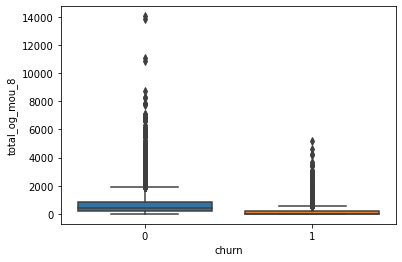

In [154]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.total_og_mou_8, data = telecom_data_highvalue_customers)
plt.show()

# Columns loc_ic_t2t_mou_6, loc_ic_t2t_mou_7, loc_ic_t2t_mou_8

In [155]:
telecom_data_highvalue_customers.loc_ic_t2t_mou_6.describe()

count    29344.000000
mean        64.965071
std        159.939420
min          0.000000
25%          6.740000
50%         25.590000
75%         67.530000
max       6626.930000
Name: loc_ic_t2t_mou_6, dtype: float64

In [156]:
telecom_data_highvalue_customers.loc_ic_t2t_mou_7.describe()

count    29344.000000
mean        66.186315
std        165.829284
min          0.000000
25%          7.910000
50%         26.540000
75%         68.090000
max       5709.590000
Name: loc_ic_t2t_mou_7, dtype: float64

In [157]:
telecom_data_highvalue_customers.loc_ic_t2t_mou_8.describe()

count    29344.000000
mean        61.691227
std        152.629696
min          0.000000
25%          5.360000
50%         22.940000
75%         64.115000
max       4003.210000
Name: loc_ic_t2t_mou_8, dtype: float64

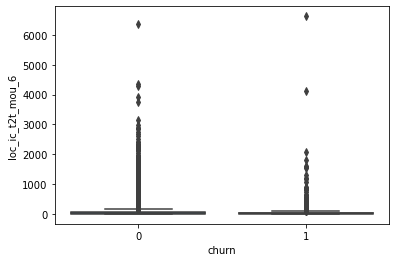

In [158]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.loc_ic_t2t_mou_6, data = telecom_data_highvalue_customers)
plt.show()

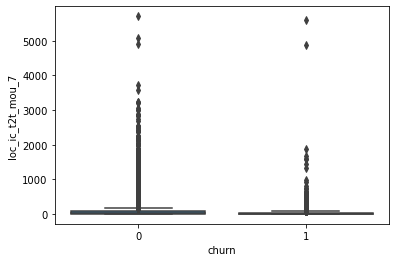

In [159]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.loc_ic_t2t_mou_7, data = telecom_data_highvalue_customers)
plt.show()

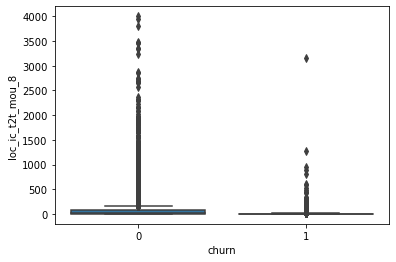

In [160]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.loc_ic_t2t_mou_8, data = telecom_data_highvalue_customers)
plt.show()

# Columns std_ic_t2o_mou_6, std_ic_t2o_mou_7, std_ic_t2o_mou_8

In [161]:
telecom_data_highvalue_customers.std_ic_t2o_mou_6.describe()

count    29344.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: std_ic_t2o_mou_6, dtype: float64

In [162]:
telecom_data_highvalue_customers.std_ic_t2o_mou_7.describe()

count    29344.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: std_ic_t2o_mou_7, dtype: float64

In [163]:
telecom_data_highvalue_customers.std_ic_t2o_mou_8.describe()

count    29344.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: std_ic_t2o_mou_8, dtype: float64

In [164]:
# Dropping the column as number of unique data is 1, i.e. same value is repeated in all the rows
telecom_data_highvalue_customers.drop(['std_ic_t2o_mou_6'],axis=1,inplace=True)
telecom_data_highvalue_customers.drop(['std_ic_t2o_mou_7'],axis=1,inplace=True)
telecom_data_highvalue_customers.drop(['std_ic_t2o_mou_8'],axis=1,inplace=True)

# Columns loc_ic_t2m_mou_6, loc_ic_t2m_mou_7, loc_ic_t2m_mou_8

In [165]:
telecom_data_highvalue_customers.loc_ic_t2m_mou_6.describe()

count    29344.000000
mean       151.238586
std        221.289779
min          0.000000
25%         28.455000
50%         83.820000
75%        189.180000
max       4693.860000
Name: loc_ic_t2m_mou_6, dtype: float64

In [166]:
telecom_data_highvalue_customers.loc_ic_t2m_mou_7.describe()

count    29344.000000
mean       153.359553
std        222.346371
min          0.000000
25%         33.075000
50%         87.010000
75%        190.290000
max       4388.730000
Name: loc_ic_t2m_mou_7, dtype: float64

In [167]:
telecom_data_highvalue_customers.loc_ic_t2m_mou_8.describe()

count    29344.000000
mean       144.720127
std        215.629156
min          0.000000
25%         24.910000
50%         79.450000
75%        181.580000
max       5738.460000
Name: loc_ic_t2m_mou_8, dtype: float64

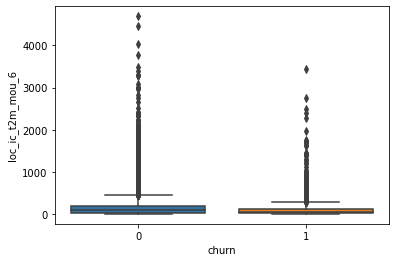

In [168]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.loc_ic_t2m_mou_6, data = telecom_data_highvalue_customers)
plt.show()

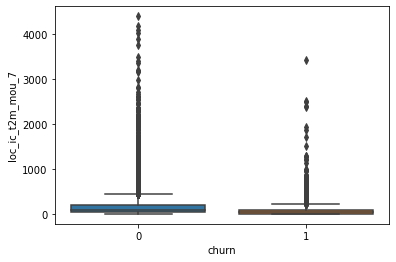

In [169]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.loc_ic_t2m_mou_7, data = telecom_data_highvalue_customers)
plt.show()

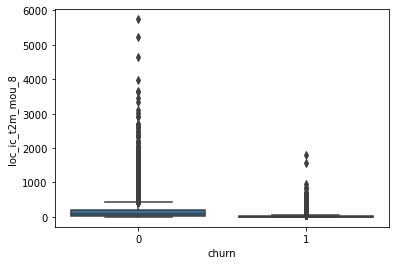

In [170]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.loc_ic_t2m_mou_8, data = telecom_data_highvalue_customers)
plt.show()

# Columns loc_ic_t2f_mou_6, loc_ic_t2f_mou_7, loc_ic_t2f_mou_8

In [171]:
telecom_data_highvalue_customers.loc_ic_t2f_mou_6.describe()

count    29344.000000
mean        13.296405
std         42.373083
min          0.000000
25%          0.000000
50%          1.210000
75%          9.482500
max       1872.340000
Name: loc_ic_t2f_mou_6, dtype: float64

In [172]:
telecom_data_highvalue_customers.loc_ic_t2f_mou_7.describe()

count    29344.000000
mean        13.948102
std         44.501733
min          0.000000
25%          0.000000
50%          1.430000
75%          9.980000
max       1681.210000
Name: loc_ic_t2f_mou_7, dtype: float64

In [173]:
telecom_data_highvalue_customers.loc_ic_t2f_mou_8.describe()

count    29344.000000
mean        12.545441
std         40.264150
min          0.000000
25%          0.000000
50%          1.150000
75%          9.042500
max       1676.580000
Name: loc_ic_t2f_mou_8, dtype: float64

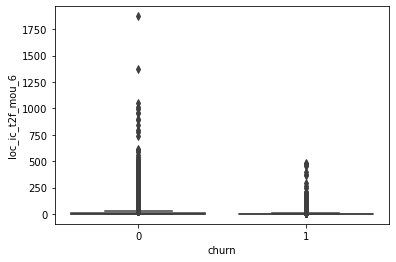

In [174]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.loc_ic_t2f_mou_6, data = telecom_data_highvalue_customers)
plt.show()

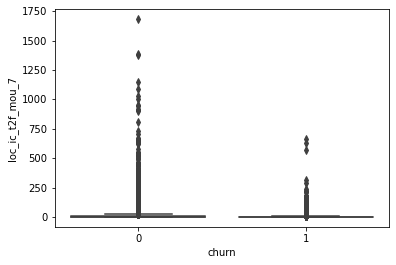

In [175]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.loc_ic_t2f_mou_7, data = telecom_data_highvalue_customers)
plt.show()

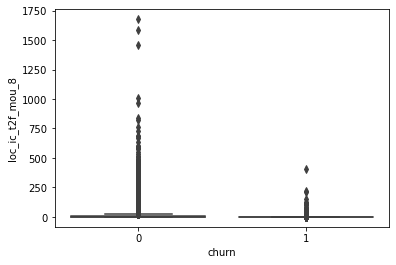

In [176]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.loc_ic_t2f_mou_8, data = telecom_data_highvalue_customers)
plt.show()

# Columns loc_ic_mou_6, loc_ic_mou_7, loc_ic_mou_8

In [177]:
telecom_data_highvalue_customers.loc_ic_mou_6.describe()

count    29344.000000
mean       229.509507
std        313.708827
min          0.000000
25%         47.490000
50%        132.790000
75%        293.930000
max       7454.630000
Name: loc_ic_mou_6, dtype: float64

In [178]:
telecom_data_highvalue_customers.loc_ic_mou_7.describe()

count    29344.000000
mean       233.503646
std        316.399141
min          0.000000
25%         55.430000
50%        136.950000
75%        293.522500
max       6466.740000
Name: loc_ic_mou_7, dtype: float64

In [179]:
telecom_data_highvalue_customers.loc_ic_mou_8.describe()

count    29344.000000
mean       218.966008
std        303.836737
min          0.000000
25%         41.237500
50%        125.290000
75%        277.810000
max       5748.810000
Name: loc_ic_mou_8, dtype: float64

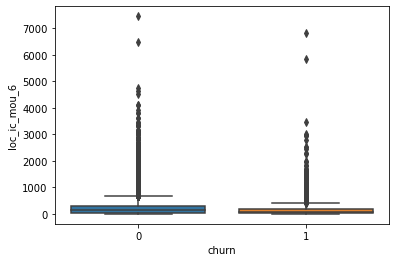

In [180]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.loc_ic_mou_6, data = telecom_data_highvalue_customers)
plt.show()

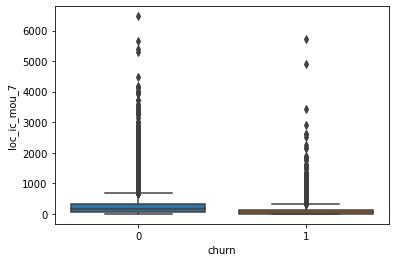

In [181]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.loc_ic_mou_7, data = telecom_data_highvalue_customers)
plt.show()

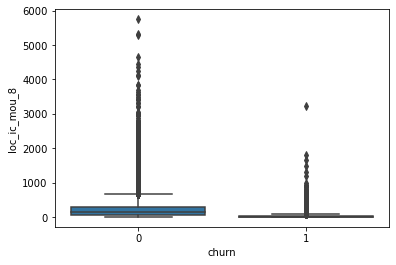

In [182]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.loc_ic_mou_8, data = telecom_data_highvalue_customers)
plt.show()

# Columns std_ic_t2t_mou_6, std_ic_t2t_mou_7, std_ic_t2t_mou_8

In [183]:
telecom_data_highvalue_customers.std_ic_t2t_mou_6.describe()

count    29344.000000
mean        16.117885
std         77.890462
min          0.000000
25%          0.000000
50%          1.040000
75%         10.365000
max       5459.560000
Name: std_ic_t2t_mou_6, dtype: float64

In [184]:
telecom_data_highvalue_customers.std_ic_t2t_mou_7.describe()

count    29344.000000
mean        16.772170
std         83.390544
min          0.000000
25%          0.000000
50%          1.240000
75%         11.110000
max       5800.930000
Name: std_ic_t2t_mou_7, dtype: float64

In [185]:
telecom_data_highvalue_customers.std_ic_t2t_mou_8.describe()

count    29344.000000
mean        14.803877
std         72.308972
min          0.000000
25%          0.000000
50%          0.530000
75%          8.740000
max       4309.290000
Name: std_ic_t2t_mou_8, dtype: float64

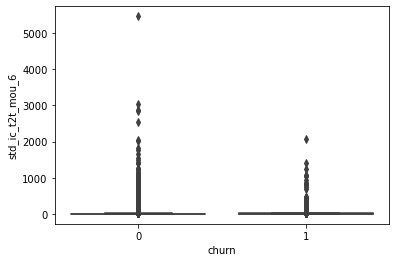

In [186]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.std_ic_t2t_mou_6, data = telecom_data_highvalue_customers)
plt.show()

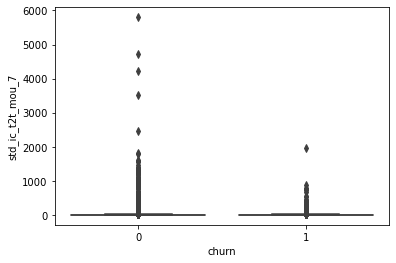

In [187]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.std_ic_t2t_mou_7, data = telecom_data_highvalue_customers)
plt.show()

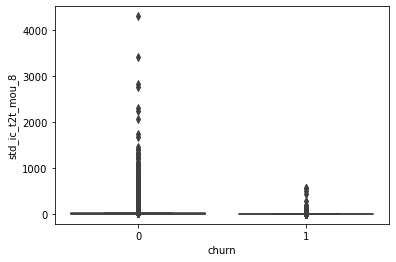

In [188]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.std_ic_t2t_mou_8, data = telecom_data_highvalue_customers)
plt.show()

# Columns std_ic_t2m_mou_6, std_ic_t2m_mou_7, std_ic_t2m_mou_8

In [189]:
telecom_data_highvalue_customers.std_ic_t2m_mou_6.describe()

count    29344.000000
mean        31.418796
std        103.418412
min          0.000000
25%          0.380000
50%          6.730000
75%         26.630000
max       4630.230000
Name: std_ic_t2m_mou_6, dtype: float64

In [190]:
telecom_data_highvalue_customers.std_ic_t2m_mou_7.describe()

count    29344.000000
mean        32.505002
std        102.802122
min          0.000000
25%          0.430000
50%          7.310000
75%         28.340000
max       3470.380000
Name: std_ic_t2m_mou_7, dtype: float64

In [191]:
telecom_data_highvalue_customers.std_ic_t2m_mou_8.describe()

count    29344.000000
mean        29.123703
std        102.545964
min          0.000000
25%          0.000000
50%          5.360000
75%         24.330000
max       5645.860000
Name: std_ic_t2m_mou_8, dtype: float64

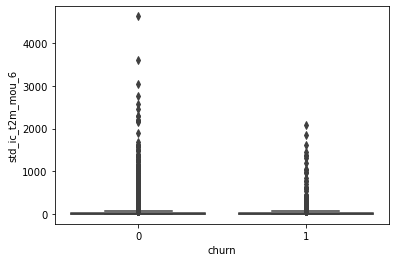

In [192]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.std_ic_t2m_mou_6, data = telecom_data_highvalue_customers)
plt.show()

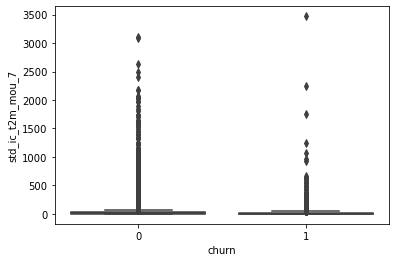

In [193]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.std_ic_t2m_mou_7, data = telecom_data_highvalue_customers)
plt.show()

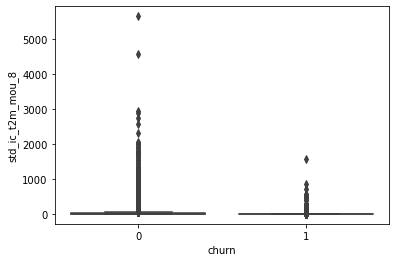

In [194]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.std_ic_t2m_mou_8, data = telecom_data_highvalue_customers)
plt.show()

# Columns std_ic_t2f_mou_6, std_ic_t2f_mou_7, std_ic_t2f_mou_8

In [195]:
telecom_data_highvalue_customers.std_ic_t2f_mou_6.describe()

count    29344.000000
mean         2.240442
std         17.473020
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max       1351.110000
Name: std_ic_t2f_mou_6, dtype: float64

In [196]:
telecom_data_highvalue_customers.std_ic_t2f_mou_7.describe()

count    29344.000000
mean         2.331959
std         17.477358
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max       1136.080000
Name: std_ic_t2f_mou_7, dtype: float64

In [197]:
telecom_data_highvalue_customers.std_ic_t2f_mou_8.describe()

count    29344.000000
mean         2.080513
std         16.926272
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max       1394.890000
Name: std_ic_t2f_mou_8, dtype: float64

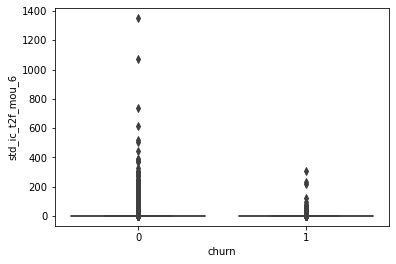

In [198]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.std_ic_t2f_mou_6, data = telecom_data_highvalue_customers)
plt.show()

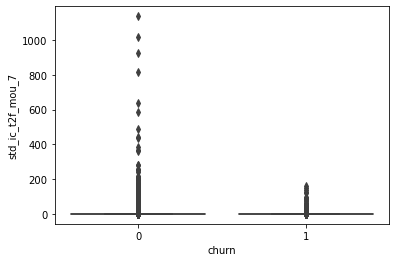

In [199]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.std_ic_t2f_mou_7, data = telecom_data_highvalue_customers)
plt.show()

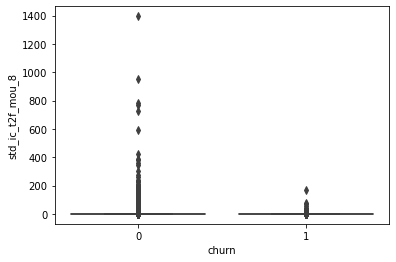

In [200]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.std_ic_t2f_mou_8, data = telecom_data_highvalue_customers)
plt.show()

# Columns std_ic_mou_6, std_ic_mou_7, std_ic_mou_8

In [201]:
telecom_data_highvalue_customers.std_ic_mou_6.describe()

count    29344.000000
mean        49.780946
std        141.052019
min          0.000000
25%          2.310000
50%         14.360000
75%         45.690000
max       5459.630000
Name: std_ic_mou_6, dtype: float64

In [202]:
telecom_data_highvalue_customers.std_ic_mou_7.describe()

count    29344.000000
mean        51.613040
std        145.539857
min          0.000000
25%          2.560000
50%         15.630000
75%         48.780000
max       6745.760000
Name: std_ic_mou_7, dtype: float64

In [203]:
telecom_data_highvalue_customers.std_ic_mou_8.describe()

count    29344.000000
mean        46.011682
std        137.710486
min          0.000000
25%          1.150000
50%         11.880000
75%         41.780000
max       5957.140000
Name: std_ic_mou_8, dtype: float64

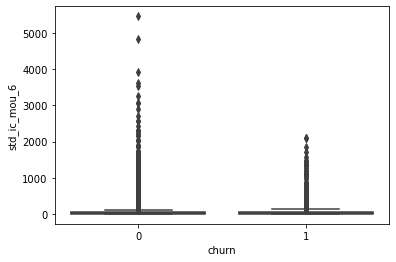

In [204]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.std_ic_mou_6, data = telecom_data_highvalue_customers)
plt.show()

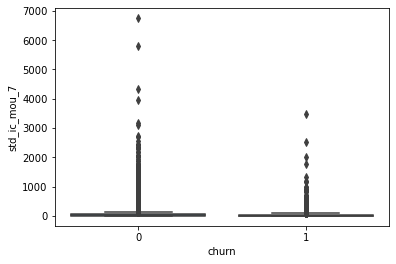

In [205]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.std_ic_mou_7, data = telecom_data_highvalue_customers)
plt.show()

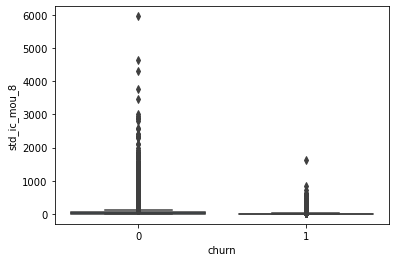

In [206]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.std_ic_mou_8, data = telecom_data_highvalue_customers)
plt.show()

# Columns total_ic_mou_6, total_ic_mou_7, total_ic_mou_8

In [207]:
telecom_data_highvalue_customers.total_ic_mou_6.describe()

count    29344.000000
mean       290.232133
std        363.494254
min          0.000000
25%         77.332500
50%        184.030000
75%        368.072500
max       7716.140000
Name: total_ic_mou_6, dtype: float64

In [208]:
telecom_data_highvalue_customers.total_ic_mou_7.describe()

count    29344.000000
mean       297.865930
std        370.381174
min          0.000000
25%         87.087500
50%        188.770000
75%        371.850000
max       7442.860000
Name: total_ic_mou_7, dtype: float64

In [209]:
telecom_data_highvalue_customers.total_ic_mou_8.describe()

count    29344.000000
mean       276.979927
std        357.173564
min          0.000000
25%         66.990000
50%        171.020000
75%        351.850000
max       6066.630000
Name: total_ic_mou_8, dtype: float64

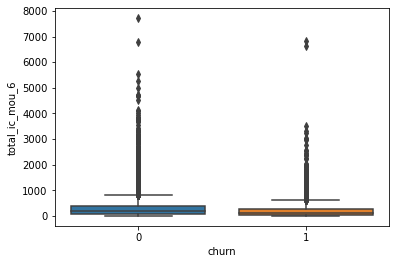

In [210]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.total_ic_mou_6, data = telecom_data_highvalue_customers)
plt.show()

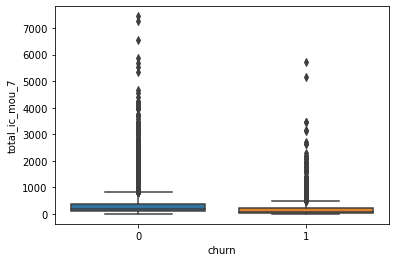

In [211]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.total_ic_mou_7, data = telecom_data_highvalue_customers)
plt.show()

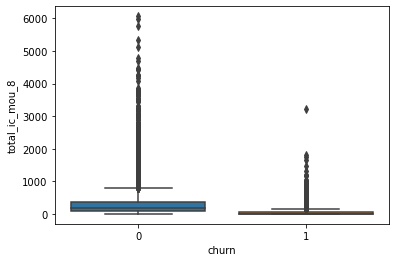

In [212]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.total_ic_mou_8, data = telecom_data_highvalue_customers)
plt.show()

# Columns spl_ic_mou_6, spl_ic_mou_7, spl_ic_mou_8

In [213]:
telecom_data_highvalue_customers.spl_ic_mou_6.describe()

count    29344.000000
mean         0.070118
std          0.197811
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max         19.760000
Name: spl_ic_mou_6, dtype: float64

In [214]:
telecom_data_highvalue_customers.spl_ic_mou_7.describe()

count    29344.000000
mean         0.022439
std          0.185537
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max         21.330000
Name: spl_ic_mou_7, dtype: float64

In [215]:
telecom_data_highvalue_customers.spl_ic_mou_8.describe()

count    29344.000000
mean         0.034793
std          0.129487
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          6.230000
Name: spl_ic_mou_8, dtype: float64

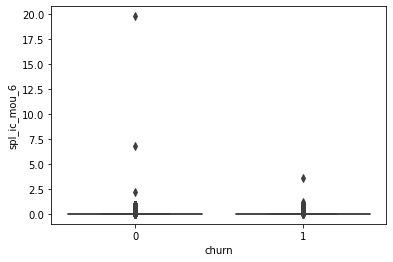

In [216]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.spl_ic_mou_6, data = telecom_data_highvalue_customers)
plt.show()

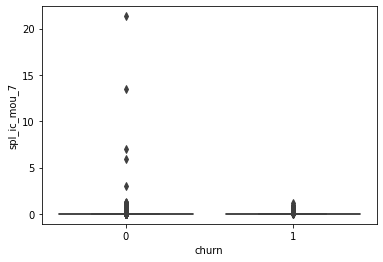

In [217]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.spl_ic_mou_7, data = telecom_data_highvalue_customers)
plt.show()

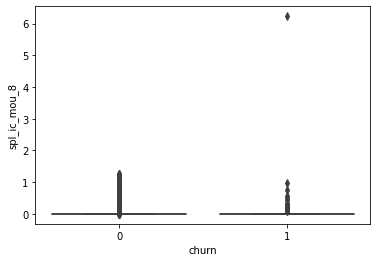

In [218]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.spl_ic_mou_8, data = telecom_data_highvalue_customers)
plt.show()

# Columns isd_ic_mou_6, isd_ic_mou_7, isd_ic_mou_8

In [219]:
telecom_data_highvalue_customers.isd_ic_mou_6.describe()

count    29344.000000
mean         9.709353
std         63.949454
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max       3965.690000
Name: isd_ic_mou_6, dtype: float64

In [220]:
telecom_data_highvalue_customers.isd_ic_mou_7.describe()

count    29344.000000
mean        11.305011
std         75.543781
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max       4747.910000
Name: isd_ic_mou_7, dtype: float64

In [221]:
telecom_data_highvalue_customers.isd_ic_mou_8.describe()

count    29344.000000
mean        10.761739
std         74.517386
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max       4100.380000
Name: isd_ic_mou_8, dtype: float64

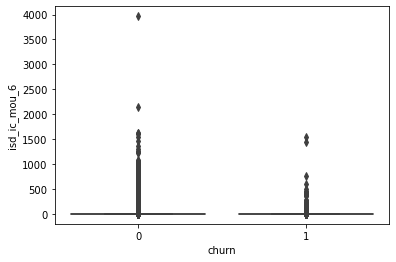

In [222]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.isd_ic_mou_6, data = telecom_data_highvalue_customers)
plt.show()

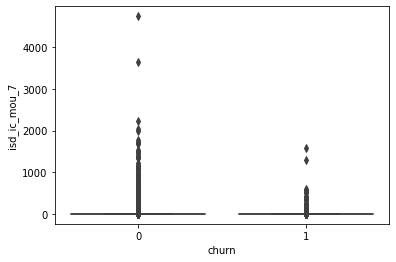

In [223]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.isd_ic_mou_7, data = telecom_data_highvalue_customers)
plt.show()

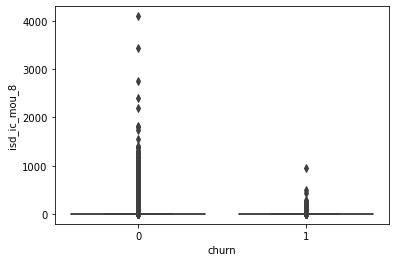

In [224]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.isd_ic_mou_8, data = telecom_data_highvalue_customers)
plt.show()

# Columns ic_others_6, ic_others_7, ic_others_8

In [225]:
telecom_data_highvalue_customers.ic_others_6.describe()

count    29344.000000
mean         1.153729
std         14.200205
min          0.000000
25%          0.000000
50%          0.000000
75%          0.060000
max       1344.140000
Name: ic_others_6, dtype: float64

In [226]:
telecom_data_highvalue_customers.ic_others_7.describe()

count    29344.000000
mean         1.413897
std         15.550569
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max       1495.940000
Name: ic_others_7, dtype: float64

In [227]:
telecom_data_highvalue_customers.ic_others_8.describe()

count    29344.000000
mean         1.198128
std         13.139143
min          0.000000
25%          0.000000
50%          0.000000
75%          0.050000
max       1209.860000
Name: ic_others_8, dtype: float64

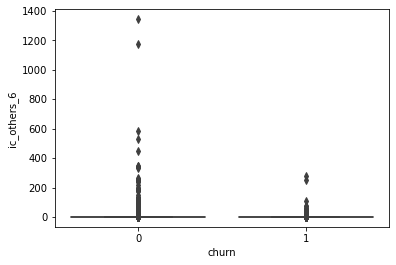

In [228]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.ic_others_6, data = telecom_data_highvalue_customers)
plt.show()

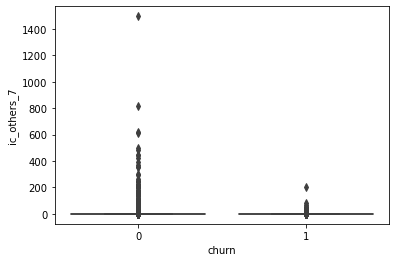

In [229]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.ic_others_7, data = telecom_data_highvalue_customers)
plt.show()

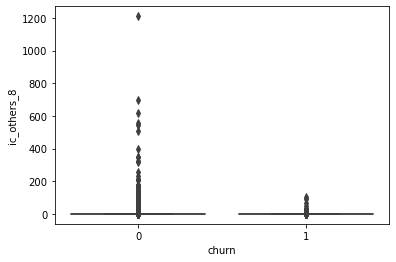

In [230]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.ic_others_8, data = telecom_data_highvalue_customers)
plt.show()

# Columns total_rech_num_6, total_rech_num_7, total_rech_num_8

In [231]:
telecom_data_highvalue_customers.total_rech_num_6.describe()

count    29344.000000
mean        13.900968
std          9.400828
min          0.000000
25%          8.000000
50%         12.000000
75%         17.000000
max        307.000000
Name: total_rech_num_6, dtype: float64

In [232]:
telecom_data_highvalue_customers.total_rech_num_7.describe()

count    29344.000000
mean        13.956482
std          9.473938
min          0.000000
25%          8.000000
50%         12.000000
75%         17.000000
max        138.000000
Name: total_rech_num_7, dtype: float64

In [233]:
telecom_data_highvalue_customers.total_rech_num_8.describe()

count    29344.000000
mean        11.962582
std          9.799449
min          0.000000
25%          6.000000
50%         10.000000
75%         15.000000
max        196.000000
Name: total_rech_num_8, dtype: float64

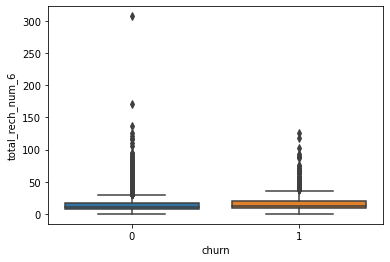

In [234]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.total_rech_num_6, data = telecom_data_highvalue_customers)
plt.show()

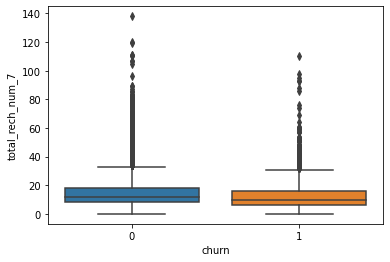

In [235]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.total_rech_num_7, data = telecom_data_highvalue_customers)
plt.show()

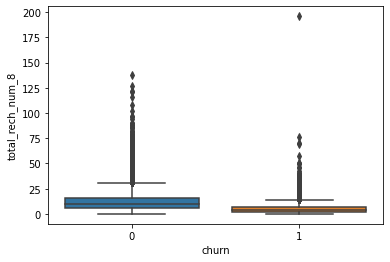

In [236]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.total_rech_num_8, data = telecom_data_highvalue_customers)
plt.show()

# Columns total_rech_amt_6, total_rech_amt_7, total_rech_amt_8

In [237]:
telecom_data_highvalue_customers.total_rech_amt_6.describe()

count    29344.000000
mean       663.602338
std        555.973195
min          0.000000
25%        374.000000
50%        560.000000
75%        824.000000
max      35190.000000
Name: total_rech_amt_6, dtype: float64

In [238]:
telecom_data_highvalue_customers.total_rech_amt_7.describe()

count    29344.000000
mean       665.930139
std        575.641160
min          0.000000
25%        371.000000
50%        556.000000
75%        824.000000
max      40335.000000
Name: total_rech_amt_7, dtype: float64

In [239]:
telecom_data_highvalue_customers.total_rech_amt_8.describe()

count    29344.000000
mean       587.894595
std        605.360784
min          0.000000
25%        270.000000
50%        489.000000
75%        769.000000
max      45320.000000
Name: total_rech_amt_8, dtype: float64

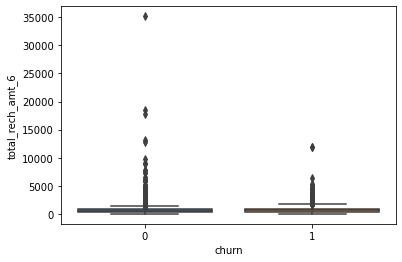

In [240]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.total_rech_amt_6, data = telecom_data_highvalue_customers)
plt.show()

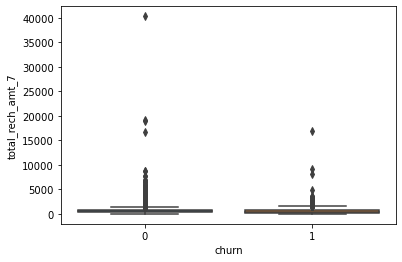

In [241]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.total_rech_amt_7, data = telecom_data_highvalue_customers)
plt.show()

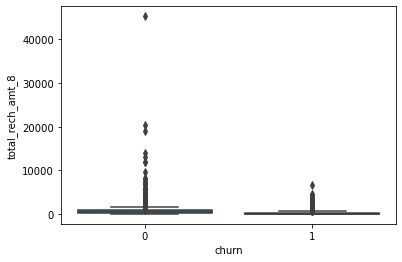

In [242]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.total_rech_amt_8, data = telecom_data_highvalue_customers)
plt.show()

# Columns max_rech_amt_6, max_rech_amt_7, max_rech_amt_8

In [243]:
telecom_data_highvalue_customers.max_rech_amt_6.describe()

count    29344.000000
mean       137.318123
std        155.354345
min          0.000000
25%         50.000000
50%        110.000000
75%        150.000000
max       3559.000000
Name: max_rech_amt_6, dtype: float64

In [244]:
telecom_data_highvalue_customers.max_rech_amt_7.describe()

count    29344.000000
mean       141.540860
std        164.153784
min          0.000000
25%         50.000000
50%        110.000000
75%        152.000000
max       3100.000000
Name: max_rech_amt_7, dtype: float64

In [245]:
telecom_data_highvalue_customers.max_rech_amt_8.describe()

count    29344.000000
mean       133.916508
std        152.202555
min          0.000000
25%         50.000000
50%        130.000000
75%        150.000000
max       3299.000000
Name: max_rech_amt_8, dtype: float64

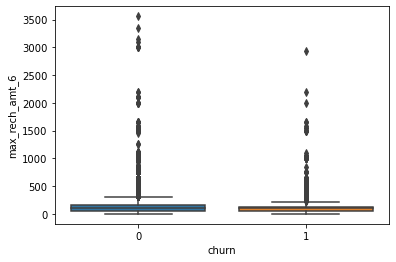

In [246]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.max_rech_amt_6, data = telecom_data_highvalue_customers)
plt.show()

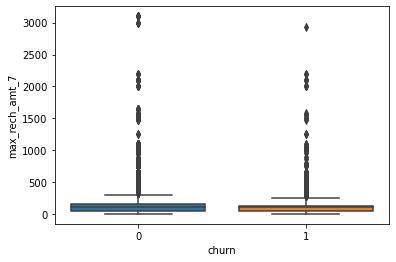

In [247]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.max_rech_amt_7, data = telecom_data_highvalue_customers)
plt.show()

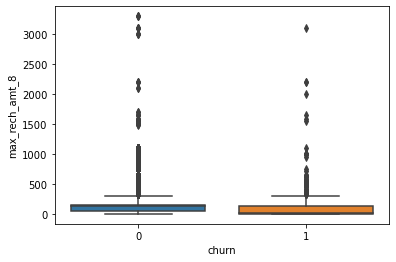

In [248]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.max_rech_amt_8, data = telecom_data_highvalue_customers)
plt.show()

# Columns last_day_rch_amt_6, last_day_rch_amt_7, last_day_rch_amt_8

In [249]:
telecom_data_highvalue_customers.last_day_rch_amt_6.describe()

count    29344.000000
mean        79.901513
std        118.076493
min          0.000000
25%         20.000000
50%         50.000000
75%        110.000000
max       3350.000000
Name: last_day_rch_amt_6, dtype: float64

In [250]:
telecom_data_highvalue_customers.last_day_rch_amt_7.describe()

count    29344.000000
mean        81.972226
std        121.141762
min          0.000000
25%         20.000000
50%         50.000000
75%        120.000000
max       3100.000000
Name: last_day_rch_amt_7, dtype: float64

In [251]:
telecom_data_highvalue_customers.last_day_rch_amt_8.describe()

count    29344.000000
mean        75.095352
std        119.491986
min          0.000000
25%         10.000000
50%         30.000000
75%        130.000000
max       3299.000000
Name: last_day_rch_amt_8, dtype: float64

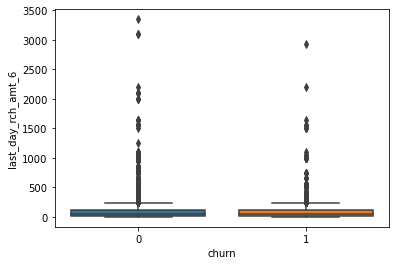

In [252]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.last_day_rch_amt_6, data = telecom_data_highvalue_customers)
plt.show()

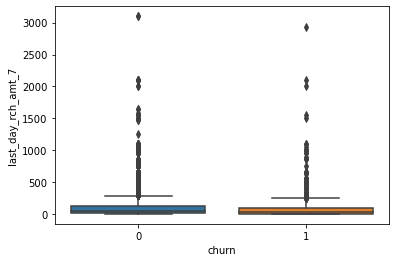

In [253]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.last_day_rch_amt_7, data = telecom_data_highvalue_customers)
plt.show()

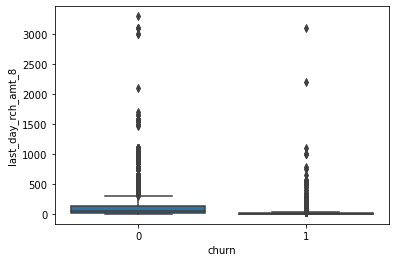

In [254]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.last_day_rch_amt_8, data = telecom_data_highvalue_customers)
plt.show()

# Columns total_rech_data_6, total_rech_data_7, total_rech_data_8

In [255]:
telecom_data_highvalue_customers.total_rech_data_6.describe()

count    29344.000000
mean         1.133656
std          2.608513
min          0.000000
25%          0.000000
50%          0.000000
75%          1.000000
max         61.000000
Name: total_rech_data_6, dtype: float64

In [256]:
telecom_data_highvalue_customers.total_rech_data_7.describe()

count    29344.000000
mean         1.286089
std          2.880714
min          0.000000
25%          0.000000
50%          0.000000
75%          1.000000
max         54.000000
Name: total_rech_data_7, dtype: float64

In [257]:
telecom_data_highvalue_customers.total_rech_data_8.describe()

count    29344.000000
mean         1.196906
std          2.785804
min          0.000000
25%          0.000000
50%          0.000000
75%          1.000000
max         60.000000
Name: total_rech_data_8, dtype: float64

In [258]:
telecom_data_highvalue_customers.total_rech_data_6.unique()

array([ 0.,  5.,  4.,  2.,  1.,  6.,  8., 12., 16., 11.,  3., 10.,  7.,
       20.,  9., 29., 23., 15., 18., 22., 27., 17., 21., 13., 14., 19.,
       35., 25., 33., 61., 55., 24., 26., 28., 40., 32., 46., 34.])

In [259]:
telecom_data_highvalue_customers.total_rech_data_7.unique()

array([ 0.,  2.,  8.,  5.,  1.,  4., 12.,  3.,  6., 16.,  7., 11., 10.,
        9., 29., 42., 17., 14., 13., 15., 23., 22., 20., 19., 21., 32.,
       25., 26., 18., 24., 48., 35., 30., 27., 43., 31., 39., 44., 40.,
       50., 34., 37., 54.])

In [260]:
telecom_data_highvalue_customers.total_rech_data_8.unique()

array([ 0.,  3.,  1.,  2.,  4.,  5., 13.,  7., 15., 24., 14.,  6., 16.,
        8., 10.,  9., 12., 50., 11., 18., 57., 20., 17., 28., 46., 23.,
       25., 22., 26., 29., 32., 19., 49., 42., 48., 39., 40., 34., 44.,
       38., 21., 30., 33., 60., 27., 55.])

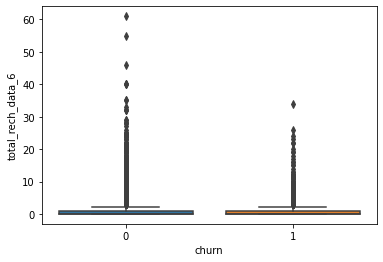

In [261]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.total_rech_data_6, data = telecom_data_highvalue_customers)
plt.show()

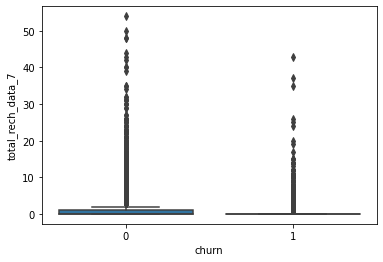

In [262]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.total_rech_data_7, data = telecom_data_highvalue_customers)
plt.show()

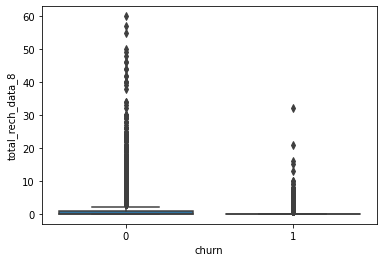

In [263]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.total_rech_data_8, data = telecom_data_highvalue_customers)
plt.show()

# Columns max_rech_data_6, max_rech_data_7, max_rech_data_8

In [264]:
telecom_data_highvalue_customers.max_rech_data_6.isna().sum()/len(telecom_data_highvalue_customers)*100

63.43034351145038

In [265]:
telecom_data_highvalue_customers.max_rech_data_7.isna().sum()/len(telecom_data_highvalue_customers)*100

62.31256815703381

In [266]:
telecom_data_highvalue_customers.max_rech_data_8.isna().sum()/len(telecom_data_highvalue_customers)*100

62.765812431842974

In [267]:
telecom_data_highvalue_customers.drop(['max_rech_data_6'],axis=1,inplace=True)
telecom_data_highvalue_customers.drop(['max_rech_data_7'],axis=1,inplace=True)
telecom_data_highvalue_customers.drop(['max_rech_data_8'],axis=1,inplace=True)

# Columns count_rech_2g_6, count_rech_2g_7, count_rech_2g_8

In [268]:
telecom_data_highvalue_customers.count_rech_2g_6.describe()

count    29344.000000
mean         0.830085
std          2.202003
min          0.000000
25%          0.000000
50%          0.000000
75%          1.000000
max         42.000000
Name: count_rech_2g_6, dtype: float64

In [269]:
telecom_data_highvalue_customers.count_rech_2g_7.describe()

count    29344.000000
mean         0.954812
std          2.424290
min          0.000000
25%          0.000000
50%          0.000000
75%          1.000000
max         48.000000
Name: count_rech_2g_7, dtype: float64

In [270]:
telecom_data_highvalue_customers.count_rech_2g_8.describe()

count    29344.000000
mean         0.889279
std          2.265835
min          0.000000
25%          0.000000
50%          0.000000
75%          1.000000
max         44.000000
Name: count_rech_2g_8, dtype: float64

In [271]:
telecom_data_highvalue_customers.count_rech_2g_6.unique()

array([ 0.,  4.,  1.,  2.,  3., 12.,  5., 16., 11.,  6., 10.,  7.,  8.,
       20.,  9., 19., 22., 14., 17., 13., 15., 21., 18., 25., 32., 39.,
       24., 28., 30., 42., 34.])

In [272]:
telecom_data_highvalue_customers.count_rech_2g_7.unique()

array([ 0.,  2.,  5.,  1., 10., 12.,  4.,  3., 16.,  6., 11.,  7.,  8.,
       15., 29., 22., 14.,  9., 13., 23., 17., 21., 19., 20., 18., 26.,
       27., 30., 28., 31., 32., 48., 43., 35., 24.])

In [273]:
telecom_data_highvalue_customers.count_rech_2g_8.unique()

array([ 0.,  3.,  1.,  2.,  4., 13.,  7., 15.,  5., 24.,  6.,  9., 10.,
       14., 12.,  8., 27., 11., 16., 18., 22., 17., 19., 26., 25., 21.,
       29., 33., 34., 20., 44., 32., 31., 23.])

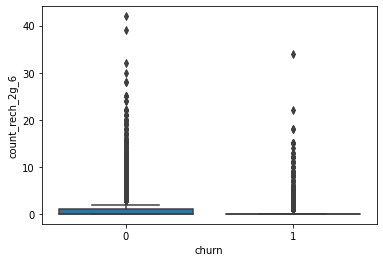

In [274]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.count_rech_2g_6, data = telecom_data_highvalue_customers)
plt.show()

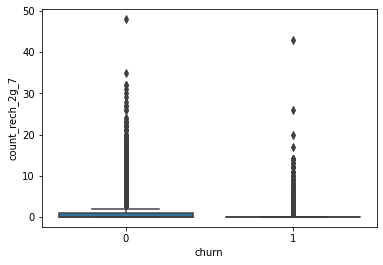

In [275]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.count_rech_2g_7, data = telecom_data_highvalue_customers)
plt.show()

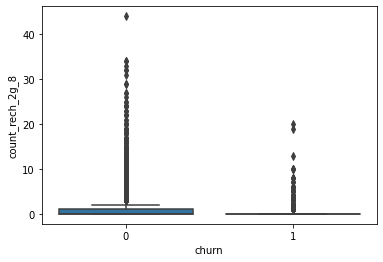

In [276]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.count_rech_2g_8, data = telecom_data_highvalue_customers)
plt.show()

# Columns count_rech_3g_6, count_rech_3g_7, count_rech_3g_8

In [277]:
telecom_data_highvalue_customers.count_rech_3g_6.describe()

count    29344.000000
mean         0.303571
std          1.113560
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max         29.000000
Name: count_rech_3g_6, dtype: float64

In [278]:
telecom_data_highvalue_customers.count_rech_3g_7.describe()

count    29344.000000
mean         0.331277
std          1.241193
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max         35.000000
Name: count_rech_3g_7, dtype: float64

In [279]:
telecom_data_highvalue_customers.count_rech_3g_8.describe()

count    29344.000000
mean         0.307627
std          1.223959
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max         45.000000
Name: count_rech_3g_8, dtype: float64

In [280]:
telecom_data_highvalue_customers.count_rech_3g_6.unique()

array([ 0.,  5.,  3.,  1.,  2.,  8.,  4., 10., 22., 13.,  7., 11., 29.,
        6., 16., 18., 12., 19.,  9., 23., 14., 17., 15., 21., 28.])

In [281]:
telecom_data_highvalue_customers.count_rech_3g_7.unique()

array([ 0.,  8.,  1.,  4.,  2.,  3.,  5.,  7., 20., 15.,  6., 10., 12.,
       17., 23., 22., 11.,  9., 13., 19., 14., 21., 24., 18., 35., 34.,
       16., 31.])

In [282]:
telecom_data_highvalue_customers.count_rech_3g_8.unique()

array([ 0.,  1.,  2.,  5.,  3.,  7.,  4., 23., 30., 13.,  8.,  6., 10.,
       24., 12., 25., 15., 16.,  9., 45., 19., 21., 18., 11., 17., 20.,
       14., 29., 42.])

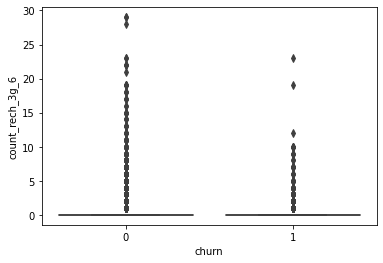

In [283]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.count_rech_3g_6, data = telecom_data_highvalue_customers)
plt.show()

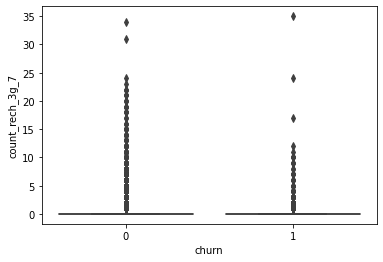

In [284]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.count_rech_3g_7, data = telecom_data_highvalue_customers)
plt.show()

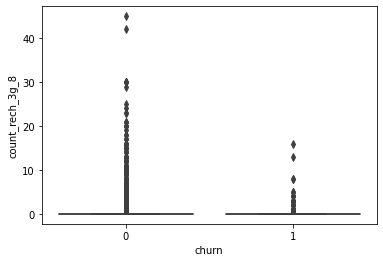

In [285]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.count_rech_3g_8, data = telecom_data_highvalue_customers)
plt.show()

# Columns av_rech_amt_data_6, av_rech_amt_data_7, av_rech_amt_data_8

In [286]:
telecom_data_highvalue_customers.av_rech_amt_data_6.describe()

count    29344.000000
mean        81.149051
std        184.305402
min          0.000000
25%          0.000000
50%          0.000000
75%         99.000000
max       7546.000000
Name: av_rech_amt_data_6, dtype: float64

In [287]:
telecom_data_highvalue_customers.av_rech_amt_data_7.describe()

count    29344.000000
mean        88.578555
std        191.528315
min          0.000000
25%          0.000000
50%          0.000000
75%        126.000000
max       4365.000000
Name: av_rech_amt_data_7, dtype: float64

In [288]:
telecom_data_highvalue_customers.av_rech_amt_data_8.describe()

count    29344.000000
mean        80.932202
std        178.200377
min          0.000000
25%          0.000000
50%          0.000000
75%         98.000000
max       4061.000000
Name: av_rech_amt_data_8, dtype: float64

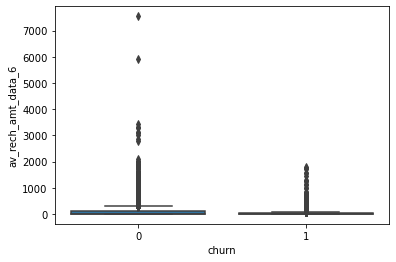

In [289]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.av_rech_amt_data_6, data = telecom_data_highvalue_customers)
plt.show()

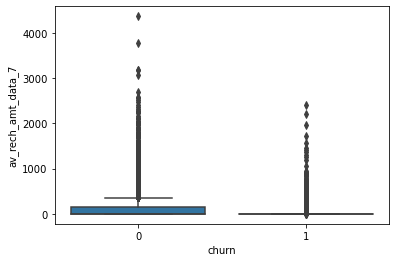

In [290]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.av_rech_amt_data_7, data = telecom_data_highvalue_customers)
plt.show()

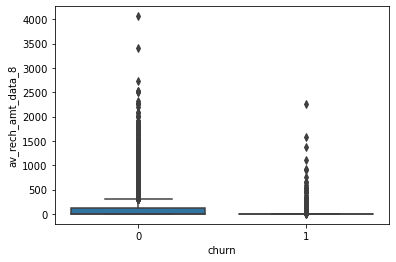

In [291]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.av_rech_amt_data_8, data = telecom_data_highvalue_customers)
plt.show()

# Columns vol_2g_mb_6, vol_2g_mb_7, vol_2g_mb_8

In [292]:
telecom_data_highvalue_customers.vol_2g_mb_6.describe()

count    29344.000000
mean        74.035887
std        252.997558
min          0.000000
25%          0.000000
50%          0.000000
75%         11.262500
max      10285.900000
Name: vol_2g_mb_6, dtype: float64

In [293]:
telecom_data_highvalue_customers.vol_2g_mb_7.describe()

count    29344.000000
mean        74.658407
std        262.869509
min          0.000000
25%          0.000000
50%          0.000000
75%         12.332500
max       5606.290000
Name: vol_2g_mb_7, dtype: float64

In [294]:
telecom_data_highvalue_customers.vol_2g_mb_8.describe()

count    29344.000000
mean        67.446192
std        259.046976
min          0.000000
25%          0.000000
50%          0.000000
75%          7.392500
max      11117.610000
Name: vol_2g_mb_8, dtype: float64

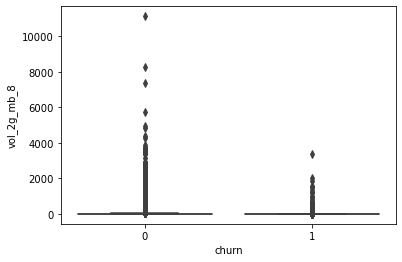

In [295]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.vol_2g_mb_8, data = telecom_data_highvalue_customers)
plt.show()

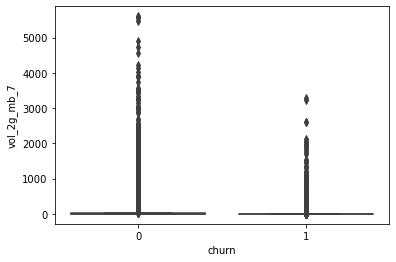

In [296]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.vol_2g_mb_7, data = telecom_data_highvalue_customers)
plt.show()

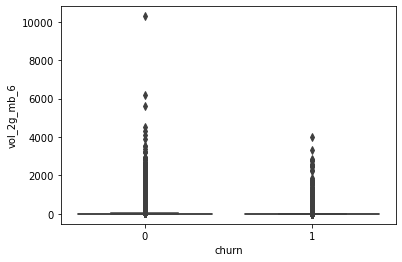

In [297]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.vol_2g_mb_6, data = telecom_data_highvalue_customers)
plt.show()

# Columns vol_3g_mb_6, vol_3g_mb_7, vol_3g_mb_8

In [298]:
telecom_data_highvalue_customers.vol_3g_mb_6.describe()

count    29344.000000
mean       226.337714
std        838.397811
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max      45735.400000
Name: vol_3g_mb_6, dtype: float64

In [299]:
telecom_data_highvalue_customers.vol_3g_mb_7.describe()

count    29344.000000
mean       246.081021
std        829.875577
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max      28144.120000
Name: vol_3g_mb_7, dtype: float64

In [300]:
telecom_data_highvalue_customers.vol_3g_mb_8.describe()

count    29344.000000
mean       238.364635
std        829.918647
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max      30036.060000
Name: vol_3g_mb_8, dtype: float64

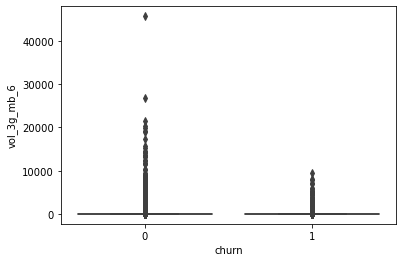

In [301]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.vol_3g_mb_6, data = telecom_data_highvalue_customers)
plt.show()

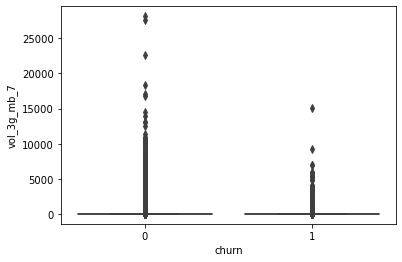

In [302]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.vol_3g_mb_7, data = telecom_data_highvalue_customers)
plt.show()

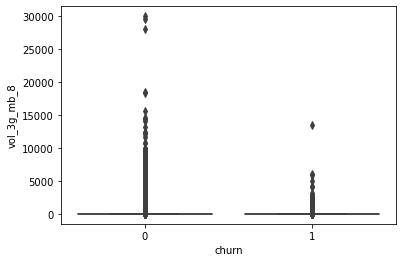

In [303]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.vol_3g_mb_8, data = telecom_data_highvalue_customers)
plt.show()

# Columns arpu_3g_6, arpu_3g_7, arpu_3g_8

In [304]:
telecom_data_highvalue_customers.arpu_3g_6.describe()

count    29344.000000
mean        46.897959
std        165.851345
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max       6362.280000
Name: arpu_3g_6, dtype: float64

In [305]:
telecom_data_highvalue_customers.arpu_3g_7.describe()

count    29344.000000
mean        48.693729
std        170.613237
min        -26.040000
25%          0.000000
50%          0.000000
75%          0.000000
max       4980.900000
Name: arpu_3g_7, dtype: float64

In [306]:
telecom_data_highvalue_customers.arpu_3g_8.describe()

count    29344.000000
mean        44.734534
std        156.150612
min        -20.040000
25%          0.000000
50%          0.000000
75%          0.000000
max       3716.900000
Name: arpu_3g_8, dtype: float64

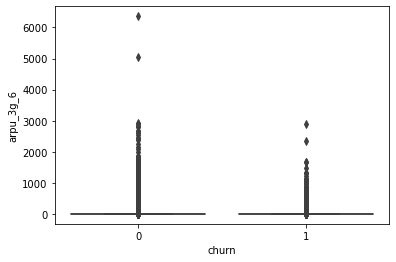

In [307]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.arpu_3g_6, data = telecom_data_highvalue_customers)
plt.show()

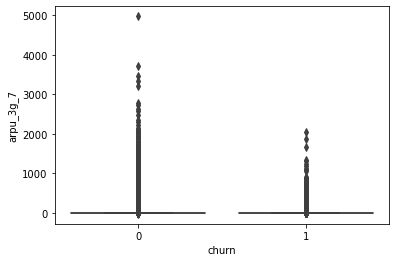

In [308]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.arpu_3g_7, data = telecom_data_highvalue_customers)
plt.show()

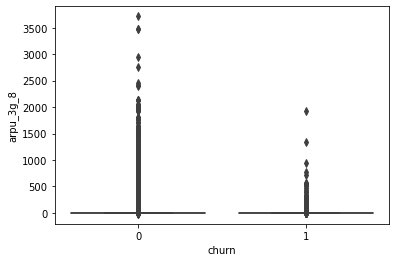

In [309]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.arpu_3g_8, data = telecom_data_highvalue_customers)
plt.show()

# Columns arpu_2g_6, arpu_2g_7, arpu_2g_8

In [310]:
telecom_data_highvalue_customers.arpu_2g_6.describe()

count    29344.000000
mean        43.879269
std        146.818257
min          0.000000
25%          0.000000
50%          0.000000
75%          1.542500
max       6433.760000
Name: arpu_2g_6, dtype: float64

In [311]:
telecom_data_highvalue_customers.arpu_2g_7.describe()

count    29344.000000
mean        45.272191
std        151.369767
min          0.000000
25%          0.000000
50%          0.000000
75%          1.400000
max       4809.360000
Name: arpu_2g_7, dtype: float64

In [312]:
telecom_data_highvalue_customers.arpu_2g_8.describe()

count    29344.000000
mean        41.335815
std        137.362242
min          0.000000
25%          0.000000
50%          0.000000
75%          0.300000
max       3467.170000
Name: arpu_2g_8, dtype: float64

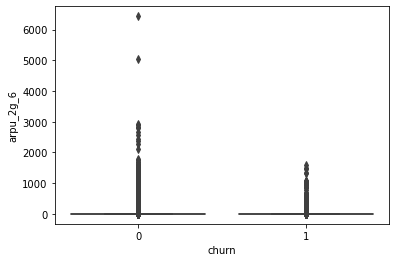

In [313]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.arpu_2g_6, data = telecom_data_highvalue_customers)
plt.show()

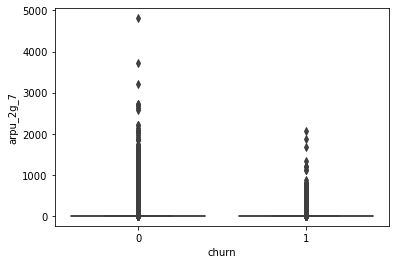

In [314]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.arpu_2g_7, data = telecom_data_highvalue_customers)
plt.show()

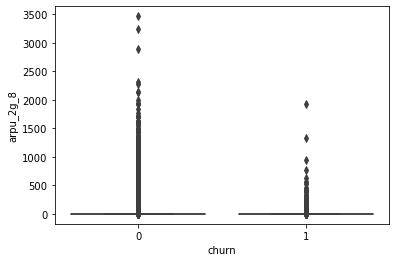

In [315]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.arpu_2g_8, data = telecom_data_highvalue_customers)
plt.show()

# Columns night_pck_user_6, night_pck_user_7, night_pck_user_8

In [316]:
telecom_data_highvalue_customers.night_pck_user_6.describe()

count    29344.000000
mean         0.013393
std          0.114952
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          1.000000
Name: night_pck_user_6, dtype: float64

In [317]:
telecom_data_highvalue_customers.night_pck_user_7.describe()

count    29344.000000
mean         0.012473
std          0.110985
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          1.000000
Name: night_pck_user_7, dtype: float64

In [318]:
telecom_data_highvalue_customers.night_pck_user_8.describe()

count    29344.000000
mean         0.011348
std          0.105923
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          1.000000
Name: night_pck_user_8, dtype: float64

In [319]:
telecom_data_highvalue_customers.night_pck_user_8.unique()

array([0., 1.])

In [320]:
telecom_data_highvalue_customers.night_pck_user_7.unique()

array([0., 1.])

In [321]:
telecom_data_highvalue_customers.night_pck_user_6.unique()

array([0., 1.])

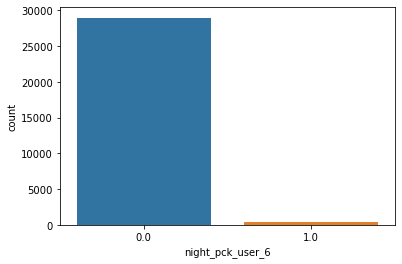

In [322]:
sns.countplot(x=telecom_data_highvalue_customers.night_pck_user_6,data=telecom_data_highvalue_customers)
plt.show()

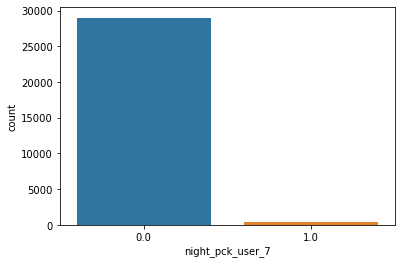

In [323]:
sns.countplot(x=telecom_data_highvalue_customers.night_pck_user_7,data=telecom_data_highvalue_customers)
plt.show()

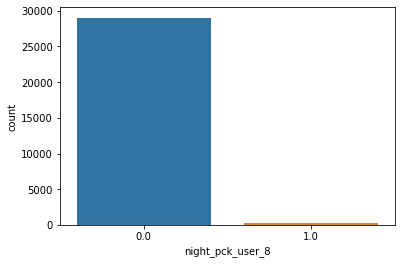

In [324]:
sns.countplot(x=telecom_data_highvalue_customers.night_pck_user_8,data=telecom_data_highvalue_customers)
plt.show()

# Columns monthly_2g_6, monthly_2g_7, monthly_2g_8

In [325]:
telecom_data_highvalue_customers.monthly_2g_6.describe()

count    29344.000000
mean         0.089218
std          0.318490
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          4.000000
Name: monthly_2g_6, dtype: float64

In [326]:
telecom_data_highvalue_customers.monthly_2g_7.describe()

count    29344.000000
mean         0.098453
std          0.338217
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          5.000000
Name: monthly_2g_7, dtype: float64

In [327]:
telecom_data_highvalue_customers.monthly_2g_8.describe()

count    29344.000000
mean         0.086832
std          0.313981
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          5.000000
Name: monthly_2g_8, dtype: float64

In [328]:
telecom_data_highvalue_customers.monthly_2g_6.unique()

array([0, 1, 2, 3, 4], dtype=int64)

In [329]:
telecom_data_highvalue_customers.monthly_2g_7.unique()

array([0, 1, 2, 5, 3, 4], dtype=int64)

In [330]:
telecom_data_highvalue_customers.monthly_2g_8.unique()

array([0, 1, 5, 2, 3, 4], dtype=int64)

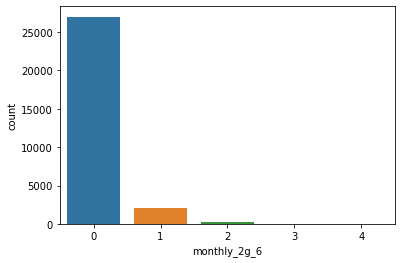

In [331]:
sns.countplot(x=telecom_data_highvalue_customers.monthly_2g_6,data=telecom_data_highvalue_customers)
plt.show()

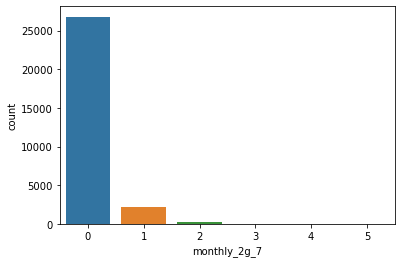

In [332]:
sns.countplot(x=telecom_data_highvalue_customers.monthly_2g_7,data=telecom_data_highvalue_customers)
plt.show()

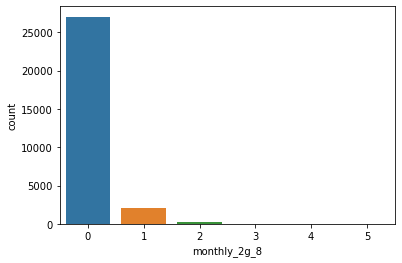

In [333]:
sns.countplot(x=telecom_data_highvalue_customers.monthly_2g_8,data=telecom_data_highvalue_customers)
plt.show()

# Columns sachet_2g_6, sachet_2g_7, sachet_2g_8

In [334]:
telecom_data_highvalue_customers.sachet_2g_6.describe()

count    29344.000000
mean         0.740867
std          2.186119
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max         42.000000
Name: sachet_2g_6, dtype: float64

In [335]:
telecom_data_highvalue_customers.sachet_2g_7.describe()

count    29344.000000
mean         0.856359
std          2.409183
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max         48.000000
Name: sachet_2g_7, dtype: float64

In [336]:
telecom_data_highvalue_customers.sachet_2g_8.describe()

count    29344.000000
mean         0.802447
std          2.248461
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max         44.000000
Name: sachet_2g_8, dtype: float64

In [337]:
telecom_data_highvalue_customers.sachet_2g_6.unique()

array([ 0,  4,  1,  3, 12,  5, 16, 11,  6,  2, 10,  7,  8, 20,  9, 19, 22,
       14, 13, 15, 21, 17, 18, 25, 32, 39, 24, 27, 30, 42, 34, 28],
      dtype=int64)

In [338]:
telecom_data_highvalue_customers.sachet_2g_7.unique()

array([ 0,  1,  5,  2, 10, 12,  4,  3, 16,  6, 11,  7,  8, 15, 29, 22, 14,
        9, 13, 23, 17, 21, 19, 20, 18, 26, 27, 30, 28, 32, 48, 42, 35, 24],
      dtype=int64)

In [339]:
telecom_data_highvalue_customers.sachet_2g_8.unique()

array([ 0,  3,  1,  2,  4, 13,  6, 15,  5, 24,  9,  7, 10, 14, 12,  8, 27,
       11, 16, 26, 18, 22, 17, 19, 25, 21, 29, 33, 34, 20, 44, 32, 31, 23],
      dtype=int64)

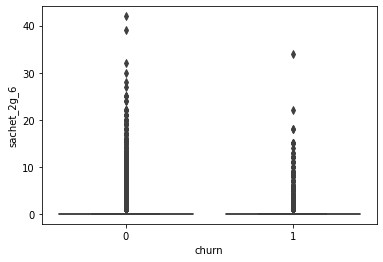

In [340]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.sachet_2g_6, data = telecom_data_highvalue_customers)
plt.show()

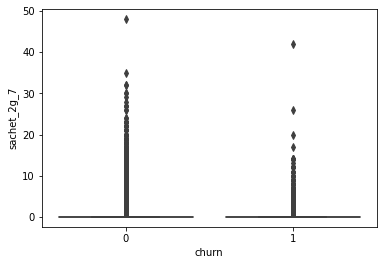

In [341]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.sachet_2g_7, data = telecom_data_highvalue_customers)
plt.show()

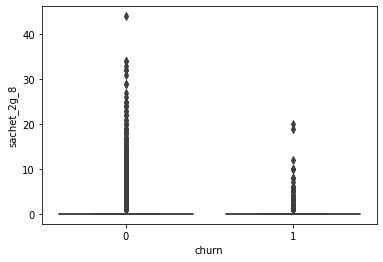

In [342]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.sachet_2g_8, data = telecom_data_highvalue_customers)
plt.show()

# Columns monthly_3g_6, monthly_3g_7, monthly_3g_8

In [343]:
telecom_data_highvalue_customers.monthly_3g_6.describe()

count    29344.000000
mean         0.146435
std          0.548620
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max         14.000000
Name: monthly_3g_6, dtype: float64

In [344]:
telecom_data_highvalue_customers.monthly_3g_7.describe()

count    29344.000000
mean         0.155023
std          0.595104
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max         16.000000
Name: monthly_3g_7, dtype: float64

In [345]:
telecom_data_highvalue_customers.monthly_3g_8.describe()

count    29344.000000
mean         0.143096
std          0.550801
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max         16.000000
Name: monthly_3g_8, dtype: float64

In [346]:
telecom_data_highvalue_customers.monthly_3g_6.unique()

array([ 0,  4,  2,  1,  3,  5,  7,  6,  9,  8, 11, 14], dtype=int64)

In [347]:
telecom_data_highvalue_customers.monthly_3g_7.unique()

array([ 0,  5,  1,  2,  8,  3,  4,  7,  6,  9, 11, 12, 14, 10, 16],
      dtype=int64)

In [348]:
telecom_data_highvalue_customers.monthly_3g_8.unique()

array([ 0,  1,  2,  7,  3,  4,  6,  5,  8, 10,  9, 16], dtype=int64)

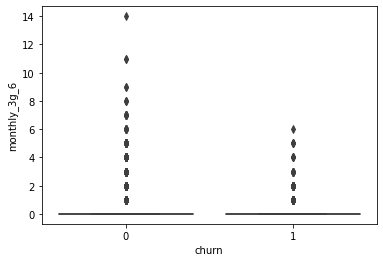

In [349]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.monthly_3g_6, data = telecom_data_highvalue_customers)
plt.show()

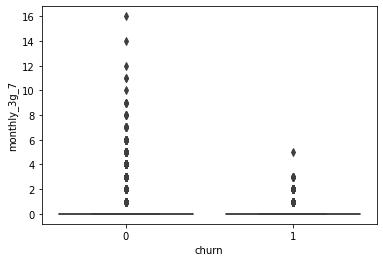

In [350]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.monthly_3g_7, data = telecom_data_highvalue_customers)
plt.show()

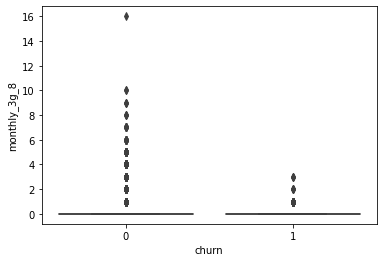

In [351]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.monthly_3g_8, data = telecom_data_highvalue_customers)
plt.show()

# Columns sachet_3g_6, sachet_3g_7, sachet_3g_8

In [352]:
telecom_data_highvalue_customers.sachet_3g_6.describe()

count    29344.000000
mean         0.157136
std          0.944539
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max         29.000000
Name: sachet_3g_6, dtype: float64

In [353]:
telecom_data_highvalue_customers.sachet_3g_7.describe()

count    29344.000000
mean         0.176254
std          1.061263
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max         35.000000
Name: sachet_3g_7, dtype: float64

In [354]:
telecom_data_highvalue_customers.sachet_3g_8.describe()

count    29344.000000
mean         0.164531
std          1.065417
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max         41.000000
Name: sachet_3g_8, dtype: float64

In [355]:
telecom_data_highvalue_customers.sachet_3g_6.unique()

array([ 0,  1,  3,  8,  2,  4, 10, 22,  5, 13,  7,  6, 29, 16, 18, 12, 11,
        9, 23, 14, 19, 15, 21, 17, 28], dtype=int64)

In [356]:
telecom_data_highvalue_customers.sachet_3g_7.unique()

array([ 0,  3,  1,  4,  2,  5,  7, 20, 15,  6,  9, 11,  8, 10, 12, 17, 22,
       18, 13, 21, 24, 35, 19, 33, 16, 14, 31], dtype=int64)

In [357]:
telecom_data_highvalue_customers.sachet_3g_8.unique()

array([ 0,  2,  5,  1,  3,  4,  7, 23, 27, 13,  8,  6, 10, 21, 12, 25, 15,
        9, 38, 19, 14, 18, 11, 17, 20, 16, 30, 29, 41], dtype=int64)

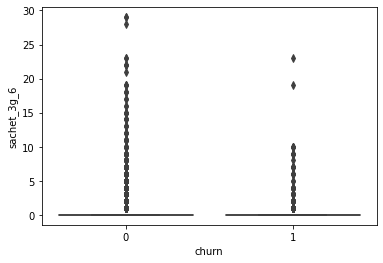

In [358]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.sachet_3g_6, data = telecom_data_highvalue_customers)
plt.show()

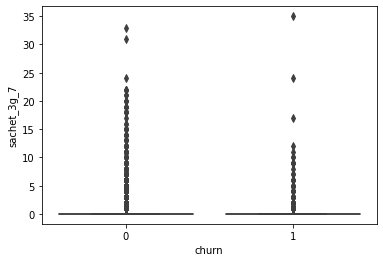

In [359]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.sachet_3g_7, data = telecom_data_highvalue_customers)
plt.show()

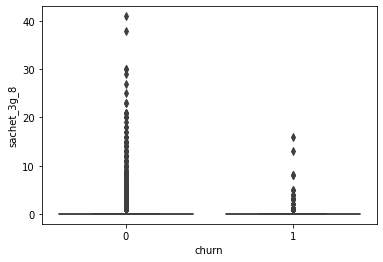

In [360]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.sachet_3g_8, data = telecom_data_highvalue_customers)
plt.show()

# Columns fb_user_6, fb_user_7, fb_user_8

In [361]:
telecom_data_highvalue_customers.fb_user_6.describe()

count    29344.000000
mean         0.324019
std          0.468015
min          0.000000
25%          0.000000
50%          0.000000
75%          1.000000
max          1.000000
Name: fb_user_6, dtype: float64

In [362]:
telecom_data_highvalue_customers.fb_user_7.describe()

count    29344.000000
mean         0.331754
std          0.470851
min          0.000000
25%          0.000000
50%          0.000000
75%          1.000000
max          1.000000
Name: fb_user_7, dtype: float64

In [363]:
telecom_data_highvalue_customers.fb_user_8.describe()

count    29344.000000
mean         0.312636
std          0.463575
min          0.000000
25%          0.000000
50%          0.000000
75%          1.000000
max          1.000000
Name: fb_user_8, dtype: float64

In [364]:
telecom_data_highvalue_customers.fb_user_6.unique()

array([0., 1.])

In [365]:
telecom_data_highvalue_customers.fb_user_7.unique()

array([0., 1.])

In [366]:
telecom_data_highvalue_customers.fb_user_8.unique()

array([0., 1.])

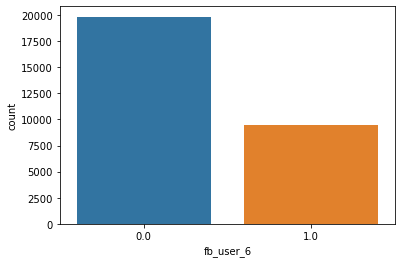

In [367]:
sns.countplot(x=telecom_data_highvalue_customers.fb_user_6,data=telecom_data_highvalue_customers)
plt.show()

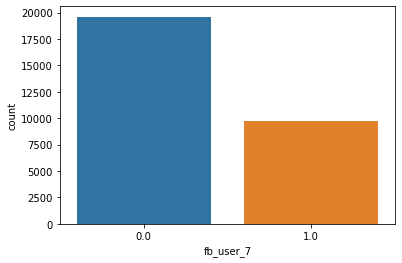

In [368]:
sns.countplot(x=telecom_data_highvalue_customers.fb_user_7,data=telecom_data_highvalue_customers)
plt.show()

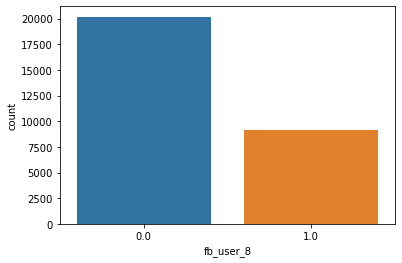

In [369]:
sns.countplot(x=telecom_data_highvalue_customers.fb_user_8,data=telecom_data_highvalue_customers)
plt.show()

# Columns total_days_since_last_recharge_6, total_days_since_last_recharge_7, total_days_since_last_recharge_8

In [370]:
telecom_data_highvalue_customers['total_days_since_last_recharge_6'].isna().sum()

89

In [371]:
telecom_data_highvalue_customers['total_days_since_last_recharge_7'].isna().sum()

122

In [372]:
telecom_data_highvalue_customers['total_days_since_last_recharge_8'].isna().sum()

475

In [373]:
telecom_data_highvalue_customers = telecom_data_highvalue_customers[~telecom_data_highvalue_customers.total_days_since_last_recharge_6.isna()]

In [374]:
telecom_data_highvalue_customers = telecom_data_highvalue_customers[~telecom_data_highvalue_customers.total_days_since_last_recharge_7.isna()]

In [375]:
telecom_data_highvalue_customers = telecom_data_highvalue_customers[~telecom_data_highvalue_customers.total_days_since_last_recharge_8.isna()]

In [376]:
telecom_data_highvalue_customers.total_days_since_last_recharge_6.describe()

count    28723.000000
mean         2.407444
std          3.460203
min          0.000000
25%          0.000000
50%          1.000000
75%          3.000000
max         29.000000
Name: total_days_since_last_recharge_6, dtype: float64

In [377]:
telecom_data_highvalue_customers.total_days_since_last_recharge_7.describe()

count    28723.000000
mean         2.715663
std          3.688146
min          0.000000
25%          0.000000
50%          1.000000
75%          4.000000
max         30.000000
Name: total_days_since_last_recharge_7, dtype: float64

In [378]:
telecom_data_highvalue_customers.total_days_since_last_recharge_8.describe()

count    28723.000000
mean         3.397069
std          4.445072
min          0.000000
25%          0.000000
50%          2.000000
75%          5.000000
max         30.000000
Name: total_days_since_last_recharge_8, dtype: float64

In [379]:
telecom_data_highvalue_customers.total_days_since_last_recharge_8.unique()

array([ 3.,  5.,  1., 17.,  6.,  0.,  7.,  4.,  8., 10.,  2.,  9., 14.,
       12., 16., 11., 30., 15., 19., 20., 23., 18., 13., 22., 26., 28.,
       29., 27., 25., 24., 21.])

In [380]:
telecom_data_highvalue_customers.total_days_since_last_recharge_7.unique()

array([ 0.,  6.,  3.,  1.,  2.,  8.,  5.,  4.,  9., 12., 11., 18.,  7.,
       16., 15., 13., 10., 22., 26., 19., 14., 27., 17., 25., 20., 21.,
       24., 23., 30., 28., 29.])

In [381]:
telecom_data_highvalue_customers.total_days_since_last_recharge_6.unique()

array([ 2.,  3.,  5., 16.,  0.,  1.,  4.,  9.,  8., 17., 14., 15.,  6.,
       12., 10.,  7., 11., 13., 19., 28., 26., 21., 20., 18., 22., 25.,
       29., 27., 23., 24.])

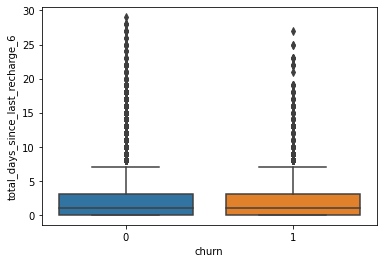

In [382]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.total_days_since_last_recharge_6, data = telecom_data_highvalue_customers)
plt.show()

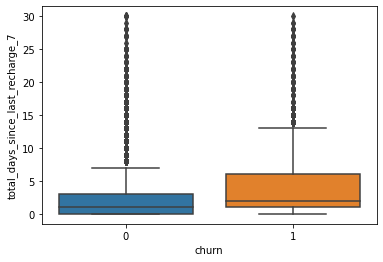

In [383]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.total_days_since_last_recharge_7, data = telecom_data_highvalue_customers)
plt.show()

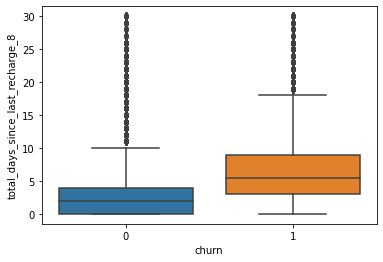

In [384]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.total_days_since_last_recharge_8, data = telecom_data_highvalue_customers)
plt.show()

# Columns total_days_since_last_data_recharge_6, total_days_since_last_data_recharge_7, total_days_since_last_data_recharge_8

In [385]:
telecom_data_highvalue_customers['total_days_since_last_data_recharge_6'].isna().sum()/len(telecom_data_highvalue_customers)*100

63.21414893987397

In [386]:
telecom_data_highvalue_customers['total_days_since_last_data_recharge_7'].isna().sum()/len(telecom_data_highvalue_customers)*100

61.838944399958216

In [387]:
telecom_data_highvalue_customers['total_days_since_last_data_recharge_8'].isna().sum()/len(telecom_data_highvalue_customers)*100

62.016502454478996

In [388]:
telecom_data_highvalue_customers.drop(['total_days_since_last_data_recharge_6'],axis=1,inplace=True)
telecom_data_highvalue_customers.drop(['total_days_since_last_data_recharge_7'],axis=1,inplace=True)
telecom_data_highvalue_customers.drop(['total_days_since_last_data_recharge_8'],axis=1,inplace=True)

# Columns aon

In [389]:
telecom_data_highvalue_customers.aon.describe()

count    28723.000000
mean      1134.644048
std        905.000754
min        180.000000
25%        459.000000
50%        803.000000
75%       1540.000000
max       4321.000000
Name: aon, dtype: float64

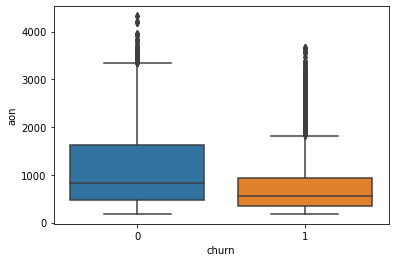

In [390]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.aon, data = telecom_data_highvalue_customers)
plt.show()

# Columns aug_vbc_3g

In [391]:
telecom_data_highvalue_customers.aug_vbc_3g.describe()

count    28723.000000
mean       113.730618
std        372.072207
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max      12916.220000
Name: aug_vbc_3g, dtype: float64

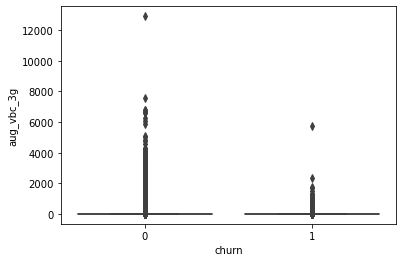

In [392]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.aug_vbc_3g, data = telecom_data_highvalue_customers)
plt.show()

# Columns jul_vbc_3g

In [393]:
telecom_data_highvalue_customers.jul_vbc_3g.describe()

count    28723.000000
mean       118.059148
std        389.754493
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max       9165.600000
Name: jul_vbc_3g, dtype: float64

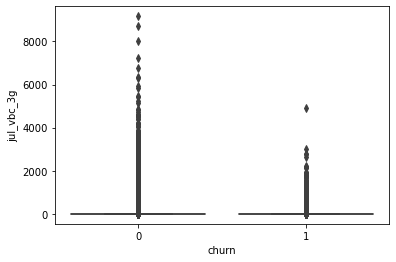

In [394]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.jul_vbc_3g, data = telecom_data_highvalue_customers)
plt.show()

# Columns jun_vbc_3g

In [395]:
telecom_data_highvalue_customers.jun_vbc_3g.describe()

count    28723.00000
mean       104.68306
std        368.31492
min          0.00000
25%          0.00000
50%          0.00000
75%          0.00000
max      11166.21000
Name: jun_vbc_3g, dtype: float64

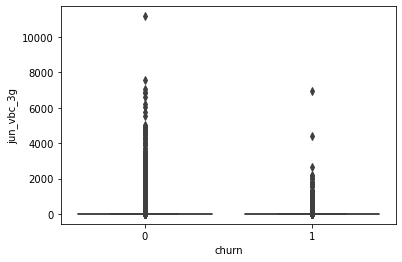

In [396]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.jun_vbc_3g, data = telecom_data_highvalue_customers)
plt.show()

# Columns sep_vbc_3g

In [397]:
telecom_data_highvalue_customers.sep_vbc_3g.describe()

count    28723.000000
mean         6.505171
std         47.440640
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max       2618.570000
Name: sep_vbc_3g, dtype: float64

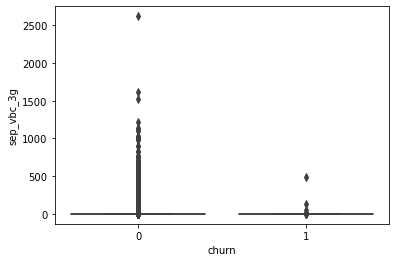

In [398]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.sep_vbc_3g, data = telecom_data_highvalue_customers)
plt.show()

# Columns total_avg_rech_amt_6_and_7

In [399]:
telecom_data_highvalue_customers.total_avg_rech_amt_6_and_7.describe()

count     28723.000000
mean      10489.281812
std       15781.328368
min        3148.000000
25%        4412.750000
50%        6498.000000
75%       11249.750000
max      853102.500000
Name: total_avg_rech_amt_6_and_7, dtype: float64

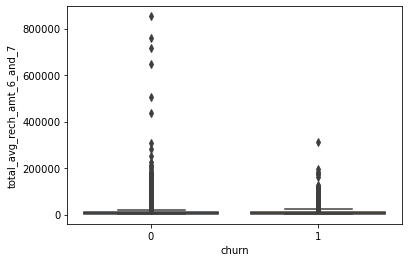

In [400]:
sns.boxplot(x = telecom_data_highvalue_customers.churn, y = telecom_data_highvalue_customers.total_avg_rech_amt_6_and_7, data = telecom_data_highvalue_customers)
plt.show()

# Columns churn

In [401]:
telecom_data_highvalue_customers.churn.describe()

count    28723.000000
mean         0.085576
std          0.279742
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          1.000000
Name: churn, dtype: float64

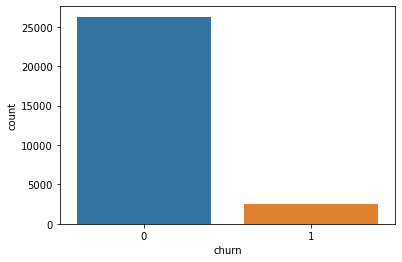

In [402]:
sns.countplot(x=telecom_data_highvalue_customers.churn,data=telecom_data_highvalue_customers)
plt.show()

#### For the following variables there is some distinguishable pattern seen in plots for churn and non-churn
<br /> std_og_mou_6
<br /> std_og_mou_8
<br /> total_og_mou_8
<br /> loc_og_t2m_mou_6
<br /> loc_og_t2m_mou_7
<br /> loc_og_t2m_mou_8
<br /> loc_ic_t2t_mou_6
<br /> loc_ic_t2t_mou_7
<br /> loc_ic_t2t_mou_8
<br /> loc_ic_t2m_mou_6
<br /> loc_ic_t2m_mou_7
<br /> loc_ic_t2m_mou_8
<br /> std_og_t2m_mou_6
<br /> std_og_t2m_mou_8
<br /> offnet_mou_8
<br /> loc_ic_mou_6
<br /> loc_ic_mou_7
<br /> loc_ic_mou_8
<br /> loc_og_mou_6
<br /> loc_og_mou_7
<br /> loc_og_mou_8
<br /> onnet_mou_8
<br /> std_og_t2t_mou_6
<br /> std_og_t2t_mou_8
<br /> aon
<br /> total_days_since_last_recharge_6
<br /> total_days_since_last_recharge_7
<br /> total_days_since_last_recharge_8
<br /> total_rech_data_6
<br /> total_rech_data_7
<br /> total_rech_data_8
<br /> av_rech_amt_data_6
<br /> av_rech_amt_data_7
<br /> av_rech_amt_data_8
<br /> count_rech_2g_6
<br /> count_rech_2g_7
<br /> count_rech_2g_8
<br /> total_rech_data_7
<br /> total_rech_data_8
<br /> last_day_rch_amt_7
<br /> last_day_rch_amt_8
<br /> max_rech_amt_6
<br /> max_rech_amt_7
<br /> max_rech_amt_8
<br /> total_rech_amt_8

In [403]:
# Shape of dataframe
telecom_data_highvalue_customers.shape

(28723, 154)

In [404]:
telecom_data_highvalue_customers.isna().sum()

arpu_6                              0
arpu_7                              0
arpu_8                              0
onnet_mou_6                         0
onnet_mou_7                         0
onnet_mou_8                         0
offnet_mou_6                        0
offnet_mou_7                        0
offnet_mou_8                        0
roam_ic_mou_6                       0
roam_ic_mou_7                       0
roam_ic_mou_8                       0
roam_og_mou_6                       0
roam_og_mou_7                       0
roam_og_mou_8                       0
loc_og_t2t_mou_6                    0
loc_og_t2t_mou_7                    0
loc_og_t2t_mou_8                    0
loc_og_t2m_mou_6                    0
loc_og_t2m_mou_7                    0
loc_og_t2m_mou_8                    0
loc_og_t2f_mou_6                    0
loc_og_t2f_mou_7                    0
loc_og_t2f_mou_8                    0
loc_og_t2c_mou_6                    0
loc_og_t2c_mou_7                    0
loc_og_t2c_m

####################################################################
### Splitting the data into training set and testing set
####################################################################

In [405]:
# Dividing the data set into training set and testing set. 
np.random.seed(0)
train_telecom, test_telecom = train_test_split(telecom_data_highvalue_customers, train_size = 0.75, test_size = 0.25, random_state = 100)

In [406]:
print("After data cleaning is completed there are {} rows and {} columns for training data set. ".format((train_telecom.shape)[0],(train_telecom.shape)[1]))

After data cleaning is completed there are 21542 rows and 154 columns for training data set. 


In [407]:
print("After data cleaning is completed there are {} rows and {} columns for testing data set. ".format((test_telecom.shape)[0],(test_telecom.shape)[1]))

After data cleaning is completed there are 7181 rows and 154 columns for testing data set. 


In [408]:
# Displaying top five rows of data of training data set
train_telecom.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,total_avg_rech_amt_6_and_7,churn,total_days_since_last_recharge_6,total_days_since_last_recharge_7,total_days_since_last_recharge_8
10916,304.574,318.484,364.316,9.88,4.94,35.21,162.36,50.68,54.06,1.06,0.00,12.33,1.01,0.00,0.0,9.88,4.94,35.21,134.54,50.31,47.26,1.04,0.00,0.00,0.00,0.00,0.00,145.48,55.26,82.48,0.00,0.00,0.00,25.74,0.00,6.79,0.00,0.0,0.00,25.74,0.00,6.79,0.00,0.0,0.0,0.00,0.36,0.00,0.0,0.0,0.0,171.23,55.63,89.28,17.31,27.13,16.13,50.61,41.73,52.84,26.76,16.28,13.14,94.69,85.14,82.13,0.00,0.00,0.00,2.94,1.43,3.43,0.00,8.58,0.00,2.94,10.01,3.43,97.64,95.16,85.56,0.0,0.0,0.00,0.00,0.00,0.00,0.0,0.00,0.00,11,9,6,369,353,468,110,154,154,30,25,154,4.0,5.0,2.0,4.0,5.0,2.0,0.0,0.0,0.0,100.0,254.0,308.0,840.43,1015.47,140.86,0.0,150.8,1463.98,0.0,5.7,10.15,87.31,24.40,0.00,0.0,0.0,0.0,0,1,2,4,4,0,0,0,0,0,0,0,1.0,1.0,1.0,2158,995.87,173.0,0.0,0.0,3638.5,0,0.0,0.0,10.0
15176,821.170,317.299,893.058,152.34,121.44,344.78,1441.51,434.96,1586.14,0.00,68.23,0.00,0.00,309.98,0.0,37.53,0.00,14.48,392.39,34.06,301.61,3.06,0.00,0.00,0.45,2.85,0.00,432.99,34.06,316.09,114.81,69.26,330.29,1040.56,140.24,1284.53,0.00,0.0,0.00,1155.38,209.51,1614.83,3.01,0.0,0.0,2.46,2.85,0.00,0.0,0.0,0.0,1593.86,246.43,1930.93,64.98,0.70,56.74,756.61,66.53,654.71,430.23,45.76,312.94,1251.83,112.99,1024.41,0.43,0.00,0.00,83.13,10.08,72.91,0.00,0.00,0.00,83.56,10.08,72.91,1335.39,123.08,1097.33,0.0,0.0,0.00,0.00,0.00,0.00,0.0,0.00,0.00,12,5,11,914,486,1056,120,130,130,67,130,130,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,2000,0.00,0.0,0.0,0.0,6699.0,0,0.0,1.0,0.0
1181,266.555,311.068,0.000,252.41,263.03,0.00,243.19,304.79,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.96,0.34,0.00,40.39,28.43,0.00,0.00,0.00,0.00,0.00,0.00,0.00,41.36,28.78,0.00,251.44,262.68,0

In [409]:
# Data type of variables
train_telecom.info(verbose=1)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 21542 entries, 10916 to 5896
Data columns (total 154 columns):
 #   Column                            Dtype  
---  ------                            -----  
 0   arpu_6                            float64
 1   arpu_7                            float64
 2   arpu_8                            float64
 3   onnet_mou_6                       float64
 4   onnet_mou_7                       float64
 5   onnet_mou_8                       float64
 6   offnet_mou_6                      float64
 7   offnet_mou_7                      float64
 8   offnet_mou_8                      float64
 9   roam_ic_mou_6                     float64
 10  roam_ic_mou_7                     float64
 11  roam_ic_mou_8                     float64
 12  roam_og_mou_6                     float64
 13  roam_og_mou_7                     float64
 14  roam_og_mou_8                     float64
 15  loc_og_t2t_mou_6                  float64
 16  loc_og_t2t_mou_7                  fl

#########################################################
### Rescaling the features
#########################################################

In [410]:
# Min-max scaling
scaler = MinMaxScaler()

In [411]:
# Apply scaler() to the following columns
num_vars = [
'arpu_6',
'arpu_7',
'arpu_8',
'onnet_mou_6',
'onnet_mou_7',
'onnet_mou_8',
'offnet_mou_6',
'offnet_mou_7',
'offnet_mou_8',
'roam_ic_mou_6',
'roam_ic_mou_7',
'roam_ic_mou_8',
'roam_og_mou_6',
'roam_og_mou_7',
'roam_og_mou_8',
'loc_og_t2t_mou_6',
'loc_og_t2t_mou_7',
'loc_og_t2t_mou_8',
'loc_og_t2m_mou_6',
'loc_og_t2m_mou_7',
'loc_og_t2m_mou_8',
'loc_og_t2f_mou_6',
'loc_og_t2f_mou_7',
'loc_og_t2f_mou_8',
'loc_og_t2c_mou_6',
'loc_og_t2c_mou_7',
'loc_og_t2c_mou_8',
'loc_og_mou_6',
'loc_og_mou_7',
'loc_og_mou_8',
'std_og_t2t_mou_6',
'std_og_t2t_mou_7',
'std_og_t2t_mou_8',
'std_og_t2m_mou_6',
'std_og_t2m_mou_7',
'std_og_t2m_mou_8',
'std_og_t2f_mou_6',
'std_og_t2f_mou_7',
'std_og_t2f_mou_8',
'std_og_mou_6',
'std_og_mou_7',
'std_og_mou_8',
'isd_og_mou_6',
'isd_og_mou_7',
'isd_og_mou_8',
'spl_og_mou_6',
'spl_og_mou_7',
'spl_og_mou_8',
'og_others_6',
'og_others_7',
'og_others_8',
'total_og_mou_6',
'total_og_mou_7',
'total_og_mou_8',
'loc_ic_t2t_mou_6',
'loc_ic_t2t_mou_7',
'loc_ic_t2t_mou_8',
'loc_ic_t2m_mou_6',
'loc_ic_t2m_mou_7',
'loc_ic_t2m_mou_8',
'loc_ic_t2f_mou_6',
'loc_ic_t2f_mou_7',
'loc_ic_t2f_mou_8',
'loc_ic_mou_6',
'loc_ic_mou_7',
'loc_ic_mou_8',
'std_ic_t2t_mou_6',
'std_ic_t2t_mou_7',
'std_ic_t2t_mou_8',
'std_ic_t2m_mou_6',
'std_ic_t2m_mou_7',
'std_ic_t2m_mou_8',
'std_ic_t2f_mou_6',
'std_ic_t2f_mou_7',
'std_ic_t2f_mou_8',
'std_ic_mou_6',
'std_ic_mou_7',
'std_ic_mou_8',
'total_ic_mou_6',
'total_ic_mou_7',
'total_ic_mou_8',
'spl_ic_mou_6',
'spl_ic_mou_7',
'spl_ic_mou_8',
'isd_ic_mou_6',
'isd_ic_mou_7',
'isd_ic_mou_8',
'ic_others_6',
'ic_others_7',
'ic_others_8',
'total_rech_num_6',
'total_rech_num_7',
'total_rech_num_8',
'total_rech_amt_6',
'total_rech_amt_7',
'total_rech_amt_8',
'max_rech_amt_6',
'max_rech_amt_7',
'max_rech_amt_8',
'last_day_rch_amt_6',
'last_day_rch_amt_7',
'last_day_rch_amt_8',
'total_rech_data_6',
'total_rech_data_7',
'total_rech_data_8',
'count_rech_2g_6',
'count_rech_2g_7',
'count_rech_2g_8',
'count_rech_3g_6',
'count_rech_3g_7',
'count_rech_3g_8',
'av_rech_amt_data_6',
'av_rech_amt_data_7',
'av_rech_amt_data_8',
'vol_2g_mb_6',
'vol_2g_mb_7',
'vol_2g_mb_8',
'vol_3g_mb_6',
'vol_3g_mb_7',
'vol_3g_mb_8',
'arpu_3g_6',
'arpu_3g_7',
'arpu_3g_8',
'arpu_2g_6',
'arpu_2g_7',
'arpu_2g_8',
'night_pck_user_6',
'night_pck_user_7',
'night_pck_user_8',
'monthly_2g_6',
'monthly_2g_7',
'monthly_2g_8',
'sachet_2g_6',
'sachet_2g_7',
'sachet_2g_8',
'monthly_3g_6',
'monthly_3g_7',
'monthly_3g_8',
'sachet_3g_6',
'sachet_3g_7',
'sachet_3g_8',
'fb_user_6',
'fb_user_7',
'fb_user_8',
'aon',
'aug_vbc_3g',
'jul_vbc_3g',
'jun_vbc_3g',
'sep_vbc_3g',
'total_avg_rech_amt_6_and_7',
'churn',
'total_days_since_last_recharge_6',
'total_days_since_last_recharge_7',
'total_days_since_last_recharge_8'
]

In [412]:
# Apply fit_transform to Training data
train_telecom[num_vars] = scaler.fit_transform(train_telecom[num_vars])

In [413]:
# Apply transform to Test data
test_telecom[num_vars] = scaler.transform(test_telecom[num_vars])

In [414]:
# Displaying the Train Data
train_telecom.describe()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,total_avg_rech_amt_6_and_7,churn,total_days_since_last_recharge_6,total_days_since_last_recharge_7,total_days_since_last_recharge_8
count,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.000000,21542.

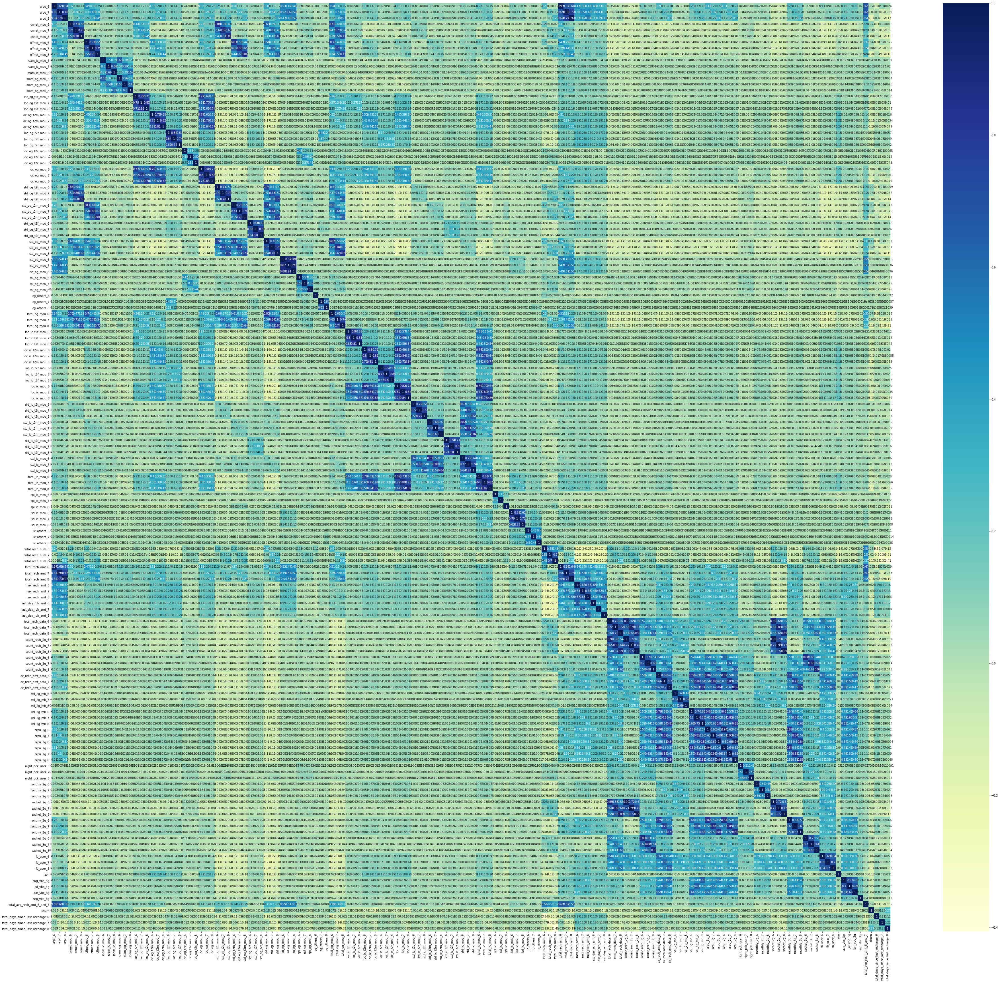

In [415]:
# Displaying the Heatmap for correlation
plt.figure(figsize = (66, 60))
sns.heatmap(train_telecom.corr(), annot = True, cmap="YlGnBu")
plt.show()#

In [416]:
# Correlation coefficients for numerical or continuous variables
corr = train_telecom.corr().unstack().sort_values(ascending=False)
pd.set_option('display.max_rows', len(corr))
print(corr)
pd.reset_option('display.max_rows')

total_days_since_last_recharge_8  total_days_since_last_recharge_8    1.000000
total_rech_data_8                 total_rech_data_8                   1.000000
max_rech_amt_7                    max_rech_amt_7                      1.000000
max_rech_amt_8                    max_rech_amt_8                      1.000000
last_day_rch_amt_6                last_day_rch_amt_6                  1.000000
last_day_rch_amt_7                last_day_rch_amt_7                  1.000000
last_day_rch_amt_8                last_day_rch_amt_8                  1.000000
total_rech_data_6                 total_rech_data_6                   1.000000
total_rech_data_7                 total_rech_data_7                   1.000000
count_rech_2g_6                   count_rech_2g_6                     1.000000
std_ic_mou_7                      std_ic_mou_7                        1.000000
count_rech_2g_7                   count_rech_2g_7                     1.000000
count_rech_2g_8                   count_rech_2g_8   

## There is high correlation between the following variables:
### sachet_2g_8 and count_rech_2g_8 - 0.9909
### sachet_2g_7 and count_rech_2g_7 - 0.9905
### sachet_2g_6 and count_rech_2g_6 - 0.9895
### Thus dropping the varibles sachet_2g_8, sachet_2g_7, sachet_2g_6

In [417]:
# Drop the variables due to high correlation
train_telecom.drop(['sachet_2g_7'],axis=1,inplace=True)
train_telecom.drop(['sachet_2g_8'],axis=1,inplace=True)
train_telecom.drop(['sachet_2g_6'],axis=1,inplace=True)
test_telecom.drop(['sachet_2g_7'],axis=1,inplace=True)
test_telecom.drop(['sachet_2g_8'],axis=1,inplace=True)
test_telecom.drop(['sachet_2g_6'],axis=1,inplace=True)

In [418]:
# Shape of the train data
train_telecom.shape

(21542, 151)

In [419]:
# Shape of the test data
test_telecom.shape

(7181, 151)

####################################################################
### Dividing into X and Y sets for training set and test set
####################################################################

In [420]:
# Training data output variable
train_telecom_output_variable =  train_telecom['churn']

In [421]:
# Dropping the price column
train_telecom_input_variables = train_telecom.drop('churn',axis=1)

In [422]:
# Test data output variable
test_telecom_output_variable =  test_telecom['churn']

In [423]:
# Dropping the price column
test_telecom_input_variables = test_telecom.drop('churn',axis=1)

In [424]:
# Getting and printing the names of all the columns
total_columns = train_telecom_input_variables.columns.tolist()
print(total_columns)

['arpu_6', 'arpu_7', 'arpu_8', 'onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8', 'offnet_mou_6', 'offnet_mou_7', 'offnet_mou_8', 'roam_ic_mou_6', 'roam_ic_mou_7', 'roam_ic_mou_8', 'roam_og_mou_6', 'roam_og_mou_7', 'roam_og_mou_8', 'loc_og_t2t_mou_6', 'loc_og_t2t_mou_7', 'loc_og_t2t_mou_8', 'loc_og_t2m_mou_6', 'loc_og_t2m_mou_7', 'loc_og_t2m_mou_8', 'loc_og_t2f_mou_6', 'loc_og_t2f_mou_7', 'loc_og_t2f_mou_8', 'loc_og_t2c_mou_6', 'loc_og_t2c_mou_7', 'loc_og_t2c_mou_8', 'loc_og_mou_6', 'loc_og_mou_7', 'loc_og_mou_8', 'std_og_t2t_mou_6', 'std_og_t2t_mou_7', 'std_og_t2t_mou_8', 'std_og_t2m_mou_6', 'std_og_t2m_mou_7', 'std_og_t2m_mou_8', 'std_og_t2f_mou_6', 'std_og_t2f_mou_7', 'std_og_t2f_mou_8', 'std_og_mou_6', 'std_og_mou_7', 'std_og_mou_8', 'isd_og_mou_6', 'isd_og_mou_7', 'isd_og_mou_8', 'spl_og_mou_6', 'spl_og_mou_7', 'spl_og_mou_8', 'og_others_6', 'og_others_7', 'og_others_8', 'total_og_mou_6', 'total_og_mou_7', 'total_og_mou_8', 'loc_ic_t2t_mou_6', 'loc_ic_t2t_mou_7', 'loc_ic_t2t_mou_8', 'lo

In [425]:
# Shape of train data input variable
train_telecom_input_variables.shape

(21542, 150)

In [426]:
# Shape of test data input variable
test_telecom_input_variables.shape

(7181, 150)

#################################################################
# Model Building
#################################################################

# SMOTE

In [427]:
# Fitting the data to the library
train_SMOTE_input_variables, train_SMOTE_output_variable = SMOTE().fit_sample(train_telecom_input_variables,train_telecom_output_variable)

In [428]:
# Displaying the balanced data
train_SMOTE_output_variable.value_counts()

1.0    19716
0.0    19716
Name: churn, dtype: int64

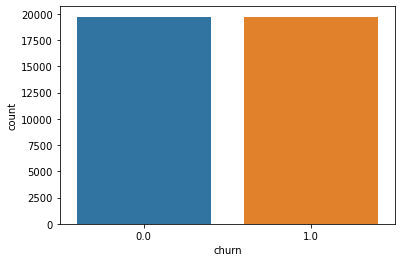

In [429]:
# Countplot of training data output variable
sns.countplot(x=train_SMOTE_output_variable)
plt.show()

# PCA

In [430]:
# Fitting the data to PCA
pca = PCA(random_state=40)
pca.fit(train_SMOTE_input_variables)

PCA(random_state=40)

In [431]:
# Displaying PCA components
pca.components_

array([[ 1.60644134e-03,  2.32414179e-03,  3.70987846e-03, ...,
         1.02585752e-02, -1.13083998e-02, -1.20048081e-02],
       [-3.26240628e-03,  5.52113133e-03,  1.07471319e-02, ...,
         8.70168088e-03, -9.30691163e-02, -1.81115678e-01],
       [ 5.48160627e-03, -1.58171759e-03,  6.97133385e-03, ...,
        -6.93339320e-03,  5.49612190e-04, -1.08421392e-01],
       ...,
       [ 0.00000000e+00, -5.83570065e-16,  2.79103771e-16, ...,
         7.41963504e-18,  7.82027351e-18,  3.44701267e-18],
       [-0.00000000e+00,  7.83949166e-16, -5.25799683e-16, ...,
         5.14279030e-17,  1.44114735e-17, -9.12669631e-19],
       [ 0.00000000e+00, -6.44518320e-16, -7.68956511e-16, ...,
        -1.95471021e-17, -9.19117654e-19, -1.67646173e-17]])

In [432]:
# Displaying variance explained by each component in PCA
pca.explained_variance_ratio_

array([5.04169693e-01, 9.93499185e-02, 7.22539005e-02, 4.69306982e-02,
       4.09004433e-02, 2.85561926e-02, 2.34327173e-02, 2.23750255e-02,
       1.72899783e-02, 1.64546422e-02, 1.27713568e-02, 9.73181231e-03,
       8.40281000e-03, 7.22246444e-03, 6.90767655e-03, 6.71598053e-03,
       5.88338524e-03, 5.29338538e-03, 4.77026322e-03, 4.12634201e-03,
       3.47269364e-03, 3.09926641e-03, 2.95466939e-03, 2.74963473e-03,
       2.45625447e-03, 2.25613945e-03, 2.10806807e-03, 1.75905114e-03,
       1.67117853e-03, 1.57763387e-03, 1.50272420e-03, 1.49841786e-03,
       1.44449233e-03, 1.41830215e-03, 1.34462434e-03, 1.23421481e-03,
       1.15340079e-03, 1.08446738e-03, 1.01259903e-03, 9.95673381e-04,
       9.21292302e-04, 8.79780090e-04, 8.61479462e-04, 7.58458287e-04,
       7.23365706e-04, 7.16680465e-04, 6.85217282e-04, 6.55240826e-04,
       6.04428790e-04, 5.72063526e-04, 5.66997607e-04, 5.41674021e-04,
       5.31416970e-04, 5.03641488e-04, 4.79003723e-04, 4.63353261e-04,
      

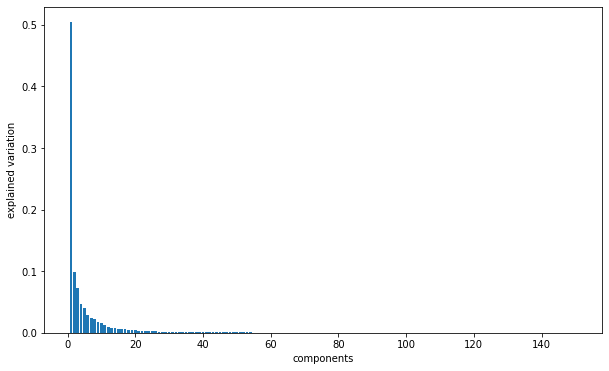

In [433]:
# Plot of explained variation v/s components
plt.figure(figsize = (10, 6))
plt.bar(range(1,len(pca.explained_variance_ratio_)+1),pca.explained_variance_ratio_)
plt.xlabel('components')
plt.ylabel('explained variation')
plt.show()

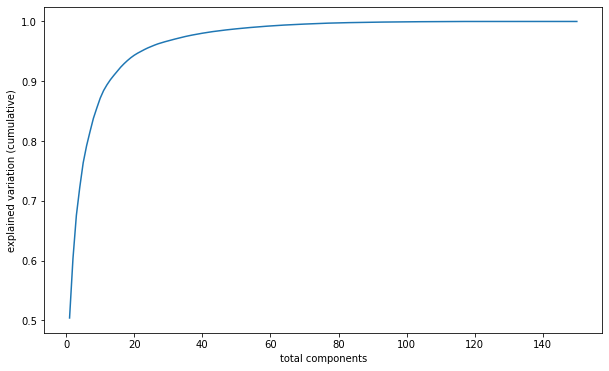

In [434]:
# Scree plot - explained variation (cumulative) v/s total components
plt.figure(figsize = (10, 6))
variance_cumulative = np.cumsum(pca.explained_variance_ratio_)
plt.plot(range(1,len(variance_cumulative)+1),variance_cumulative)
plt.xlabel('total components')
plt.ylabel('explained variation (cumulative)')
plt.show()

#### Approximately 96% of variance is explained by 30 components in PCA. Thus for further analysis 30 components in PCA will be available

In [435]:
# PCA with 30 components
pca2 = PCA(n_components=30, random_state=40)

# Fit and Transform the train input variables
train_SMOTE_PCA_input_variables = pca2.fit_transform(train_SMOTE_input_variables)

# Transform the test input variables
test_PCA_input_variables = pca2.transform(test_telecom_input_variables)

In [436]:
# Shape of train input variables
train_SMOTE_PCA_input_variables.shape

(39432, 30)

In [437]:
# Shape of test input variables
test_PCA_input_variables.shape

(7181, 30)

In [438]:
# Converting the train input variables to dataframe and assinging the column names
train_SMOTE_PCA_input_variables = pd.DataFrame(data = train_SMOTE_PCA_input_variables, columns = ["x1","x2","x3","x4","x5","x6","x7","x8","x9","x10","x11","x12","x13","x14","x15","x16","x17","x18","x19","x20","x21","x22","x23","x24","x25","x26","x27","x28","x29","x30"])

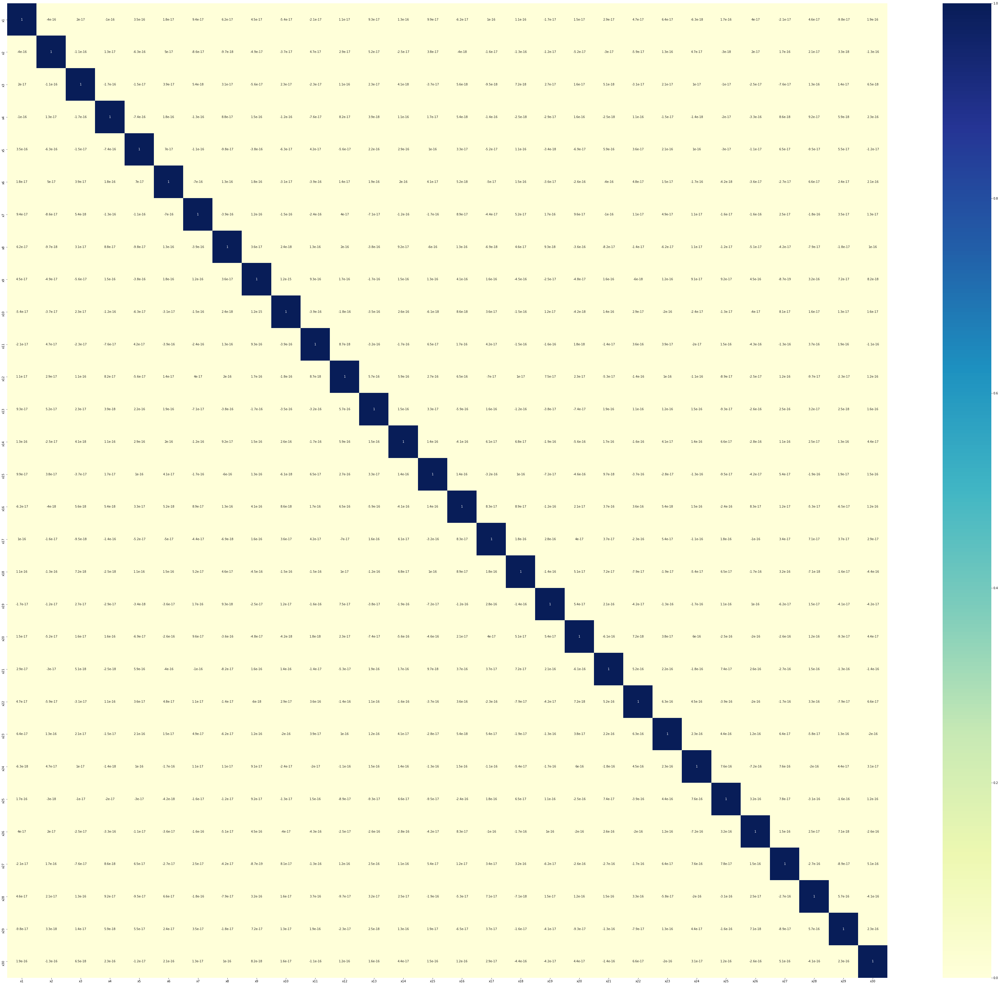

In [439]:
# Displaying the Heatmap for correlation
plt.figure(figsize = (66, 60))
sns.heatmap(train_SMOTE_PCA_input_variables.corr(), annot = True, cmap="YlGnBu")
plt.show()#

#### As can be seen from above chart there is no multicollinearity between the variables

In [440]:
# Converting the train output variables to dataframe and assinging the column names
train_SMOTE_output_variable = pd.DataFrame(data = train_SMOTE_output_variable, columns = ['churn'])

In [441]:
# Converting the test input variables to dataframe and assinging the column names
test_PCA_input_variables = pd.DataFrame(data = test_PCA_input_variables, columns = ["x1","x2","x3","x4","x5","x6","x7","x8","x9","x10","x11","x12","x13","x14","x15","x16","x17","x18","x19","x20","x21","x22","x23","x24","x25","x26","x27","x28","x29","x30"])

In [442]:
# Converting the test output variables to dataframe and assinging the column names
test_telecom_output_variable = pd.DataFrame(data = test_telecom_output_variable, columns = ['churn'])

# Logistic Regression

In [443]:
# Fit the GLM model
logm1 = sm.GLM(train_SMOTE_output_variable,(sm.add_constant(train_SMOTE_PCA_input_variables)), family = sm.families.Binomial())
logm1.fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  churn   No. Observations:                39432
Model:                            GLM   Df Residuals:                    39401
Model Family:                Binomial   Df Model:                           30
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -16119.
Date:                Mon, 02 Nov 2020   Deviance:                       32237.
Time:                        21:51:37   Pearson chi2:                 1.71e+05
No. Iterations:                     6                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.2109      0.016    -13.138      0.000      -0.242      -0.179
x1            -1.2730      0.025    -51.582      0.000      -1.321      -1.225
x2            -3.0864      0.054    -57.616      0.000      -3.191      -2.981
x3            -2.5302      0.060    -42.032      0.000      -2.648      -2.412
x4            -5.7062      0.090    -63.665      0.000      -5.882      -5.530
x5            -5.0957      0.094    -54.184      0.000      -5.280      -4.911
x6             1.3958      0.101     13.869      0.000       1.199       1.593
x7            -0.2350      0.107     -2.196      0.028      -0.445      -0.025
x8             0.7254      0.109      6.679      0.000       0.513       0.938
x9            -7.5607      0.177    -42.818      0.000      -7.907      -7.215
x10           -2.2978      0.121    -18.999      0.000      -2.535      -2.061
x11            3.2658      0.157     20.797      0.000       2.958       3.574
x12            1.0856      0.188      5.771      0.000       0.717       1.454
x13           -1.3630      0.206     -6.611      0.000      -1.767      -0.959
x14           -3.5625      0.209    -17.025      0.000      -3.973      -3.152
x15            0.9006      0.200      4.513      0.000       0.509       1.292
x16            4.7477      0.213     22.311      0.000       4.331       5.165
x17            3.2987      0.302     10.935      0.000       2.707       3.890
x18           -4.2820      0.265    -16.180      0.000      -4.801      -3.763
x19           -4.5072      0.250    -18.030      0.000      -4.997      -4.017
x20           -1.7333      0.260     -6.676      0.000      -2.242      -1.224
x21            5.6437      0.310     18.204      0.000       5.036       6.251
x22            6.8540      0.403     16.993      0.000       6.063       7.645
x23           13.6064      0.353     38.535      0.000      12.914      14.298
x24           -6.6778      0.361    -18.524      0.000      -7.384      -5.971
x25            0.3465      0.396      0.875      0.381      -0.429       1.122
x26            8.7178      0.412     21.172      0.000       7.911       9.525
x27           -1.7254      0.383     -4.504      0.000      -2.476      -0.975
x28            4.0918      0.485      8.429      0.000       3.140       5.043
x29           -0.2445      0.451     -0.542      0.588      -1.128       0.639
x30           -3.5230      0.469     -7.516      0.000      -4.442      -2.604
==============================================================================
"""

In [444]:
# RFE to get 12 input variables
logreg = LogisticRegression()
rfe = RFE(logreg, 12)             
rfe = rfe.fit(train_SMOTE_PCA_input_variables, train_SMOTE_output_variable)

In [445]:
# Displaying the array of rfe.support_
rfe.support_

array([False, False, False,  True,  True, False, False, False,  True,
       False, False, False, False,  True, False,  True,  True, False,
        True, False,  True,  True,  True,  True, False,  True, False,
       False, False, False])

In [446]:
# Displaying the list of 12 variables where the value True is provided and list of 18 variables where value False is provided
# The 12 variables where value True is provided, they will be utilized for further analysis
list(zip(train_SMOTE_PCA_input_variables.columns, rfe.support_, rfe.ranking_))

[('x1', False, 13),
 ('x2', False, 2),
 ('x3', False, 5),
 ('x4', True, 1),
 ('x5', True, 1),
 ('x6', False, 9),
 ('x7', False, 18),
 ('x8', False, 16),
 ('x9', True, 1),
 ('x10', False, 7),
 ('x11', False, 4),
 ('x12', False, 14),
 ('x13', False, 8),
 ('x14', True, 1),
 ('x15', False, 15),
 ('x16', True, 1),
 ('x17', True, 1),
 ('x18', False, 3),
 ('x19', True, 1),
 ('x20', False, 11),
 ('x21', True, 1),
 ('x22', True, 1),
 ('x23', True, 1),
 ('x24', True, 1),
 ('x25', False, 17),
 ('x26', True, 1),
 ('x27', False, 12),
 ('x28', False, 6),
 ('x29', False, 19),
 ('x30', False, 10)]

In [447]:
# Assigning the names of 12 selected variables
col = train_SMOTE_PCA_input_variables.columns[rfe.support_]

In [448]:
# Displaying the names of 18 variables which are not selected
train_SMOTE_PCA_input_variables.columns[~rfe.support_]

Index(['x1', 'x2', 'x3', 'x6', 'x7', 'x8', 'x10', 'x11', 'x12', 'x13', 'x15',
       'x18', 'x20', 'x25', 'x27', 'x28', 'x29', 'x30'],
      dtype='object')

In [449]:
# Fit the model with 12 selected variables
X_train_sm = sm.add_constant(train_SMOTE_PCA_input_variables[col])
logm2 = sm.GLM(train_SMOTE_output_variable,X_train_sm, family = sm.families.Binomial())
res = logm2.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  churn   No. Observations:                39432
Model:                            GLM   Df Residuals:                    39419
Model Family:                Binomial   Df Model:                           12
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -21212.
Date:                Mon, 02 Nov 2020   Deviance:                       42424.
Time:                        21:51:46   Pearson chi2:                 4.83e+04
No. Iterations:                     5                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0766      0.012     -6.330      0.000      -0.100      -0.053
x4            -4.1225      0.069    -59.798      0.000      -4.258      -3.987
x5            -3.7620      0.071    -52.745      0.000      -3.902      -3.622
x9            -4.5769      0.120    -38.051      0.000      -4.813      -4.341
x14           -3.0005      0.164    -18.344      0.000      -3.321      -2.680
x16            3.8990      0.166     23.515      0.000       3.574       4.224
x17            2.6572      0.210     12.683      0.000       2.247       3.068
x19           -4.4569      0.201    -22.219      0.000      -4.850      -4.064
x21            3.7041      0.252     14.709      0.000       3.211       4.198
x22            4.9808      0.276     18.056      0.000       4.440       5.521
x23           10.3120      0.283     36.447      0.000       9.757      10.867
x24           -6.3792      0.282    -22.612      0.000      -6.932      -5.826
x26            5.7063      0.312     18.302      0.000       5.095       6.317
==============================================================================
"""

In [450]:
# Getting the predicted values on the train set
y_train_pred = res.predict(X_train_sm)

# Reshaping the variables
y_train_pred = y_train_pred.values.reshape(-1)
y_train_actual = train_SMOTE_output_variable.values.reshape(-1)

In [451]:
# Displaying the churn probabilities
y_train_pred_final = pd.DataFrame({'Churn':y_train_actual, 'Churn_Prob':y_train_pred})
y_train_pred_final.head()

,Churn,Churn_Prob
0,0.0,0.586542
1,0.0,0.009693
2,0.0,0.688752
3,0.0,0.090489
4,0.0,0.543675


In [452]:
# Creating new column predicted, where values greater than 0.5 are defined as 1 and less than 0.5 are defined as 0
y_train_pred_final['predicted'] = y_train_pred_final.Churn_Prob.map(lambda x: 1 if x > 0.5 else 0)
y_train_pred_final.head()

,Churn,Churn_Prob,predicted
0,0.0,0.586542,1
1,0.0,0.009693,0
2,0.0,0.688752,1
3,0.0,0.090489,0
4,0.0,0.543675,1


In [453]:
# Computing and dislaying confusion matrix
confusion = metrics.confusion_matrix(y_train_pred_final.Churn, y_train_pred_final.predicted )
print(confusion)

[[14117  5599]
 [ 4320 15396]]


In [454]:
# Displaying accuracy score
print(metrics.accuracy_score(y_train_pred_final.Churn, y_train_pred_final.predicted))

0.7484530330695881


In [455]:
# Assigning the values in confusion matrix to True Positive, True Negatives, False Positives, FalseNegatives
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [456]:
# Displaying sensitivity of the model
TP / float(TP+FN)

0.7808886183810103

In [457]:
# Displaying Specificity of the model
TN / float(TN+FP)

0.716017447758166

In [458]:
# Displaying false postive rate - predicting churn when customer does not have churned
print(FP/ float(TN+FP))

0.28398255224183405


In [459]:
# Displaying positive predictive value 
print (TP / float(TP+FP))

0.7333174565372708


In [460]:
# Displaying Negative predictive value
print (TN / float(TN+ FN))

0.7656885610457232


In [461]:
# Function defined for ROC Curve
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(5, 5))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()
    return None

In [462]:
# Computing fpr, tpr and thresholds
fpr, tpr, thresholds = metrics.roc_curve( y_train_pred_final.Churn, y_train_pred_final.Churn_Prob, drop_intermediate = False )

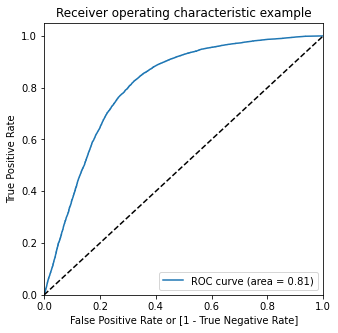

In [463]:
# Plot the ROC curve
draw_roc(y_train_pred_final.Churn, y_train_pred_final.Churn_Prob)

#### As it could be seen, the area under ROC curve is 0.84

In [464]:
# Create columns with different probability cutoffs 
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_train_pred_final[i]= y_train_pred_final.Churn_Prob.map(lambda x: 1 if x > i else 0)
y_train_pred_final.head()

,Churn,Churn_Prob,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0.0,0.586542,1,1,1,1,1,1,1,0,0,0,0
1,0.0,0.009693,0,1,0,0,0,0,0,0,0,0,0
2,0.0,0.688752,1,1,1,1,1,1,1,1,0,0,0
3,0.0,0.090489,0,1,0,0,0,0,0,0,0,0,0
4,0.0,0.543675,1,1,1,1,1,1,1,0,0,0,0


In [465]:
# Calculate accuracy sensitivity and specificity for various probability cutoffs.
cutoff_df = pd.DataFrame( columns = ['prob','accuracy','sensi','speci'])
# TP = confusion[1,1] # true positive 
# TN = confusion[0,0] # true negatives
# FP = confusion[0,1] # false positives
# FN = confusion[1,0] # false negatives

num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = metrics.confusion_matrix(y_train_pred_final.Churn, y_train_pred_final[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    cutoff_df.loc[i] =[ i ,accuracy,sensi,speci]
print(cutoff_df)

     prob  accuracy     sensi     speci
0.0   0.0  0.500000  1.000000  0.000000
0.1   0.1  0.572251  0.990008  0.154494
0.2   0.2  0.645846  0.970075  0.321617
0.3   0.3  0.707091  0.934926  0.479255
0.4   0.4  0.744624  0.878119  0.611128
0.5   0.5  0.748453  0.780889  0.716017
0.6   0.6  0.720379  0.636336  0.804423
0.7   0.7  0.655635  0.428992  0.882278
0.8   0.8  0.580620  0.219061  0.942179
0.9   0.9  0.524523  0.065683  0.983364


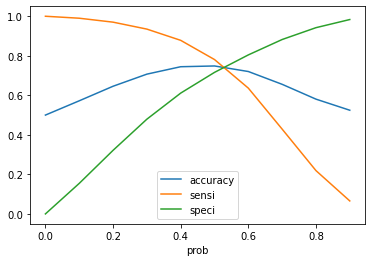

In [466]:
# Plot accuracy sensitivity and specificity for various probabilities.
cutoff_df.plot.line(x='prob', y=['accuracy','sensi','speci'])
plt.show()

#### As can be seen from the ROC curve, that all the curves for accuracy, sensitivity and specificity intersects around 0.55
#### But in this case, having greater sensitivity is very important, as would need to predict accurately great number who would Churn
#### Thus value of probability chosen is 0.4, where accuracy would not be much affected, but greater sensitivity will be achieved. In this scenario not a lot, but little decrease in specificity is accepted.

In [467]:
# Predicting as 1 where probability is greater than 0.4 and 0 where probability is less than 0.4
y_train_pred_final['final_predicted'] = y_train_pred_final.Churn_Prob.map( lambda x: 1 if x > 0.4 else 0)
y_train_pred_final.head()

,Churn,Churn_Prob,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,final_predicted
0,0.0,0.586542,1,1,1,1,1,1,1,0,0,0,0,1
1,0.0,0.009693,0,1,0,0,0,0,0,0,0,0,0,0
2,0.0,0.688752,1,1,1,1,1,1,1,1,0,0,0,1
3,0.0,0.090489,0,1,0,0,0,0,0,0,0,0,0,0
4,0.0,0.543675,1,1,1,1,1,1,1,0,0,0,0,1


In [468]:
# Displaying he accuracy
metrics.accuracy_score(y_train_pred_final.Churn, y_train_pred_final.final_predicted)

0.7446236559139785

In [469]:
# Displaying the confusion matrix
confusion2 = metrics.confusion_matrix(y_train_pred_final.Churn, y_train_pred_final.final_predicted )
confusion2

array([[12049,  7667],
       [ 2403, 17313]], dtype=int64)

In [470]:
# Assigning the values from confusion matrix
TP = confusion2[1,1] # true positive 
TN = confusion2[0,0] # true negatives
FP = confusion2[0,1] # false positives
FN = confusion2[1,0] # false negatives

In [471]:
# Displaying the sensitivity
TP / float(TP+FN)

0.878119293974437

In [472]:
# Displaying the specificity
TN / float(TN+FP)

0.61112801785352

In [473]:
# Displaying false postive rate - predicting churn when customer does not have churned
print(FP/ float(TN+FP))

0.38887198214648


In [474]:
# Displaying Positive predictive value 
print (TP / float(TP+FP))

0.6930744595676541


In [475]:
# Displaying Negative predictive value
print (TN / float(TN+ FN))

0.8337254359258234


#### Comparing the accuracy, sensitivity and specificity for probability cutoff of 0.5 and 0.4

#### Probability cutoff 0.5
<br> accuracy - 0.7484
<br> sensitivity - 0.7808
<br> specificity - 0.716

#### Probability cutoff 0.4
<br> accuracy - 0.7446
<br> sensitivity - 0.8781
<br> specificity - 0.6111

#### Thus it can be seen that accuracy is not much affected when changing probability cutoff from 0.5 to 0.4. There is increased in sensitivity and decrease in specificity. As sensitivity is the most important criteria of the model, as more correctly predicting the churn is very important, the probability cutoff of 0.4 is ok. While changing the probability cutoff from 0.5 to 0.4, specificity is decreased little, but not a lot, thus the probability cutoff of 0.4 is ok.

#### Run the model on Test Data

In [476]:
# Adding constant variable to the test input variabes. Here the number of input variables choosen are 12
X_test_sm = sm.add_constant(test_PCA_input_variables[col])

# Display the data
X_test_sm

,const,x4,x5,x9,x14,x16,x17,x19,x21,x22,x23,x24,x26
0,1.0,-0.096380,0.257603,-0.096488,-0.022551,-0.017186,0.034921,0.005189,0.008707,-0.000455,0.039160,-0.043617,0.046264
1,1.0,-0.070856,-0.312174,0.032952,0.087038,-0.042997,-0.129464,0.030488,-0.133136,0.089115,-0.040650,0.038107,0.039006
2,1.0,0.042870,-0.010447,0.035758,-0.052709,0.048331,-0.036148,0.011472,-0.030369,0.025928,-0.026941,-0.013335,-0.002094
3,1.0,0.155357,0.110798,-0.020195,-0.000175,-0.029314,-0.017769,-0.027883,0.042066,0.002426,-0.005464,0.031367,-0.010031
4,1.0,0.298919,-0.018558,-0.123782,-0.024397,-0.033767,-0.033472,-0.059636,0.022465,0.004331,-0.008397,0.012445,0.015767
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7176,1.0,-0.164126,0.083451,-0.182948,0.026282,-0.036654,0.008579,-0.064498,0.018123,-0.021691,-0.032108,0.056734,0.018345
7177,1.0,0.612373,-0.198272,-0.147555,0.003193,-0.025137,0.066285,0.051582,-0.026171,-0.032933,-0.036227,0.061245,-0.033716
7178,1.0,-0.070173,0.201383,0.110407,-0.040109,-0.005538,0.069093,0.104748,-0.019615,0.017460,0.039697,-0.041681,-0.008966
7179,1.0,-0.033063,0.152306,-0.030649,0.074732,-0.091885,0.001371,0.052171,-0.019564,-0.017397,0.001607,-0.007031,0.037510


In [477]:
# Predicting the probabilities values
y_test_pred = res.predict(X_test_sm)

# Converting it to dataframe
y_pred_1 = pd.DataFrame(y_test_pred)

In [478]:
# Converting test_telecom_output_variable to dataframe
y_test_df = pd.DataFrame(test_telecom_output_variable)

In [479]:
# Removing index for both dataframes
y_pred_1.reset_index(drop=True, inplace=True)
y_test_df.reset_index(drop=True, inplace=True)

In [480]:
# Appending y_test_df and y_pred_1
y_pred_final = pd.concat([y_test_df, y_pred_1],axis=1)

In [481]:
# Displaying the actual churn values and probabilities values
y_pred_final.head()

,churn,0
0,0.0,0.698376
1,0.0,0.460430
2,0.0,0.409424
3,0.0,0.227239
4,0.0,0.371594


In [482]:
# Renaming the column 
y_pred_final= y_pred_final.rename(columns={ 0 : 'Churn_Prob'})

# Choosing the probability cut-off value os 0.4, which was final value choosen in the Training model
y_pred_final['final_predicted'] = y_pred_final.Churn_Prob.map(lambda x: 1 if x > 0.4 else 0)

In [483]:
# Displaying the values
y_pred_final.head()

,churn,Churn_Prob,final_predicted
0,0.0,0.698376,1
1,0.0,0.460430,1
2,0.0,0.409424,1
3,0.0,0.227239,0
4,0.0,0.371594,0


In [484]:
# Displaying the accuracy
metrics.accuracy_score(y_pred_final.churn, y_pred_final.final_predicted)

0.6407185628742516

In [485]:
# Displaying the confusion matrix
confusion2 = metrics.confusion_matrix(y_pred_final.churn, y_pred_final.final_predicted )
confusion2

array([[4056, 2493],
       [  87,  545]], dtype=int64)

In [486]:
# Assigning the values of confusion matrix
TP = confusion2[1,1] # true positive 
TN = confusion2[0,0] # true negatives
FP = confusion2[0,1] # false positives
FN = confusion2[1,0] # false negatives

In [487]:
# Displaying the sensitivity
TP / float(TP+FN)

0.8623417721518988

In [488]:
# Displaying the specificity
TN / float(TN+FP)

0.619331195602382

#### Comparing the accuracy, sensitivity and specificity for probability cutoff of 0.4 for Training model and Testing data

#### Probability cutoff 0.4 - Training model
<br> sensitivity - 0.8781
<br> specificity - 0.6111

#### Probability cutoff 0.4 - Test data
<br> sensitivity - 0.8623
<br> specificity - 0.6193

#### Probability cut-off of 0.4 in Test data, has given Sensitivity value of 86.23%, which is ok. Sensitivity values for Training model and Test data are close to each other with probability cut-off of 0.4. Specificity values for Training model and Test data are close to each other with probability cut-off of 0.4.

# Random Forest

In [489]:
# Run the random forest
rfc = RandomForestClassifier()

In [490]:
# Fit data
rfc.fit(train_SMOTE_PCA_input_variables,train_SMOTE_output_variable)

RandomForestClassifier()

#### Making predictions on Test Data default model

In [491]:
# Making predictions Test Data
predictions = rfc.predict(test_PCA_input_variables)

In [492]:
# Displaying clasification report
print(classification_report(test_telecom_output_variable,predictions))

              precision    recall  f1-score   support

         0.0       0.96      0.93      0.95      6549
         1.0       0.46      0.59      0.52       632

    accuracy                           0.90      7181
   macro avg       0.71      0.76      0.73      7181
weighted avg       0.92      0.90      0.91      7181



In [493]:
# Displaying confusion matrix
confusion = confusion_matrix(test_telecom_output_variable,predictions)
confusion

array([[6118,  431],
       [ 261,  371]], dtype=int64)

In [494]:
# Displaying accuracy score
print(accuracy_score(test_telecom_output_variable,predictions))

0.9036345912825512


In [495]:
# Assigning the values of confusion matrix
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [496]:
# Displaying the sensitivity
TP / float(TP+FN)

0.5870253164556962

In [497]:
# Displaying the specificity
TN / float(TN+FP)

0.9341884257138494

#### As can be seen that the value of Sensitivity for Test data for default model is low. This the key metric and needs to be improed. Thus finding optimal values of hyperparameters will be done and based on that the optimal hyperparameter model will be built.

#### Find optimal max_depth

In [498]:
# GridSearchCV to find optimal max_depth
# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'max_depth': range(2, 15, 5)}

# instantiate the model
rf = RandomForestClassifier()

# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="accuracy",
                   return_train_score = True)
rf.fit(train_SMOTE_PCA_input_variables, train_SMOTE_output_variable)

GridSearchCV(cv=5, estimator=RandomForestClassifier(),
             param_grid={'max_depth': range(2, 15, 5)}, return_train_score=True,
             scoring='accuracy')

In [499]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,4.751911,0.130355,0.095115,0.025189,2,{'max_depth': 2},0.762140,0.772664,0.776820,0.764646,0.770099,0.769274,0.005318,3,0.775749,0.778222,0.768972,0.764503,0.767070,0.770903,0.005224
1,13.232013,0.306284,0.129902,0.009740,7,{'max_depth': 7},0.839102,0.841638,0.851509,0.847832,0.851129,0.846242,0.005026,2,0.862736,0.859122,0.856717,0.859158,0.860870,0.859721,0.002005
2,19.851665,0.370311,0.215387,0.025845,12,{'max_depth': 12},0.908964,0.908457,0.915039,0.909079,0.913518,0.911011,0.002719,1,0.950547,0.951434,0.951436,0.952736,0.952545,0.951740,0.000806


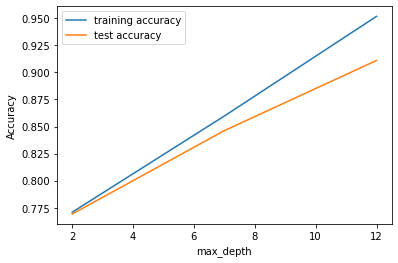

In [500]:
# plotting accuracies with max_depth
plt.figure()
plt.plot(scores["param_max_depth"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_max_depth"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("max_depth")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

#### Find optimal n_estimators

In [501]:
# GridSearchCV to find optimal n_estimators
# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'n_estimators': range(100, 500, 250)}

# instantiate the model (note we are specifying a max_depth)
rf = RandomForestClassifier(max_depth=4)

# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="accuracy",
                   return_train_score = True)
rf.fit(train_SMOTE_PCA_input_variables, train_SMOTE_output_variable)

GridSearchCV(cv=5, estimator=RandomForestClassifier(max_depth=4),
             param_grid={'n_estimators': range(100, 500, 250)},
             return_train_score=True, scoring='accuracy')

In [502]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,8.525485,0.480816,0.107644,0.016370,100,{'n_estimators': 100},0.793077,0.790288,0.804337,0.793431,0.804590,0.797145,0.006075,1,0.805453,0.804343,0.797407,0.795695,0.802511,0.801082,0.003855
1,28.398478,0.684416,0.353308,0.025637,350,{'n_estimators': 350},0.789147,0.786738,0.805351,0.798630,0.804083,0.796790,0.007607,2,0.803233,0.801363,0.800165,0.800133,0.800197,0.801018,0.001201


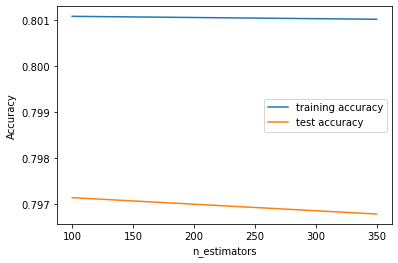

In [503]:
# plotting accuracies with n_estimators
plt.figure()
plt.plot(scores["param_n_estimators"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_n_estimators"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("n_estimators")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

#### Find optimal max_features

In [504]:
# GridSearchCV to find optimal max_features
# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'max_features': [4, 10, 16, 22, 28]}

# instantiate the model
rf = RandomForestClassifier(max_depth=4)

# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="accuracy",
                   return_train_score = True)
rf.fit(train_SMOTE_PCA_input_variables, train_SMOTE_output_variable)

GridSearchCV(cv=5, estimator=RandomForestClassifier(max_depth=4),
             param_grid={'max_features': [4, 10, 16, 22, 28]},
             return_train_score=True, scoring='accuracy')

In [505]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_features,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,6.913311,0.229422,0.107338,0.015926,4,{'max_features': 4},0.790415,0.794472,0.805605,0.803196,0.799265,0.798590,0.005562,1,0.803043,0.804184,0.797914,0.804222,0.798580,0.801589,0.002769
1,15.978911,0.402774,0.098539,0.006847,10,{'max_features': 10},0.790795,0.785089,0.804590,0.793685,0.798884,0.794609,0.006692,2,0.800349,0.800222,0.795220,0.796931,0.796266,0.797798,0.002104
2,24.230549,0.689169,0.094750,0.007116,16,{'max_features': 16},0.783568,0.786484,0.801040,0.797362,0.799645,0.793620,0.007174,3,0.794611,0.800856,0.791099,0.798358,0.797090,0.796403,0.003331
3,33.305518,0.539407,0.100851,0.009258,22,{'max_features': 22},0.783188,0.774439,0.802688,0.793685,0.793812,0.789562,0.009764,4,0.792107,0.790680,0.794142,0.794681,0.791384,0.792599,0.001557
4,45.610729,6.267648,0.111902,0.010268,28,{'max_features': 28},0.781412,0.773551,0.799011,0.787471,0.788740,0.786037,0.008426,5,0.792202,0.786812,0.791130,0.789007,0.787422,0.789315,0.002077


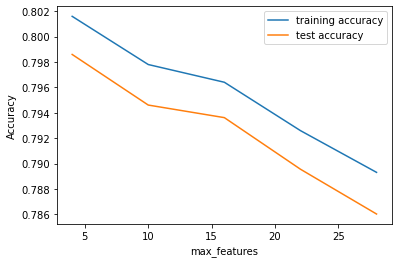

In [506]:
# plotting accuracies with max_features
plt.figure()
plt.plot(scores["param_max_features"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_max_features"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("max_features")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

#### Find optimal min_samples_leaf

In [507]:
# GridSearchCV to find optimal min_samples_leaf
# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'min_samples_leaf': range(120, 500, 60)}

# instantiate the model
rf = RandomForestClassifier()


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="accuracy",
                   return_train_score = True)
rf.fit(train_SMOTE_PCA_input_variables, train_SMOTE_output_variable)

GridSearchCV(cv=5, estimator=RandomForestClassifier(),
             param_grid={'min_samples_leaf': range(120, 500, 60)},
             return_train_score=True, scoring='accuracy')

In [508]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,16.895487,1.643800,0.171701,0.042503,120,{'min_samples_leaf': 120},0.835045,0.836693,0.852397,0.844535,0.845803,0.842894,0.006348,1,0.854874,0.852877,0.851740,0.852882,0.851835,0.852842,0.001128
1,15.162934,0.587634,0.174206,0.022177,180,{'min_samples_leaf': 180},0.825155,0.829213,0.841618,0.837560,0.840096,0.834729,0.006424,2,0.843779,0.842669,0.839568,0.843784,0.842991,0.842558,0.001558
2,13.920873,0.810661,0.140523,0.005574,240,{'min_samples_leaf': 240},0.820464,0.820210,0.836546,0.829445,0.833756,0.828084,0.006718,3,0.837185,0.833286,0.833703,0.834147,0.836461,0.834956,0.001565
3,12.841922,1.004568,0.142118,0.022090,300,{'min_samples_leaf': 300},0.816026,0.819069,0.829445,0.827035,0.826021,0.823519,0.005093,4,0.833254,0.829260,0.826381,0.830153,0.829455,0.829701,0.002196
4,13.216715,0.689062,0.148159,0.023028,360,{'min_samples_leaf': 360},0.810321,0.809053,0.825767,0.823865,0.822343,0.818270,0.007103,5,0.825963,0.822793,0.821974,0.825461,0.824320,0.824102,0.001523


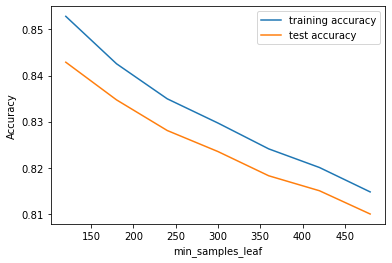

In [509]:
# plotting accuracies with min_samples_leaf
plt.figure()
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("min_samples_leaf")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

#### Find optimal min_samples_split

In [510]:
# GridSearchCV to find optimal min_samples_split
# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'min_samples_split': range(150, 400, 50)}

# instantiate the model
rf = RandomForestClassifier()


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="accuracy",
                   return_train_score = True)
rf.fit(train_SMOTE_PCA_input_variables, train_SMOTE_output_variable)

GridSearchCV(cv=5, estimator=RandomForestClassifier(),
             param_grid={'min_samples_split': range(150, 400, 50)},
             return_train_score=True, scoring='accuracy')

In [511]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,26.905293,0.480918,0.272394,0.054936,150,{'min_samples_split': 150},0.865094,0.873082,0.877758,0.873700,0.872939,0.872515,0.004110,1,0.895736,0.893581,0.894979,0.895740,0.893457,0.894698,0.001003
1,23.954784,1.407385,0.244871,0.047551,200,{'min_samples_split': 200},0.855966,0.861544,0.870150,0.864443,0.866345,0.863690,0.004767,2,0.884768,0.879632,0.881665,0.883789,0.882077,0.882386,0.001780
2,22.013484,1.035293,0.231466,0.035602,250,{'min_samples_split': 250},0.848612,0.855078,0.861273,0.857342,0.858864,0.856234,0.004312,3,0.874972,0.872119,0.872250,0.874659,0.872884,0.873377,0.001207
3,19.623666,0.294115,0.173468,0.014185,300,{'min_samples_split': 300},0.844554,0.849372,0.857215,0.854679,0.853284,0.851821,0.004432,4,0.869773,0.866255,0.864008,0.866988,0.865371,0.866479,0.001923
4,19.897045,0.997228,0.186061,0.021461,350,{'min_samples_split': 350},0.838722,0.842145,0.854045,0.848973,0.851255,0.847028,0.005722,5,0.862007,0.857886,0.858270,0.860775,0.859221,0.859632,0.001550


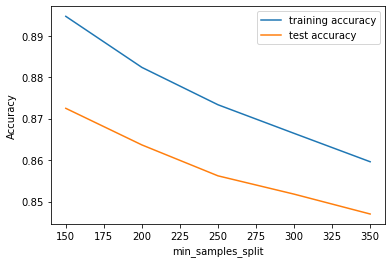

In [512]:
# plotting accuracies with min_samples_split
plt.figure()
plt.plot(scores["param_min_samples_split"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_min_samples_split"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("min_samples_split")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

#### Grid search to find optimal hyper parameters from max_depth, min_samples_leaf, min_samples_split, n_estimators, max_features

In [513]:
# Create the parameter grid based on the results of random search 
param_grid = {
    'max_depth': [9,10],
    'min_samples_leaf': range(150, 250, 100),
    'min_samples_split': range(150, 250, 100),
    'n_estimators': [100,150],
    'max_features': [10, 15]
}
# Create a based model
rf = RandomForestClassifier()
# Instantiate the grid search model
grid_search = GridSearchCV(estimator = rf, param_grid = param_grid, 
                          cv = 3, n_jobs = -1,verbose = 1,return_train_score = True)

In [514]:
# Fit the grid search to the data
grid_search.fit(train_SMOTE_PCA_input_variables, train_SMOTE_output_variable)

Fitting 3 folds for each of 8 candidates, totalling 24 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  24 out of  24 | elapsed:  6.8min finished


GridSearchCV(cv=3, estimator=RandomForestClassifier(), n_jobs=-1,
             param_grid={'max_depth': [9, 10], 'max_features': [10, 15],
                         'min_samples_leaf': range(150, 250, 100),
                         'min_samples_split': range(150, 250, 100),
                         'n_estimators': [100, 150]},
             return_train_score=True, verbose=1)

In [515]:
# printing the optimal accuracy score and hyperparameters
print('We can get accuracy of',grid_search.best_score_,'using',grid_search.best_params_)

We can get accuracy of 0.8376191925339826 using {'max_depth': 10, 'max_features': 15, 'min_samples_leaf': 150, 'min_samples_split': 150, 'n_estimators': 100}


#### Model with best hyperparameters

In [516]:
# model with the best hyperparameters
rfc = RandomForestClassifier(bootstrap=True,
                             max_depth=10,
                             min_samples_leaf=150, 
                             min_samples_split=150,
                             max_features=10,
                             n_estimators=100)

In [517]:
# fit the model
rfc.fit(train_SMOTE_PCA_input_variables, train_SMOTE_output_variable)

RandomForestClassifier(max_depth=10, max_features=10, min_samples_leaf=150,
                       min_samples_split=150, n_estimators=150)

#### Making predictions on Train data for optimal hyperparameter model

In [518]:
# predictions on the data
predictions = rfc.predict(train_SMOTE_PCA_input_variables)

In [519]:
# evaluation metrics
from sklearn.metrics import classification_report,confusion_matrix

In [520]:
# Display classification report
print(classification_report(train_SMOTE_output_variable,predictions))

              precision    recall  f1-score   support

         0.0       0.86      0.85      0.85     19716
         1.0       0.85      0.86      0.85     19716

    accuracy                           0.85     39432
   macro avg       0.85      0.85      0.85     39432
weighted avg       0.85      0.85      0.85     39432



In [521]:
# Displaying confusion matrix
confusion = confusion_matrix(train_SMOTE_output_variable,predictions)
confusion

array([[16768,  2948],
       [ 2831, 16885]], dtype=int64)

In [522]:
# Displaying accuracy score
print(accuracy_score(train_SMOTE_output_variable,predictions))

0.8534439034286874


In [523]:
# Assigning the values of confusion matrix
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [524]:
# Displaying the sensitivity
TP / float(TP+FN)

0.8564110367214445

In [525]:
# Displaying the specificity
TN / float(TN+FP)

0.8504767701359303

#### Making predictions on Test data for optimal hyperparameter model

In [526]:
# predictions on the data
predictions = rfc.predict(test_PCA_input_variables)

In [527]:
# Display classification report
print(classification_report(test_telecom_output_variable,predictions))

              precision    recall  f1-score   support

         0.0       0.98      0.85      0.91      6549
         1.0       0.33      0.79      0.47       632

    accuracy                           0.84      7181
   macro avg       0.66      0.82      0.69      7181
weighted avg       0.92      0.84      0.87      7181



In [528]:
# Displaying confusion matrix
confusion = confusion_matrix(test_telecom_output_variable,predictions)
confusion

array([[5552,  997],
       [ 133,  499]], dtype=int64)

In [529]:
# Displaying accuracy score
print(accuracy_score(test_telecom_output_variable,predictions))

0.8426403007937613


In [530]:
# Assigning the values of confusion matrix
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [531]:
# Sensitivity of the model
TP / float(TP+FN)

0.7895569620253164

In [532]:
# Specificity of the model
TN / float(TN+FP)

0.8477630172545427

#### For default model, the accuracy, sensitivity and specificity for Test Data are:
<br> accuracy - 0.9036
<br> sensitivity - 0.587
<br> specificity - 0.9341

#### The sensitivity is low and it is the key metric. Thus grid search for hyper parameters max_depth, min_samples_leaf, min_samples_split, max_features, n_estimators is done

#### The optimal hyper parapeters choosen in final model are:
<br> max_depth=10
<br> min_samples_leaf = 150
<br> min_samples_split = 150
<br> max_features = 10
<br> n_estimators = 150

#### The accuracy, sensitivity and specificity values for optimal hyper parameters for Train Data are:
<br> accuracy - 0.855
<br> sensitivity - 0.8462
<br> specificity - 0.8639

#### The accuracy, sensitivity and specificity values for optimal hyper parameters for Test Data are:
<br> accuracy - 0.8533
<br> sensitivity - 0.7552
<br> specificity - 0.8627

#### Thus it can be seen that sensitivity for Test Data has increased significantly from 0.5552 in default model to 0.7552 in optimal hyper parameter model

# Logistic Regression without PCA

In [533]:
# Building the model
logm1 = sm.GLM(train_SMOTE_output_variable,(sm.add_constant(train_SMOTE_input_variables)), family = sm.families.Binomial())
logm1.fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  churn   No. Observations:                39432
Model:                            GLM   Df Residuals:                    39287
Model Family:                Binomial   Df Model:                          144
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -14179.
Date:                Mon, 02 Nov 2020   Deviance:                       28359.
Time:                        22:38:44   Pearson chi2:                 6.00e+06
No. Iterations:                     8                                         
Covariance Type:            nonrobust                                         
====================================================================================================
                                       coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------------
const                                1.0074      0.088     11.404      0.000       0.834       1.181
arpu_6                              15.7768      6.105      2.584      0.010       3.811      27.743
arpu_7                              29.7186      8.153      3.645      0.000      13.740      45.697
arpu_8                              45.5877      9.073      5.024      0.000      27.804      63.371
onnet_mou_6                        -15.9450     30.861     -0.517      0.605     -76.431      44.541
onnet_mou_7                        -58.8320     19.528     -3.013      0.003     -97.106     -20.558
onnet_mou_8                         50.7767     35.619      1.426      0.154     -19.036     120.589
offnet_mou_6                       -14.8095     34.731     -0.426      0.670     -82.880      53.261
offnet_mou_7                       -76.4108     22.081     -3.460      0.001    -119.690     -33.132
offnet_mou_8                        57.9084     45.243      1.280      0.201     -30.766     146.583
roam_ic_mou_6                        0.6177      0.903      0.684      0.494      -1.151       2.387
roam_ic_mou_7                        1.5433      1.628      0.948      0.343      -1.647       4.733
roam_ic_mou_8                        4.3535      1.648      2.642      0.008       1.124       7.583
roam_og_mou_6                        5.3212     13.196      0.403      0.687     -20.542      31.184
roam_og_mou_7                       17.0824      4.427      3.859      0.000       8.406      25.759
roam_og_mou_8                      -14.2319     11.457     -1.242      0.214     -36.688       8.224
loc_og_t2t_mou_6                  1.017e+05   1.99e+04      5.110      0.000    6.27e+04    1.41e+05
loc_og_t2t_mou_7                 -2.551e+04   2.27e+04     -1.125      0.260   -6.99e+04    1.89e+04
loc_og_t2t_mou_8                  3.699e+05   3.44e+04     10.751      0.000    3.02e+05    4.37e+05
loc_og_t2m_mou_6                  6.663e+04    1.3e+04      5.109      0.000    4.11e+04    9.22e+04
loc_og_t2m_mou_7                 -1.536e+04   1.37e+04     -1.125      0.260   -4.21e+04    1.14e+04
loc_og_t2m_mou_8                   1.22e+05   1.13e+04     10.752      0.000    9.98e+04    1.44e+05
loc_og_t2f_mou_6                   2.32e+04   4538.840      5.112      0.000    1.43e+04    3.21e+04
loc_og_t2f_mou_7                 -4134.7552   3665.359     -1.128      0.259   -1.13e+04    3049.216
loc_og_t2f_mou_8                  1.983e+04   1844.607     10.751      0.000    1.62e+04    2.34e+04
loc_og_t2c_mou_6                    -0.7704      0.721     -1.068      0.285      -2.184       0.643
loc_og_t2c_mou_7                     2.9223      1.158      2.525      0.012       0.654       5.191
loc_og_t2c_mou_8                     0.3010      1.20

In [534]:
# RFE with 12 variables
logreg = LogisticRegression()
rfe = RFE(logreg, 12)             
rfe = rfe.fit(train_SMOTE_input_variables, train_SMOTE_output_variable)

In [535]:
# Displaying rfe.support_
rfe.support_

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False,  True, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False,  True, False, False, False, False,
       False, False, False, False, False, False, False, False,  True,
       False, False, False, False, False,  True, False, False, False,
       False, False,  True, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False,  True,
       False, False,  True, False, False, False, False, False, False,
       False, False,  True, False, False, False, False, False, False,
       False, False,  True, False, False,  True, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False,

In [536]:
# Displaying the list of variables with True and False values
list(zip(train_SMOTE_input_variables.columns, rfe.support_, rfe.ranking_))

[('arpu_6', False, 11),
 ('arpu_7', False, 35),
 ('arpu_8', False, 78),
 ('onnet_mou_6', False, 109),
 ('onnet_mou_7', False, 85),
 ('onnet_mou_8', False, 19),
 ('offnet_mou_6', False, 101),
 ('offnet_mou_7', False, 59),
 ('offnet_mou_8', False, 18),
 ('roam_ic_mou_6', False, 89),
 ('roam_ic_mou_7', False, 51),
 ('roam_ic_mou_8', False, 12),
 ('roam_og_mou_6', False, 135),
 ('roam_og_mou_7', False, 17),
 ('roam_og_mou_8', False, 2),
 ('loc_og_t2t_mou_6', False, 87),
 ('loc_og_t2t_mou_7', False, 111),
 ('loc_og_t2t_mou_8', False, 24),
 ('loc_og_t2m_mou_6', False, 23),
 ('loc_og_t2m_mou_7', False, 125),
 ('loc_og_t2m_mou_8', True, 1),
 ('loc_og_t2f_mou_6', False, 81),
 ('loc_og_t2f_mou_7', False, 121),
 ('loc_og_t2f_mou_8', False, 25),
 ('loc_og_t2c_mou_6', False, 103),
 ('loc_og_t2c_mou_7', False, 66),
 ('loc_og_t2c_mou_8', False, 67),
 ('loc_og_mou_6', False, 50),
 ('loc_og_mou_7', False, 124),
 ('loc_og_mou_8', False, 6),
 ('std_og_t2t_mou_6', False, 63),
 ('std_og_t2t_mou_7', False, 

In [591]:
# Assigning the names of 12 columns choosen in RFE
col = train_SMOTE_input_variables.columns[rfe.support_]

In [592]:
# Building model with 12 variables
X_train_sm = sm.add_constant(train_SMOTE_input_variables[col])
logm2 = sm.GLM(train_SMOTE_output_variable,X_train_sm, family = sm.families.Binomial())
res = logm2.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  churn   No. Observations:                39432
Model:                            GLM   Df Residuals:                    39419
Model Family:                Binomial   Df Model:                           12
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -16992.
Date:                Mon, 02 Nov 2020   Deviance:                       33984.
Time:                        22:59:52   Pearson chi2:                 9.06e+12
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
==============================================================================================
                                 coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------
const                          1.7824      0.026     67.450      0.000       1.731       1.834
loc_og_t2m_mou_8              -5.3487      0.716     -7.472      0.000      -6.752      -3.946
std_og_mou_7                   8.4132      0.446     18.850      0.000       7.538       9.288
total_og_mou_8               -18.9971      0.761    -24.956      0.000     -20.489     -17.505
loc_ic_t2m_mou_8             -23.5725      2.127    -11.083      0.000     -27.741     -19.404
loc_ic_mou_8                   0.5822      1.676      0.347      0.728      -2.702       3.867
total_ic_mou_8               -11.3091      1.145     -9.877      0.000     -13.553      -9.065
spl_ic_mou_8                 -26.4921      1.384    -19.136      0.000     -29.205     -23.779
total_rech_num_8             -15.6261      0.497    -31.448      0.000     -16.600     -14.652
last_day_rch_amt_8           -19.0287      0.763    -24.945      0.000     -20.524     -17.534
total_rech_data_8             -9.2095      0.532    -17.298      0.000     -10.253      -8.166
monthly_3g_8                 -10.5156      0.898    -11.714      0.000     -12.275      -8.756
total_avg_rech_amt_6_and_7    26.9403      1.303     20.682      0.000      24.387      29.493
==============================================================================================
"""

In [593]:
# Computing predicted values on the Train set
y_train_pred = res.predict(X_train_sm)

# Reshaping the data frame
y_train_pred = y_train_pred.values.reshape(-1)
y_train_actual = train_SMOTE_output_variable.values.reshape(-1)

In [594]:
# Assigning the probabilities with the actual output train data
y_train_pred_final = pd.DataFrame({'Churn':y_train_actual, 'Churn_Prob':y_train_pred})
y_train_pred_final.head()

,Churn,Churn_Prob
0,0.0,0.407470
1,0.0,0.000751
2,0.0,0.677392
3,0.0,0.157812
4,0.0,0.217124


In [595]:
# Selecting the values as 1 if prbability is greater than 0.5 and 0 if prability is less tha or equal to 0.5
y_train_pred_final['predicted'] = y_train_pred_final.Churn_Prob.map(lambda x: 1 if x > 0.5 else 0)
y_train_pred_final.head()

,Churn,Churn_Prob,predicted
0,0.0,0.407470,0
1,0.0,0.000751,0
2,0.0,0.677392,1
3,0.0,0.157812,0
4,0.0,0.217124,0


In [596]:
# Displaying confusion matrix
confusion = metrics.confusion_matrix(y_train_pred_final.Churn, y_train_pred_final.predicted )
print(confusion)

[[15727  3989]
 [ 3117 16599]]


In [597]:
# Displaying accuracu score
print(metrics.accuracy_score(y_train_pred_final.Churn, y_train_pred_final.predicted))

0.8197910326638264


In [598]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = train_SMOTE_input_variables[col].columns
vif['VIF'] = [variance_inflation_factor(train_SMOTE_input_variables[col].values, i) for i in range(train_SMOTE_input_variables[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
4,loc_ic_mou_8,11.33
5,total_ic_mou_8,7.72
3,loc_ic_t2m_mou_8,5.96
2,total_og_mou_8,3.71
7,total_rech_num_8,2.70
1,std_og_mou_7,2.46
0,loc_og_t2m_mou_8,2.40
11,total_avg_rech_amt_6_and_7,1.65
8,last_day_rch_amt_8,1.43
9,total_rech_data_8,1.36


In [599]:
# Dropping the column loc_ic_mou_8 with highest VIF value
col = col.drop('loc_ic_mou_8', 1)
col

Index(['loc_og_t2m_mou_8', 'std_og_mou_7', 'total_og_mou_8',
       'loc_ic_t2m_mou_8', 'total_ic_mou_8', 'spl_ic_mou_8',
       'total_rech_num_8', 'last_day_rch_amt_8', 'total_rech_data_8',
       'monthly_3g_8', 'total_avg_rech_amt_6_and_7'],
      dtype='object')

In [600]:
# Let's re-run the model using the selected variables
X_train_sm = sm.add_constant(train_SMOTE_input_variables[col])
logm3 = sm.GLM(train_SMOTE_output_variable,X_train_sm, family = sm.families.Binomial())
res = logm3.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  churn   No. Observations:                39432
Model:                            GLM   Df Residuals:                    39420
Model Family:                Binomial   Df Model:                           11
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -16992.
Date:                Mon, 02 Nov 2020   Deviance:                       33984.
Time:                        23:00:00   Pearson chi2:                 9.21e+12
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
==============================================================================================
                                 coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------
const                          1.7828      0.026     67.524      0.000       1.731       1.835
loc_og_t2m_mou_8              -5.3412      0.715     -7.467      0.000      -6.743      -3.939
std_og_mou_7                   8.3997      0.445     18.895      0.000       7.528       9.271
total_og_mou_8               -18.9863      0.761    -24.964      0.000     -20.477     -17.496
loc_ic_t2m_mou_8             -23.1658      1.783    -12.992      0.000     -26.661     -19.671
total_ic_mou_8               -11.0477      0.856    -12.908      0.000     -12.725      -9.370
spl_ic_mou_8                 -26.5035      1.384    -19.149      0.000     -29.216     -23.791
total_rech_num_8             -15.6348      0.496    -31.504      0.000     -16.607     -14.662
last_day_rch_amt_8           -19.0344      0.763    -24.957      0.000     -20.529     -17.540
total_rech_data_8             -9.2077      0.532    -17.296      0.000     -10.251      -8.164
monthly_3g_8                 -10.5222      0.898    -11.723      0.000     -12.281      -8.763
total_avg_rech_amt_6_and_7    26.9459      1.303     20.676      0.000      24.392      29.500
==============================================================================================
"""

In [601]:
# Computing the predicted values on the train set
y_train_pred = res.predict(X_train_sm)

# Re-shaping the data
y_train_pred = y_train_pred.values.reshape(-1)
y_train_actual = train_SMOTE_output_variable.values.reshape(-1)

In [602]:
# assigning the probabilities with the actual output train data
y_train_pred_final = pd.DataFrame({'Churn':y_train_actual, 'Churn_Prob':y_train_pred})
y_train_pred_final.head()

,Churn,Churn_Prob
0,0.0,0.407288
1,0.0,0.000745
2,0.0,0.677359
3,0.0,0.156967
4,0.0,0.215636


In [604]:
# Selecting the values as 1 if prbability is greater than 0.5 and 0 if prability is less tha or equal to 0.5
y_train_pred_final['predicted'] = y_train_pred_final.Churn_Prob.map(lambda x: 1 if x > 0.5 else 0)
y_train_pred_final.head()

,Churn,Churn_Prob,predicted
0,0.0,0.407288,0
1,0.0,0.000745,0
2,0.0,0.677359,1
3,0.0,0.156967,0
4,0.0,0.215636,0


In [605]:
# Displaying confusion matrix
confusion = metrics.confusion_matrix(y_train_pred_final.Churn, y_train_pred_final.predicted )
print(confusion)

[[15730  3986]
 [ 3115 16601]]


In [606]:
# Displaying accuracy score
print(metrics.accuracy_score(y_train_pred_final.Churn, y_train_pred_final.predicted))

0.8199178332318929


In [607]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = train_SMOTE_input_variables[col].columns
vif['VIF'] = [variance_inflation_factor(train_SMOTE_input_variables[col].values, i) for i in range(train_SMOTE_input_variables[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
3,loc_ic_t2m_mou_8,4.09
4,total_ic_mou_8,3.97
2,total_og_mou_8,3.71
6,total_rech_num_8,2.70
1,std_og_mou_7,2.45
0,loc_og_t2m_mou_8,2.40
10,total_avg_rech_amt_6_and_7,1.65
7,last_day_rch_amt_8,1.43
8,total_rech_data_8,1.36
9,monthly_3g_8,1.16


#### All the VIF values are acceptable now

In [553]:
# Assigning the values from confusion matrix
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [554]:
# Sensitivity value
TP / float(TP+FN)

0.842006492189085

In [555]:
# Specificity value
TN / float(TN+FP)

0.7978291742747008

In [556]:
# False postive rate - predicting churn when customer does not have churned
print(FP/ float(TN+FP))

0.20217082572529924


In [557]:
# Positive predictive value 
print (TP / float(TP+FP))

0.8063826686744062


In [558]:
# Negative predictive value
print (TN / float(TN+ FN))

0.8347041655611568


In [559]:
# Function for ROC curve
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(5, 5))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()
    return None

In [560]:
# Compting fpr, tpr and thresholds
fpr, tpr, thresholds = metrics.roc_curve( y_train_pred_final.Churn, y_train_pred_final.Churn_Prob, drop_intermediate = False )

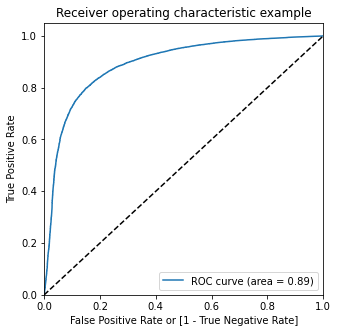

In [561]:
# ROC function
draw_roc(y_train_pred_final.Churn, y_train_pred_final.Churn_Prob)

In [562]:
# Create columns with different probability cutoffs 
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_train_pred_final[i]= y_train_pred_final.Churn_Prob.map(lambda x: 1 if x > i else 0)
y_train_pred_final.head()

,Churn,Churn_Prob,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0.0,0.407288,0,1,1,1,1,1,0,0,0,0,0
1,0.0,0.000745,0,1,0,0,0,0,0,0,0,0,0
2,0.0,0.677359,1,1,1,1,1,1,1,1,0,0,0
3,0.0,0.156967,0,1,1,0,0,0,0,0,0,0,0
4,0.0,0.215636,0,1,1,1,0,0,0,0,0,0,0


In [563]:
# Calculate accuracy sensitivity and specificity for various probability cutoffs.
cutoff_df = pd.DataFrame( columns = ['prob','accuracy','sensi','speci'])
from sklearn.metrics import confusion_matrix

num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = metrics.confusion_matrix(y_train_pred_final.Churn, y_train_pred_final[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    cutoff_df.loc[i] =[ i ,accuracy,sensi,speci]
print(cutoff_df)

     prob  accuracy     sensi     speci
0.0   0.0  0.500000  1.000000  0.000000
0.1   0.1  0.668772  0.976111  0.361432
0.2   0.2  0.732857  0.952577  0.513137
0.3   0.3  0.775233  0.924173  0.626293
0.4   0.4  0.803840  0.888568  0.719111
0.5   0.5  0.819918  0.842006  0.797829
0.6   0.6  0.822809  0.782765  0.862853
0.7   0.7  0.806578  0.702069  0.911087
0.8   0.8  0.759764  0.571617  0.947910
0.9   0.9  0.565531  0.144147  0.986914


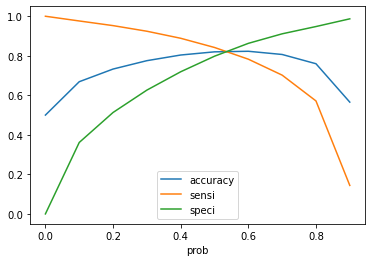

In [567]:
# Plot accuracy sensitivity and specificity for various probabilities.
cutoff_df.plot.line(x='prob', y=['accuracy','sensi','speci'])
plt.show()

#### As can be seen from the ROC curve, that all the curves for accuracy, sensitivity and specificity intersects around 0.55
#### But in this case, having greater sensitivity is very important, as would need to predict accurately great number who would Churn
#### Thus value of probability chosen is 0.4, where accuracy would not be much affected, but greater sensitivity will be achieved. In this scenario not a lot, but little decrease in specificity is accepted.

#### Train data analysis for proability cut-off greater than 0.4

In [623]:
y_train_pred_final['final_predicted'] = y_train_pred_final.Churn_Prob.map( lambda x: 1 if x > 0.4 else 0)

y_train_pred_final.head()

,Churn,Churn_Prob,predicted,final_predicted
0,0.0,0.407288,0,1
1,0.0,0.000745,0,0
2,0.0,0.677359,1,1
3,0.0,0.156967,0,0
4,0.0,0.215636,0,0


In [624]:
# Let's check the overall accuracy.
metrics.accuracy_score(y_train_pred_final.Churn, y_train_pred_final.final_predicted)

0.803839521201055

In [625]:
confusion2 = metrics.confusion_matrix(y_train_pred_final.Churn, y_train_pred_final.final_predicted )
confusion2

array([[14178,  5538],
       [ 2197, 17519]], dtype=int64)

In [627]:
TP = confusion2[1,1] # true positive 
TN = confusion2[0,0] # true negatives
FP = confusion2[0,1] # false positives
FN = confusion2[1,0] # false negatives

In [628]:
# Let's see the sensitivity of our logistic regression model
TP / float(TP+FN)

0.8885676607831203

In [629]:
# Let us calculate specificity
TN / float(TN+FP)

0.7191113816189897

#### Comparing the accuracy, sensitivity and specificity for probability cutoff of 0.5 and 0.4

#### Probability cutoff 0.5
<br> accuracy - 0.8199
<br> sensitivity - 0.8420
<br> specificity - 0.7978

#### Probability cutoff 0.4
<br> accuracy - 0.8038
<br> sensitivity - 0.8885
<br> specificity - 0.7191

#### Thus it can be seen that accuracy is not much affected when changing probability cutoff from 0.5 to 0.4. There is increased in sensitivity and decrease in specificity. As sensitivity is the most important criteria of the model, as more correctly predicting the churn is very important, the probability cutoff of 0.4 is ok. While changing the probability cutoff from 0.5 to 0.4, specificity is decreased little, but not a lot, thus the probability cutoff of 0.4 is ok.

#### Test data analysis for probability cut-off of 0.4

In [608]:
# Adding constant variable to the test input variabes. Here the number of input variables choosen are 10
X_test_sm = sm.add_constant(test_telecom_input_variables[col])

# Display the data
X_test_sm

,const,loc_og_t2m_mou_8,std_og_mou_7,total_og_mou_8,loc_ic_t2m_mou_8,total_ic_mou_8,spl_ic_mou_8,total_rech_num_8,last_day_rch_amt_8,total_rech_data_8,monthly_3g_8,total_avg_rech_amt_6_and_7
10988,1.0,0.007818,0.197462,0.064241,0.010937,0.029799,0.00000,0.092308,0.009094,0.000000,0.0,0.019048
7364,1.0,0.014818,0.000178,0.159003,0.003701,0.007732,0.00000,0.025641,0.043650,0.035088,0.0,0.000385
21957,1.0,0.032344,0.000732,0.028176,0.024585,0.043383,0.00000,0.046154,0.020309,0.070175,0.0,0.002088
15835,1.0,0.044010,0.002991,0.019172,0.020770,0.026694,0.00000,0.076923,0.015156,0.000000,0.0,0.013550
973,1.0,0.013456,0.000000,0.004914,0.005190,0.008652,0.00000,0.041026,0.009094,0.000000,0.0,0.003991
...,...,...,...,...,...,...,...,...,...,...,...,...
5898,1.0,0.000197,0.083231,0.079017,0.002227,0.010589,0.00000,0.133333,0.008184,0.070175,0.0,0.016589
5206,1.0,0.062763,0.032471,0.067080,0.033521,0.097143,0.05297,0.020513,0.043650,0.000000,0.0,0.000681
9925,1.0,0.016904,0.219299,0.075531,0.032571,0.038033,0.00000,0.025641,0.005153,0.017544,0.0,0.011582
26709,1.0,0.013371,0.062371,0.060057,0.019742,0.019713,0.00000,0.066667,0.030312,0.000000,0.0,0.000835


In [609]:
y_test_pred = res.predict(X_test_sm)
y_pred_1 = pd.DataFrame(y_test_pred)

In [610]:
# Converting y_test to dataframe
y_test_df = pd.DataFrame(test_telecom_output_variable)

In [611]:
# Removing index for both dataframes to append them side by side 
y_pred_1.reset_index(drop=True, inplace=True)
y_test_df.reset_index(drop=True, inplace=True)

In [612]:
# Appending y_test_df and y_pred_1
y_pred_final = pd.concat([y_test_df, y_pred_1],axis=1)

In [613]:
y_pred_final.head()

,churn,0
0,0.0,0.621127
1,0.0,0.046117
2,0.0,0.158999
3,0.0,0.333302
4,0.0,0.667034


In [614]:
# Predicting as 1 where probability is greater than 0.4 and 0 where probability is less than 0.4
y_pred_final= y_pred_final.rename(columns={ 0 : 'Churn_Prob'})
y_pred_final['final_predicted'] = y_pred_final.Churn_Prob.map(lambda x: 1 if x > 0.4 else 0)
y_pred_final.head()

,churn,Churn_Prob,final_predicted
0,0.0,0.621127,1
1,0.0,0.046117,0
2,0.0,0.158999,0
3,0.0,0.333302,0
4,0.0,0.667034,1


In [615]:
# Displaying he accuracy
metrics.accuracy_score(y_pred_final.churn, y_pred_final.final_predicted)

0.7348558696560368

In [616]:
confusion2 = metrics.confusion_matrix(y_pred_final.churn, y_pred_final.final_predicted )
confusion2

array([[4743, 1806],
       [  98,  534]], dtype=int64)

In [617]:
# Assigning the values from confusion matrix
TP = confusion2[1,1] # true positive 
TN = confusion2[0,0] # true negatives
FP = confusion2[0,1] # false positives
FN = confusion2[1,0] # false negatives

In [618]:
# Displaying the sensitivity
TP / float(TP+FN)

0.8449367088607594

In [619]:
# Displaying the specificity
TN / float(TN+FP)

0.7242327072835547

In [620]:
# Displaying false postive rate - predicting churn when customer does not have churned
print(FP/ float(TN+FP))

0.27576729271644523


In [621]:
# Displaying Positive predictive value 
print (TP / float(TP+FP))

0.2282051282051282


In [622]:
# Displaying Negative predictive value
print (TN / float(TN+ FN))

0.9797562487089444


#### Comparing the accuracy, sensitivity and specificity for probability cutoff of 0.4 for Training model and Testing data

#### Probability cutoff 0.4 - Training model
<br> sensitivity - 0.8885
<br> specificity - 0.7191

#### Probability cutoff 0.4 - Test data
<br> sensitivity - 0.8493
<br> specificity - 0.7242

#### Probability cut-off of 0.4 in Test data, has given Sensitivity value of 84.93%, which is ok. 

## 3 models are completed:
<br> Logistic Regression with PCA (on input variables for test and train) and SMOTE (on train variable)
<br> Sensitivity on test data: 0.8623
<br> Specificity on test data: 0.6193

<br> Random Frrest with PCA (on input variables for test and train) and SMOTE (on train variable)
<br> Sensitivity on test data: 0.7552
<br> Specificity on test data: 0.8627

<br> Logistic Regression with SMOTE (on train variable)
<br> Sensitivity on test data: 0.8493
<br> Specificity on test data: 0.7242

<br> Based on the Sensitivity and Specificity analysis on Test data, following is the best model:
<br> Logistic Regression with SMOTE (on train variable)

# Recommendations
#### Based on the best chosen model i.e. Logistic Regression with SMOTE (on train variable), following are the most significant input variables. Management could monitor this variables to predict the potential churn in advance and take appropriate actions to stop the potential churn.
<br> loc_ic_t2m_mou_8
<br> total_ic_mou_8
<br> total_og_mou_8
<br> total_rech_num_8
<br> std_og_mou_7
<br> loc_og_t2m_mou_8
<br> total_avg_rech_amt_6_and_7
<br> last_day_rch_amt_8
<br> total_rech_data_8
<br> monthly_3g_8
<br> spl_ic_mou_8